In [1]:
# back to project root
%cd ~/research

import argparse
import gc
import os
import sys
import time
from glob import glob

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch
from tqdm import tqdm
import yaml
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
from torch import nn, optim

sys.path.append("src")
from group.passing.dataset import make_data_loaders, make_all_data
from group.passing.lstm_model import LSTMModel
from utility.activity_loader import load_individuals
from utility.logger import logger
from tools.train_passing import init_model, init_loss, init_optim, train, test

/raid6/home/yokoyama/research


/home/yokoyama/research/.venv/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams["font.size"] = 24
plt.rcParams['xtick.direction'] = 'in'  # x axis in
plt.rcParams['ytick.direction'] = 'in'  # y axis in

In [3]:
os.environ["CUDA_VISIBLE_DEVICES"] = "9"
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [4]:
cfg_path = "config/passing/pass_train.yaml"
with open(cfg_path, "r") as f:
    train_cfg = yaml.safe_load(f)
with open(train_cfg["config_path"]["individual"], "r") as f:
    ind_cfg = yaml.safe_load(f)
with open(train_cfg["config_path"]["group"], "r") as f:
    grp_cfg = yaml.safe_load(f)

In [5]:
data_dirs_all = {}
for room_num, surgery_items in train_cfg["dataset"]["setting"].items():
    for surgery_num in surgery_items.keys():
        dirs = sorted(glob(os.path.join("data", room_num, surgery_num, "passing", "*")))
        data_dirs_all[f"{room_num}_{surgery_num}"] = dirs

inds = {}
for key_prefix, dirs in tqdm(data_dirs_all.items()):
    for model_path in dirs:
        num = model_path.split("/")[-1]
        json_path = os.path.join(model_path, ".json", "individual.json")
        tmp_inds = load_individuals(json_path, ind_cfg)
        for pid, ind in tmp_inds.items():
            inds[f"{key_prefix}_{num}_{pid}"] = ind

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [01:18<00:00, 13.12s/it]


# グリッドサーチ

In [6]:
# create data loader
dataset_cfg = train_cfg["dataset"]
passing_defs = grp_cfg["passing"]["default"]
train_loader, val_loader, test_loader = make_data_loaders(
    inds, dataset_cfg, passing_defs, logger
)

2022-07-19 13:14:01,898 => createing time series 02_001
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:04<00:00,  3.98it/s]
2022-07-19 13:14:06,173 => createing time series 07_001
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:29<00:00,  1.62it/s]
2022-07-19 13:14:35,740 => createing time series 08_001
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:06<00:00,  6.27it/s]
2022-07-19 13:14:41,799 => createing time series 08_002
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:32<00:00,  1.40it/s]
2022-07-19 13:15:13,864 => createing time series 09_001
100%|██████████████

In [7]:
# model config
mdl_cfg = {
    "dropouts": [0.1, 0],
    "hidden_dims": [128, 64],
    "n_classes": 2,
    "n_linears": 2,
    "rnn_dropout": 0.1,
    "size": 4,
}

# grid search parameters
params = {
    'n_rnns': [1, 2, 3],
    'rnn_hidden_dim': [128, 256],
    'pos_weight': [8, 16, 32]
}

# epoch
# epoch_len = train_cfg["optim"]["epoch"]
epoch_len = 120

In [8]:
max_acc = [[0, 0, 0, 0], None]
max_pre = [[0, 0, 0, 0], None]
max_rcl = [[0, 0, 0, 0], None]
max_f1 = [[0, 0, 0, 0], None]
max_models = [None for _ in range(4)]

for n_rnns in params['n_rnns']:
    for dim in params['rnn_hidden_dim']:
        for weight in params['pos_weight']:
            param = dict(n_rnns=n_rnns, rnn_hidden_dim=dim, weight=weight)
            print(param)
            
            # update config
            config = {}
            for key, val in mdl_cfg.items():
                config[key] = val
            for key, val in param.items():
                config[key] = val
            pos_weight = param["weight"]
                
            # init model, loss, optim
            model = init_model(config, device)
            criterion = init_loss([1, pos_weight], device)
            optimizer, scheduler = init_optim(
                model, train_cfg["optim"]["lr"], train_cfg["optim"]["lr_rate"]
            )
            
            # training
            model, epoch, history = train(
                model, train_loader, val_loader,
                criterion, optimizer, scheduler,
                epoch_len, logger, device
            )
            
            # test
            score = test(model, test_loader, logger, device)
            acc, pre, rcl, f1 = score
            
            # update max scores
            if acc > max_acc[0][0]:
                max_acc[0] = score
                max_acc[1] = param
                max_models[0] = model
            if pre > max_pre[0][1]:
                max_pre[0] = score
                max_pre[1] = param
                max_models[1] = model
            if rcl > max_rcl[0][2]:
                max_rcl[0] = score
                max_rcl[1] = param
                max_models[2] = model
            if f1 > max_f1[0][3]:
                max_f1[0] = score
                max_f1[1] = param
                max_models[3] = model
                
            torch.cuda.empty_cache()

{'n_rnns': 1, 'rnn_hidden_dim': 128, 'weight': 8}


2022-07-19 13:19:01,762 => start training
2022-07-19 13:19:12,587 Epoch[1/120] train loss: 0.45487, val loss: nan, lr: 0.0010000, time: 10.82
2022-07-19 13:19:23,545 Epoch[2/120] train loss: 0.39842, val loss: nan, lr: 0.0010000, time: 10.96
2022-07-19 13:19:34,160 Epoch[3/120] train loss: 0.39556, val loss: nan, lr: 0.0010000, time: 10.61
2022-07-19 13:19:44,841 Epoch[4/120] train loss: 0.39433, val loss: nan, lr: 0.0010000, time: 10.68
2022-07-19 13:19:55,177 Epoch[5/120] train loss: 0.39346, val loss: nan, lr: 0.0010000, time: 10.33
2022-07-19 13:20:05,602 Epoch[6/120] train loss: 0.39281, val loss: nan, lr: 0.0010000, time: 10.42
2022-07-19 13:20:16,839 Epoch[7/120] train loss: 0.39173, val loss: nan, lr: 0.0010000, time: 11.23
2022-07-19 13:20:27,892 Epoch[8/120] train loss: 0.39142, val loss: nan, lr: 0.0010000, time: 11.05
2022-07-19 13:20:38,215 Epoch[9/120] train loss: 0.39184, val loss: nan, lr: 0.0010000, time: 10.32
2022-07-19 13:20:49,504 Epoch[10/120] train loss: 0.39078,

{'n_rnns': 1, 'rnn_hidden_dim': 128, 'weight': 16}


2022-07-19 13:41:05,918 Epoch[1/120] train loss: 0.47855, val loss: nan, lr: 0.0010000, time: 10.60
2022-07-19 13:41:16,621 Epoch[2/120] train loss: 0.43040, val loss: nan, lr: 0.0010000, time: 10.70
2022-07-19 13:41:27,432 Epoch[3/120] train loss: 0.42663, val loss: nan, lr: 0.0010000, time: 10.81
2022-07-19 13:41:37,880 Epoch[4/120] train loss: 0.42511, val loss: nan, lr: 0.0010000, time: 10.44
2022-07-19 13:41:48,608 Epoch[5/120] train loss: 0.42544, val loss: nan, lr: 0.0010000, time: 10.73
2022-07-19 13:41:59,596 Epoch[6/120] train loss: 0.42431, val loss: nan, lr: 0.0010000, time: 10.99
2022-07-19 13:42:10,271 Epoch[7/120] train loss: 0.42159, val loss: nan, lr: 0.0010000, time: 10.67
2022-07-19 13:42:20,913 Epoch[8/120] train loss: 0.41997, val loss: nan, lr: 0.0010000, time: 10.64
2022-07-19 13:42:31,460 Epoch[9/120] train loss: 0.41780, val loss: nan, lr: 0.0010000, time: 10.54
2022-07-19 13:42:42,476 Epoch[10/120] train loss: 0.41646, val loss: nan, lr: 0.0010000, time: 11.01

{'n_rnns': 1, 'rnn_hidden_dim': 128, 'weight': 32}


2022-07-19 14:03:04,441 Epoch[1/120] train loss: 0.52522, val loss: nan, lr: 0.0010000, time: 11.66
2022-07-19 14:03:14,920 Epoch[2/120] train loss: 0.48024, val loss: nan, lr: 0.0010000, time: 10.48
2022-07-19 14:03:26,727 Epoch[3/120] train loss: 0.47600, val loss: nan, lr: 0.0010000, time: 11.80
2022-07-19 14:03:38,137 Epoch[4/120] train loss: 0.47331, val loss: nan, lr: 0.0010000, time: 11.41
2022-07-19 14:03:49,755 Epoch[5/120] train loss: 0.47166, val loss: nan, lr: 0.0010000, time: 11.62
2022-07-19 14:04:00,091 Epoch[6/120] train loss: 0.46877, val loss: nan, lr: 0.0010000, time: 10.33
2022-07-19 14:04:11,796 Epoch[7/120] train loss: 0.46660, val loss: nan, lr: 0.0010000, time: 11.70
2022-07-19 14:04:22,103 Epoch[8/120] train loss: 0.46557, val loss: nan, lr: 0.0010000, time: 10.30
2022-07-19 14:04:33,308 Epoch[9/120] train loss: 0.46463, val loss: nan, lr: 0.0010000, time: 11.20
2022-07-19 14:04:44,958 Epoch[10/120] train loss: 0.46478, val loss: nan, lr: 0.0010000, time: 11.65

{'n_rnns': 1, 'rnn_hidden_dim': 256, 'weight': 8}


2022-07-19 14:25:13,885 Epoch[1/120] train loss: 0.44944, val loss: nan, lr: 0.0010000, time: 13.01
2022-07-19 14:25:26,833 Epoch[2/120] train loss: 0.39866, val loss: nan, lr: 0.0010000, time: 12.95
2022-07-19 14:25:39,867 Epoch[3/120] train loss: 0.39594, val loss: nan, lr: 0.0010000, time: 13.03
2022-07-19 14:25:52,857 Epoch[4/120] train loss: 0.39620, val loss: nan, lr: 0.0010000, time: 12.99
2022-07-19 14:26:06,170 Epoch[5/120] train loss: 0.39566, val loss: nan, lr: 0.0010000, time: 13.31
2022-07-19 14:26:19,240 Epoch[6/120] train loss: 0.39348, val loss: nan, lr: 0.0010000, time: 13.07
2022-07-19 14:26:32,379 Epoch[7/120] train loss: 0.39268, val loss: nan, lr: 0.0010000, time: 13.14
2022-07-19 14:26:45,418 Epoch[8/120] train loss: 0.39200, val loss: nan, lr: 0.0010000, time: 13.04
2022-07-19 14:26:58,465 Epoch[9/120] train loss: 0.39127, val loss: nan, lr: 0.0010000, time: 13.05
2022-07-19 14:27:11,663 Epoch[10/120] train loss: 0.39116, val loss: nan, lr: 0.0010000, time: 13.19

{'n_rnns': 1, 'rnn_hidden_dim': 256, 'weight': 16}


2022-07-19 14:51:41,829 Epoch[1/120] train loss: 0.46823, val loss: nan, lr: 0.0010000, time: 13.02
2022-07-19 14:51:54,868 Epoch[2/120] train loss: 0.42951, val loss: nan, lr: 0.0010000, time: 13.04
2022-07-19 14:52:07,905 Epoch[3/120] train loss: 0.42607, val loss: nan, lr: 0.0010000, time: 13.04
2022-07-19 14:52:20,895 Epoch[4/120] train loss: 0.42467, val loss: nan, lr: 0.0010000, time: 12.99
2022-07-19 14:52:33,902 Epoch[5/120] train loss: 0.42288, val loss: nan, lr: 0.0010000, time: 13.00
2022-07-19 14:52:46,977 Epoch[6/120] train loss: 0.42312, val loss: nan, lr: 0.0010000, time: 13.07
2022-07-19 14:53:00,043 Epoch[7/120] train loss: 0.42190, val loss: nan, lr: 0.0010000, time: 13.06
2022-07-19 14:53:13,116 Epoch[8/120] train loss: 0.41966, val loss: nan, lr: 0.0010000, time: 13.07
2022-07-19 14:53:26,050 Epoch[9/120] train loss: 0.41829, val loss: nan, lr: 0.0010000, time: 12.93
2022-07-19 14:53:39,060 Epoch[10/120] train loss: 0.41885, val loss: nan, lr: 0.0010000, time: 13.01

{'n_rnns': 1, 'rnn_hidden_dim': 256, 'weight': 32}


2022-07-19 15:18:08,165 Epoch[1/120] train loss: 0.56401, val loss: nan, lr: 0.0010000, time: 13.00
2022-07-19 15:18:21,218 Epoch[2/120] train loss: 0.48332, val loss: nan, lr: 0.0010000, time: 13.05
2022-07-19 15:18:34,328 Epoch[3/120] train loss: 0.47835, val loss: nan, lr: 0.0010000, time: 13.11
2022-07-19 15:18:47,388 Epoch[4/120] train loss: 0.47571, val loss: nan, lr: 0.0010000, time: 13.06
2022-07-19 15:19:00,482 Epoch[5/120] train loss: 0.47297, val loss: nan, lr: 0.0010000, time: 13.09
2022-07-19 15:19:13,608 Epoch[6/120] train loss: 0.47095, val loss: nan, lr: 0.0010000, time: 13.12
2022-07-19 15:19:26,832 Epoch[7/120] train loss: 0.46803, val loss: nan, lr: 0.0010000, time: 13.22
2022-07-19 15:19:39,869 Epoch[8/120] train loss: 0.46773, val loss: nan, lr: 0.0010000, time: 13.04
2022-07-19 15:19:52,896 Epoch[9/120] train loss: 0.47050, val loss: nan, lr: 0.0010000, time: 13.02
2022-07-19 15:20:05,945 Epoch[10/120] train loss: 0.46406, val loss: nan, lr: 0.0010000, time: 13.05

{'n_rnns': 2, 'rnn_hidden_dim': 128, 'weight': 8}


2022-07-19 15:44:33,867 Epoch[1/120] train loss: 0.43628, val loss: nan, lr: 0.0010000, time: 11.27
2022-07-19 15:44:44,755 Epoch[2/120] train loss: 0.39801, val loss: nan, lr: 0.0010000, time: 10.89
2022-07-19 15:44:55,629 Epoch[3/120] train loss: 0.39718, val loss: nan, lr: 0.0010000, time: 10.87
2022-07-19 15:45:06,571 Epoch[4/120] train loss: 0.39735, val loss: nan, lr: 0.0010000, time: 10.94
2022-07-19 15:45:17,663 Epoch[5/120] train loss: 0.39559, val loss: nan, lr: 0.0010000, time: 11.09
2022-07-19 15:45:28,726 Epoch[6/120] train loss: 0.39486, val loss: nan, lr: 0.0010000, time: 11.06
2022-07-19 15:45:39,603 Epoch[7/120] train loss: 0.39402, val loss: nan, lr: 0.0010000, time: 10.88
2022-07-19 15:45:50,782 Epoch[8/120] train loss: 0.39282, val loss: nan, lr: 0.0010000, time: 11.18
2022-07-19 15:46:01,737 Epoch[9/120] train loss: 0.39219, val loss: nan, lr: 0.0010000, time: 10.95
2022-07-19 15:46:12,673 Epoch[10/120] train loss: 0.39137, val loss: nan, lr: 0.0010000, time: 10.93

{'n_rnns': 2, 'rnn_hidden_dim': 128, 'weight': 16}


2022-07-19 16:06:52,789 Epoch[1/120] train loss: 0.49417, val loss: nan, lr: 0.0010000, time: 11.08
2022-07-19 16:07:04,238 Epoch[2/120] train loss: 0.43100, val loss: nan, lr: 0.0010000, time: 11.45
2022-07-19 16:07:15,227 Epoch[3/120] train loss: 0.42798, val loss: nan, lr: 0.0010000, time: 10.99
2022-07-19 16:07:26,281 Epoch[4/120] train loss: 0.42689, val loss: nan, lr: 0.0010000, time: 11.05
2022-07-19 16:07:37,246 Epoch[5/120] train loss: 0.42563, val loss: nan, lr: 0.0010000, time: 10.96
2022-07-19 16:07:48,244 Epoch[6/120] train loss: 0.42413, val loss: nan, lr: 0.0010000, time: 11.00
2022-07-19 16:07:59,130 Epoch[7/120] train loss: 0.42262, val loss: nan, lr: 0.0010000, time: 10.88
2022-07-19 16:08:10,086 Epoch[8/120] train loss: 0.42304, val loss: nan, lr: 0.0010000, time: 10.95
2022-07-19 16:08:21,047 Epoch[9/120] train loss: 0.42070, val loss: nan, lr: 0.0010000, time: 10.96
2022-07-19 16:08:31,999 Epoch[10/120] train loss: 0.41827, val loss: nan, lr: 0.0010000, time: 10.95

{'n_rnns': 2, 'rnn_hidden_dim': 128, 'weight': 32}


2022-07-19 16:29:17,540 Epoch[1/120] train loss: 0.53854, val loss: nan, lr: 0.0010000, time: 11.15
2022-07-19 16:29:28,661 Epoch[2/120] train loss: 0.48237, val loss: nan, lr: 0.0010000, time: 11.12
2022-07-19 16:29:39,819 Epoch[3/120] train loss: 0.47789, val loss: nan, lr: 0.0010000, time: 11.16
2022-07-19 16:29:51,033 Epoch[4/120] train loss: 0.47512, val loss: nan, lr: 0.0010000, time: 11.21
2022-07-19 16:30:02,135 Epoch[5/120] train loss: 0.47356, val loss: nan, lr: 0.0010000, time: 11.10
2022-07-19 16:30:13,250 Epoch[6/120] train loss: 0.47075, val loss: nan, lr: 0.0010000, time: 11.11
2022-07-19 16:30:24,364 Epoch[7/120] train loss: 0.46827, val loss: nan, lr: 0.0010000, time: 11.11
2022-07-19 16:30:35,458 Epoch[8/120] train loss: 0.46712, val loss: nan, lr: 0.0010000, time: 11.09
2022-07-19 16:30:46,489 Epoch[9/120] train loss: 0.46506, val loss: nan, lr: 0.0010000, time: 11.03
2022-07-19 16:30:57,571 Epoch[10/120] train loss: 0.46267, val loss: nan, lr: 0.0010000, time: 11.08

{'n_rnns': 2, 'rnn_hidden_dim': 256, 'weight': 8}


2022-07-19 16:52:13,528 Epoch[1/120] train loss: 0.45115, val loss: nan, lr: 0.0010000, time: 23.54
2022-07-19 16:52:37,359 Epoch[2/120] train loss: 0.39967, val loss: nan, lr: 0.0010000, time: 23.83
2022-07-19 16:53:01,052 Epoch[3/120] train loss: 0.39718, val loss: nan, lr: 0.0010000, time: 23.69
2022-07-19 16:53:24,725 Epoch[4/120] train loss: 0.39608, val loss: nan, lr: 0.0010000, time: 23.67
2022-07-19 16:53:48,610 Epoch[5/120] train loss: 0.39537, val loss: nan, lr: 0.0010000, time: 23.88
2022-07-19 16:54:12,390 Epoch[6/120] train loss: 0.39535, val loss: nan, lr: 0.0010000, time: 23.78
2022-07-19 16:54:36,128 Epoch[7/120] train loss: 0.39560, val loss: nan, lr: 0.0010000, time: 23.74
2022-07-19 16:54:59,879 Epoch[8/120] train loss: 0.39268, val loss: nan, lr: 0.0010000, time: 23.75
2022-07-19 16:55:23,613 Epoch[9/120] train loss: 0.39117, val loss: nan, lr: 0.0010000, time: 23.73
2022-07-19 16:55:47,343 Epoch[10/120] train loss: 0.38954, val loss: nan, lr: 0.0010000, time: 23.73

{'n_rnns': 2, 'rnn_hidden_dim': 256, 'weight': 16}


2022-07-19 17:40:33,318 Epoch[1/120] train loss: 0.47455, val loss: nan, lr: 0.0010000, time: 24.04
2022-07-19 17:40:57,429 Epoch[2/120] train loss: 0.43106, val loss: nan, lr: 0.0010000, time: 24.11
2022-07-19 17:41:21,482 Epoch[3/120] train loss: 0.42807, val loss: nan, lr: 0.0010000, time: 24.05
2022-07-19 17:41:45,475 Epoch[4/120] train loss: 0.42765, val loss: nan, lr: 0.0010000, time: 23.99
2022-07-19 17:42:09,572 Epoch[5/120] train loss: 0.42654, val loss: nan, lr: 0.0010000, time: 24.10
2022-07-19 17:42:33,666 Epoch[6/120] train loss: 0.42684, val loss: nan, lr: 0.0010000, time: 24.09
2022-07-19 17:42:57,684 Epoch[7/120] train loss: 0.42332, val loss: nan, lr: 0.0010000, time: 24.02
2022-07-19 17:43:21,724 Epoch[8/120] train loss: 0.42201, val loss: nan, lr: 0.0010000, time: 24.04
2022-07-19 17:43:45,747 Epoch[9/120] train loss: 0.42102, val loss: nan, lr: 0.0010000, time: 24.02
2022-07-19 17:44:09,635 Epoch[10/120] train loss: 0.42051, val loss: nan, lr: 0.0010000, time: 23.89

{'n_rnns': 2, 'rnn_hidden_dim': 256, 'weight': 32}


2022-07-19 18:28:49,744 Epoch[1/120] train loss: 0.51000, val loss: nan, lr: 0.0010000, time: 23.83
2022-07-19 18:29:13,738 Epoch[2/120] train loss: 0.48826, val loss: nan, lr: 0.0010000, time: 23.99
2022-07-19 18:29:37,801 Epoch[3/120] train loss: 0.48212, val loss: nan, lr: 0.0010000, time: 24.06
2022-07-19 18:30:01,792 Epoch[4/120] train loss: 0.47615, val loss: nan, lr: 0.0010000, time: 23.99
2022-07-19 18:30:25,775 Epoch[5/120] train loss: 0.47495, val loss: nan, lr: 0.0010000, time: 23.98
2022-07-19 18:30:49,672 Epoch[6/120] train loss: 0.47381, val loss: nan, lr: 0.0010000, time: 23.90
2022-07-19 18:31:13,549 Epoch[7/120] train loss: 0.47465, val loss: nan, lr: 0.0010000, time: 23.88
2022-07-19 18:31:37,614 Epoch[8/120] train loss: 0.47253, val loss: nan, lr: 0.0010000, time: 24.06
2022-07-19 18:32:01,592 Epoch[9/120] train loss: 0.47054, val loss: nan, lr: 0.0010000, time: 23.98
2022-07-19 18:32:25,598 Epoch[10/120] train loss: 0.46838, val loss: nan, lr: 0.0010000, time: 24.00

{'n_rnns': 3, 'rnn_hidden_dim': 128, 'weight': 8}


2022-07-19 19:17:08,596 Epoch[1/120] train loss: 0.45841, val loss: nan, lr: 0.0010000, time: 16.71
2022-07-19 19:17:25,297 Epoch[2/120] train loss: 0.40083, val loss: nan, lr: 0.0010000, time: 16.70
2022-07-19 19:17:41,925 Epoch[3/120] train loss: 0.39760, val loss: nan, lr: 0.0010000, time: 16.63
2022-07-19 19:17:58,687 Epoch[4/120] train loss: 0.39674, val loss: nan, lr: 0.0010000, time: 16.76
2022-07-19 19:18:15,307 Epoch[5/120] train loss: 0.39525, val loss: nan, lr: 0.0010000, time: 16.62
2022-07-19 19:18:31,855 Epoch[6/120] train loss: 0.39456, val loss: nan, lr: 0.0010000, time: 16.55
2022-07-19 19:18:48,365 Epoch[7/120] train loss: 0.39389, val loss: nan, lr: 0.0010000, time: 16.51
2022-07-19 19:19:04,860 Epoch[8/120] train loss: 0.39330, val loss: nan, lr: 0.0010000, time: 16.49
2022-07-19 19:19:21,507 Epoch[9/120] train loss: 0.39152, val loss: nan, lr: 0.0010000, time: 16.65
2022-07-19 19:19:38,097 Epoch[10/120] train loss: 0.39054, val loss: nan, lr: 0.0010000, time: 16.59

{'n_rnns': 3, 'rnn_hidden_dim': 128, 'weight': 16}


2022-07-19 19:50:42,259 Epoch[1/120] train loss: 0.50316, val loss: nan, lr: 0.0010000, time: 16.52
2022-07-19 19:50:58,782 Epoch[2/120] train loss: 0.43457, val loss: nan, lr: 0.0010000, time: 16.52
2022-07-19 19:51:15,424 Epoch[3/120] train loss: 0.43044, val loss: nan, lr: 0.0010000, time: 16.64
2022-07-19 19:51:31,983 Epoch[4/120] train loss: 0.43161, val loss: nan, lr: 0.0010000, time: 16.56
2022-07-19 19:51:48,629 Epoch[5/120] train loss: 0.42906, val loss: nan, lr: 0.0010000, time: 16.64
2022-07-19 19:52:05,273 Epoch[6/120] train loss: 0.42609, val loss: nan, lr: 0.0010000, time: 16.64
2022-07-19 19:52:21,782 Epoch[7/120] train loss: 0.42449, val loss: nan, lr: 0.0010000, time: 16.51
2022-07-19 19:52:38,223 Epoch[8/120] train loss: 0.42368, val loss: nan, lr: 0.0010000, time: 16.44
2022-07-19 19:52:54,818 Epoch[9/120] train loss: 0.42297, val loss: nan, lr: 0.0010000, time: 16.59
2022-07-19 19:53:11,496 Epoch[10/120] train loss: 0.42108, val loss: nan, lr: 0.0010000, time: 16.68

{'n_rnns': 3, 'rnn_hidden_dim': 128, 'weight': 32}


2022-07-19 20:24:15,226 Epoch[1/120] train loss: 0.51918, val loss: nan, lr: 0.0010000, time: 16.43
2022-07-19 20:24:31,624 Epoch[2/120] train loss: 0.48405, val loss: nan, lr: 0.0010000, time: 16.40
2022-07-19 20:24:48,084 Epoch[3/120] train loss: 0.47980, val loss: nan, lr: 0.0010000, time: 16.46
2022-07-19 20:25:04,510 Epoch[4/120] train loss: 0.47741, val loss: nan, lr: 0.0010000, time: 16.42
2022-07-19 20:25:21,017 Epoch[5/120] train loss: 0.47654, val loss: nan, lr: 0.0010000, time: 16.50
2022-07-19 20:25:37,544 Epoch[6/120] train loss: 0.47440, val loss: nan, lr: 0.0010000, time: 16.52
2022-07-19 20:25:53,983 Epoch[7/120] train loss: 0.47224, val loss: nan, lr: 0.0010000, time: 16.44
2022-07-19 20:26:10,439 Epoch[8/120] train loss: 0.47049, val loss: nan, lr: 0.0010000, time: 16.45
2022-07-19 20:26:27,076 Epoch[9/120] train loss: 0.46850, val loss: nan, lr: 0.0010000, time: 16.63
2022-07-19 20:26:43,643 Epoch[10/120] train loss: 0.46942, val loss: nan, lr: 0.0010000, time: 16.57

{'n_rnns': 3, 'rnn_hidden_dim': 256, 'weight': 8}


2022-07-19 20:57:57,683 Epoch[1/120] train loss: 0.48428, val loss: nan, lr: 0.0010000, time: 37.43
2022-07-19 20:58:35,464 Epoch[2/120] train loss: 0.40408, val loss: nan, lr: 0.0010000, time: 37.78
2022-07-19 20:59:13,326 Epoch[3/120] train loss: 0.39995, val loss: nan, lr: 0.0010000, time: 37.86
2022-07-19 20:59:51,063 Epoch[4/120] train loss: 0.39821, val loss: nan, lr: 0.0010000, time: 37.73
2022-07-19 21:00:28,883 Epoch[5/120] train loss: 0.39739, val loss: nan, lr: 0.0010000, time: 37.82
2022-07-19 21:01:06,480 Epoch[6/120] train loss: 0.39550, val loss: nan, lr: 0.0010000, time: 37.60
2022-07-19 21:01:44,374 Epoch[7/120] train loss: 0.39584, val loss: nan, lr: 0.0010000, time: 37.89
2022-07-19 21:02:22,272 Epoch[8/120] train loss: 0.39495, val loss: nan, lr: 0.0010000, time: 37.90
2022-07-19 21:03:00,039 Epoch[9/120] train loss: 0.39514, val loss: nan, lr: 0.0010000, time: 37.76
2022-07-19 21:03:37,938 Epoch[10/120] train loss: 0.39446, val loss: nan, lr: 0.0010000, time: 37.90

{'n_rnns': 3, 'rnn_hidden_dim': 256, 'weight': 16}


2022-07-19 22:14:05,125 Epoch[1/120] train loss: 0.47469, val loss: nan, lr: 0.0010000, time: 37.76
2022-07-19 22:14:43,120 Epoch[2/120] train loss: 0.43281, val loss: nan, lr: 0.0010000, time: 37.99
2022-07-19 22:15:21,113 Epoch[3/120] train loss: 0.42935, val loss: nan, lr: 0.0010000, time: 37.99
2022-07-19 22:15:58,958 Epoch[4/120] train loss: 0.42866, val loss: nan, lr: 0.0010000, time: 37.84
2022-07-19 22:16:36,775 Epoch[5/120] train loss: 0.42647, val loss: nan, lr: 0.0010000, time: 37.82
2022-07-19 22:17:14,574 Epoch[6/120] train loss: 0.42522, val loss: nan, lr: 0.0010000, time: 37.80
2022-07-19 22:17:52,370 Epoch[7/120] train loss: 0.42291, val loss: nan, lr: 0.0010000, time: 37.79
2022-07-19 22:18:30,283 Epoch[8/120] train loss: 0.42159, val loss: nan, lr: 0.0010000, time: 37.91
2022-07-19 22:19:08,138 Epoch[9/120] train loss: 0.42401, val loss: nan, lr: 0.0010000, time: 37.85
2022-07-19 22:19:46,084 Epoch[10/120] train loss: 0.41925, val loss: nan, lr: 0.0010000, time: 37.94

{'n_rnns': 3, 'rnn_hidden_dim': 256, 'weight': 32}


2022-07-19 23:30:12,029 Epoch[1/120] train loss: 0.54919, val loss: nan, lr: 0.0010000, time: 37.72
2022-07-19 23:30:49,729 Epoch[2/120] train loss: 0.48880, val loss: nan, lr: 0.0010000, time: 37.70
2022-07-19 23:31:27,448 Epoch[3/120] train loss: 0.48468, val loss: nan, lr: 0.0010000, time: 37.72
2022-07-19 23:32:05,255 Epoch[4/120] train loss: 0.48145, val loss: nan, lr: 0.0010000, time: 37.80
2022-07-19 23:32:43,122 Epoch[5/120] train loss: 0.48002, val loss: nan, lr: 0.0010000, time: 37.87
2022-07-19 23:33:20,967 Epoch[6/120] train loss: 0.47776, val loss: nan, lr: 0.0010000, time: 37.84
2022-07-19 23:33:58,822 Epoch[7/120] train loss: 0.47568, val loss: nan, lr: 0.0010000, time: 37.85
2022-07-19 23:34:36,704 Epoch[8/120] train loss: 0.47424, val loss: nan, lr: 0.0010000, time: 37.88
2022-07-19 23:35:14,645 Epoch[9/120] train loss: 0.47341, val loss: nan, lr: 0.0010000, time: 37.94
2022-07-19 23:35:52,519 Epoch[10/120] train loss: 0.47174, val loss: nan, lr: 0.0010000, time: 37.87

In [9]:
print(f"epoch={epoch}")
print('max accuracy: ', max_acc[1])
acc, pre, rcl, f1 = max_acc[0]
print('accuracy: {:.3f}'.format(acc), 'precision: {:.3f}'.format(pre), 'recall: {:.3f}'.format(rcl), 'f1_score: {:.3f}'.format(f1))

print('max precision: ', max_pre[1])
acc, pre, rcl, f1 = max_pre[0]
print('accuracy: {:.3f}'.format(acc), 'precision: {:.3f}'.format(pre), 'recall: {:.3f}'.format(rcl), 'f1_score: {:.3f}'.format(f1))

print('max recall: ', max_rcl[1])
acc, pre, rcl, f1 = max_rcl[0]
print('accuracy: {:.3f}'.format(acc), 'precision: {:.3f}'.format(pre), 'recall: {:.3f}'.format(rcl), 'f1_score: {:.3f}'.format(f1))

print('max f1: ', max_f1[1])
acc, pre, rcl, f1 = max_f1[0]
print('accuracy: {:.3f}'.format(acc), 'precision: {:.3f}'.format(pre), 'recall: {:.3f}'.format(rcl), 'f1_score: {:.3f}'.format(f1))

epoch=120
max accuracy:  {'n_rnns': 3, 'rnn_hidden_dim': 256, 'weight': 8}
accuracy: 0.996 precision: 0.560 recall: 0.416 f1_score: 0.477
max precision:  {'n_rnns': 3, 'rnn_hidden_dim': 128, 'weight': 8}
accuracy: 0.996 precision: 0.561 recall: 0.385 f1_score: 0.457
max recall:  {'n_rnns': 1, 'rnn_hidden_dim': 256, 'weight': 32}
accuracy: 0.992 precision: 0.321 recall: 0.574 f1_score: 0.411
max f1:  {'n_rnns': 3, 'rnn_hidden_dim': 128, 'weight': 16}
accuracy: 0.995 precision: 0.537 recall: 0.439 f1_score: 0.483


## モデル保存

In [10]:
# select max recall
model = max_models[2]
param = max_rcl[1]
config = {}
for key, val in mdl_cfg.items():
    config[key] = val
for key, val in param.items():
    config[key] = val

In [11]:
model_path = f'models/passing/pass_model_lstm_recall_ep{epoch}.pth'
torch.save(model.state_dict(), model_path)

In [12]:
config["pretrained_path"] = model_path
with open(f'config/passing/pass_model_lstm_recall_ep{epoch}.yaml', 'w') as f:
    yaml.dump(config, f)

In [13]:
# select max f1
model = max_models[3]
param = max_f1[1]
config = {}
for key, val in mdl_cfg.items():
    config[key] = val
for key, val in param.items():
    config[key] = val

In [14]:
model_path = f'models/passing/pass_model_lstm_f1_ep{epoch}.pth'
torch.save(model.state_dict(), model_path)

In [15]:
config["pretrained_path"] = model_path
with open(f'config/passing/pass_model_lstm_f1_ep{epoch}.yaml', 'w') as f:
    yaml.dump(config, f)

# 検証
## モデルロード

In [6]:
# load model
epoch = 120
rcl_f1 = "f1"

try:
    torch.cuda.empty_cache()
    del model
    gc.collect()
except NameError:
    pass

mdl_cfg_path = f'config/passing/pass_model_lstm_{rcl_f1}_ep{epoch}.yaml'
with open(mdl_cfg_path, "r") as f:
    mdl_cfg = yaml.safe_load(f)
model = init_model(mdl_cfg, device)

param = torch.load(mdl_cfg["pretrained_path"])
model.load_state_dict(param)

<All keys matched successfully>

## データロード

In [7]:
x_dict, y_dict = make_all_data(inds, train_cfg["dataset"]["setting"], grp_cfg["passing"]["default"], logger)

2022-07-22 18:12:51,386 => createing time series 02_001
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:05<00:00,  3.13it/s]
2022-07-22 18:12:56,825 => createing time series 07_001
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:36<00:00,  1.30it/s]
2022-07-22 18:13:33,684 => createing time series 08_001
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:07<00:00,  5.12it/s]
2022-07-22 18:13:41,109 => createing time series 08_002
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:38<00:00,  1.18it/s]
2022-07-22 18:14:19,

In [19]:
np.random.seed(train_cfg["dataset"]["random_seed"])

seq_len = grp_cfg["passing"]["default"]["seq_len"]
size = mdl_cfg["size"]

keys_1 = [key for key in x_dict if 1 in y_dict[key]]
keys_0 = [key for key in x_dict if 1 not in y_dict[key]]
random_keys_1 = np.random.choice(keys_1, size=len(keys_1), replace=False)
random_keys_0 = np.random.choice(keys_0, size=len(keys_0), replace=False)

train_ratio = train_cfg["dataset"]["train_ratio"]
val_ratio = train_cfg["dataset"]["val_ratio"]
train_len_1 = int(len(keys_1) * train_ratio)
train_len_0 = int(len(keys_0) * train_ratio)
val_len_1 = int(len(keys_1) * val_ratio)
val_len_0 = int(len(keys_0) * val_ratio)

train_keys_1 = random_keys_1[:train_len_1].tolist()
val_keys_1 = random_keys_1[train_len_1 : train_len_1 + val_len_1].tolist()
test_keys_1 = random_keys_1[train_len_1 + val_len_1 :].tolist()
train_keys_0 = random_keys_0[:train_len_0].tolist()
test_keys_0 = random_keys_0[train_len_0:].tolist()
val_keys_0 = random_keys_1[train_len_0 : train_len_0 + val_len_0].tolist()

train_keys = train_keys_1 + train_keys_0
val_keys = val_keys_1 + val_keys_0
test_keys = test_keys_1 + test_keys_0

In [20]:
def create_sequence(x_lst, y_lst, seq_len=30, size=4):
    x_seq = []
    y_seq = []
    for i in range(len(x_lst) - seq_len + 1):
        x = x_lst[i:i + seq_len]
        x_seq.append(x)
        y_seq.append(y_lst[i + seq_len - 1])
    
    return x_seq, y_seq


columns = ["distance", "body_direction", "arm_ave", "wrist_distance"]
def plot(x_lst, y_lst, pred, seq_len=30, path=None):
    x_lst = [[0 for _ in range(x_lst.shape[1])]] + [[np.nan for _ in range(x_lst.shape[1])] for i in range(seq_len - 1)] + x_lst.tolist()
    y_lst = [0] + [np.nan for i in range(seq_len - 1)] + y_lst
    pred = [0] + [np.nan for i in range(seq_len - 1)] + pred.tolist()
    
    fig = plt.figure(figsize=(13, 4))
    ax = fig.add_axes((0.04, 0.17, 0.80, 0.81))
    
    ax.plot(pred, label='pred')
    ax.plot(y_lst, linestyle=':', label='ground truth')
    for i, feature in enumerate(np.array(x_lst).T):
        ax.plot(feature, alpha=0.4, label=columns[i])

    ax.set_ylim((-0.05, 1.05))
    ax.set_xlabel('frame')
    ax.legend(
        bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0,
        fontsize=20, handlelength=0.8, handletextpad=0.2
    )
    
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
    if path is not None:
        fig.savefig(path)
    plt.show()

## トレインデータ

In [21]:
save_keys = [
    '02_06_1_3',
]

07_001_24_370_375


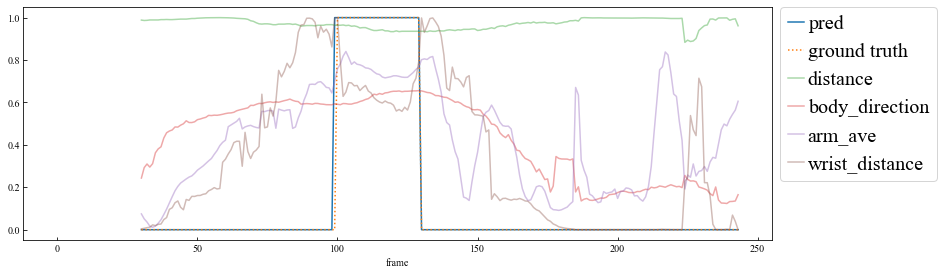

07_001_18_293_297


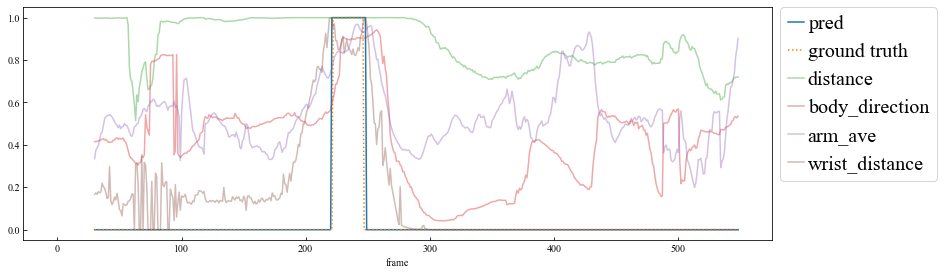

07_001_38_588_543


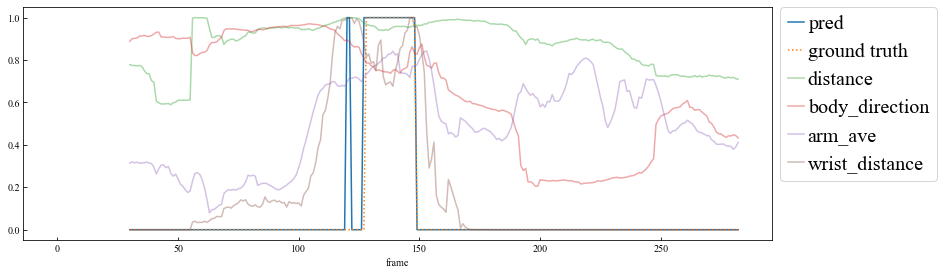

08_002_04_52_50


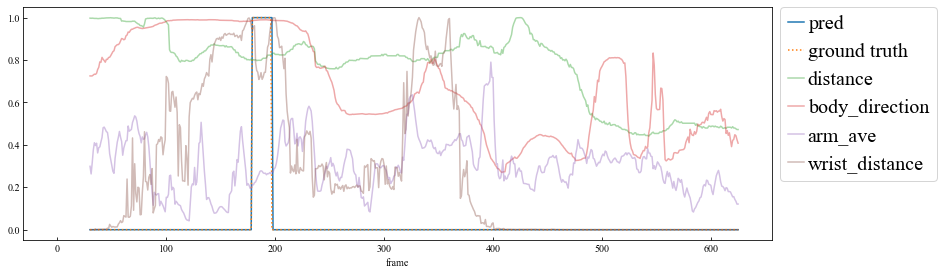

08_001_37_385_384


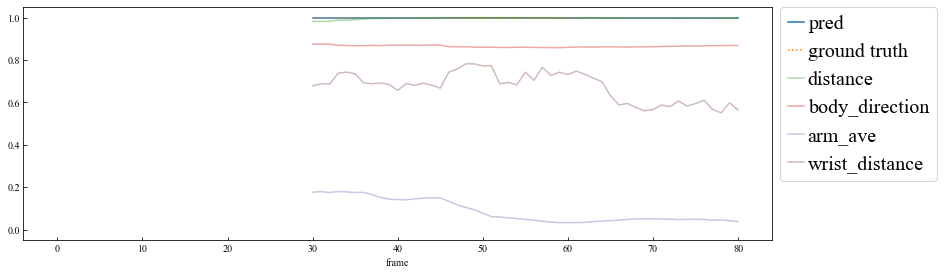

09_001_01_8_1


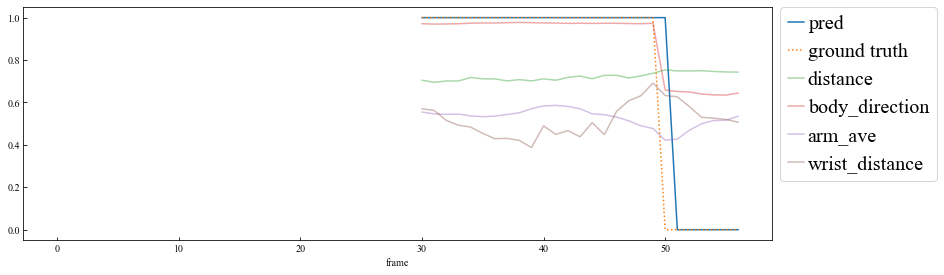

08_001_01_3_6


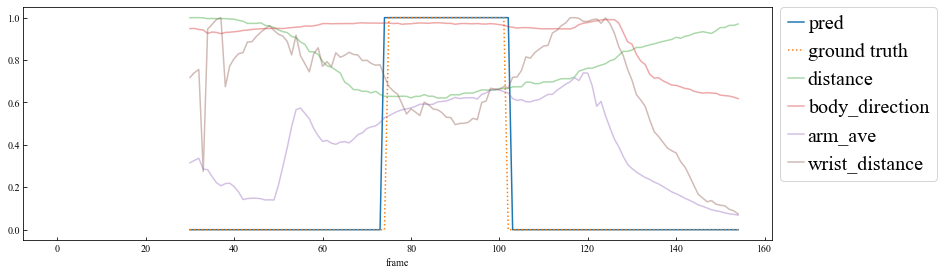

09_002_03_26_27


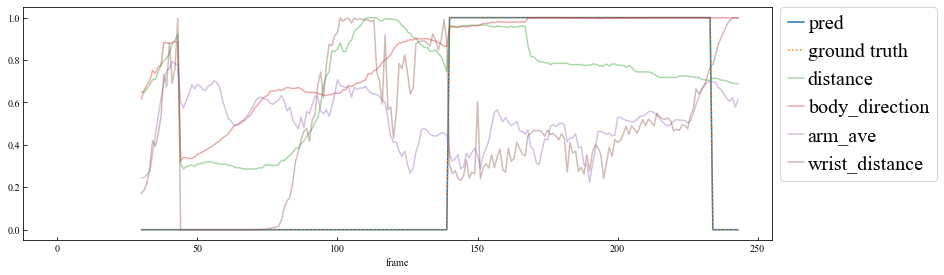

08_002_25_302_297


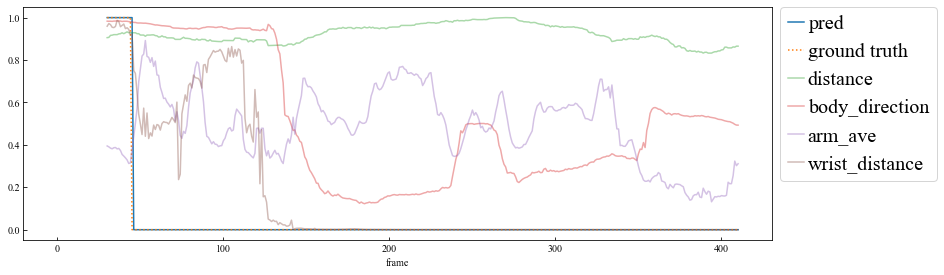

08_001_05_49_51


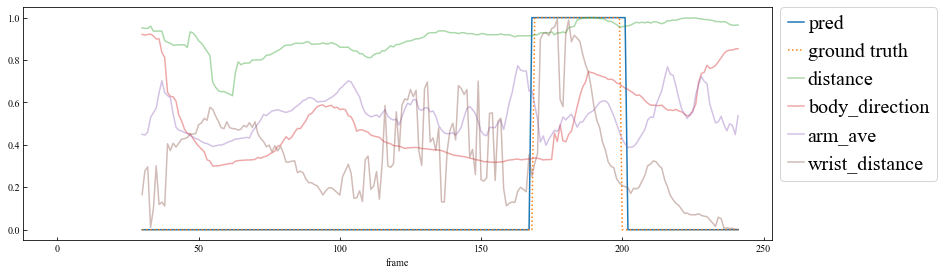

08_002_02_10_30


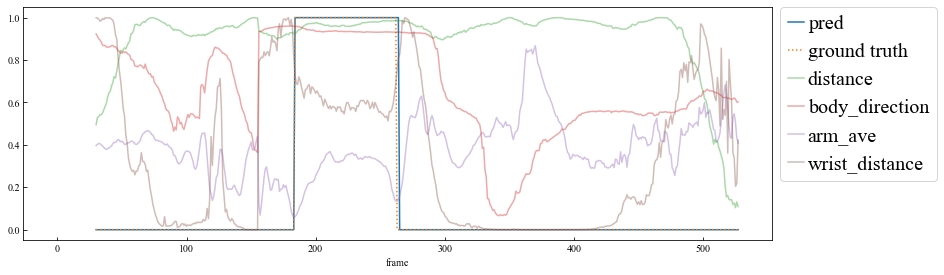

08_002_43_439_446


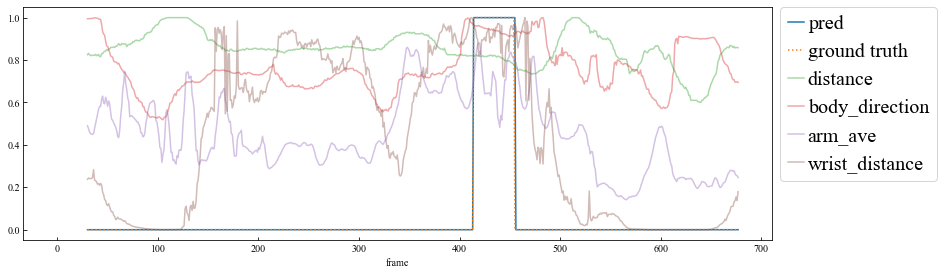

08_002_07_72_85


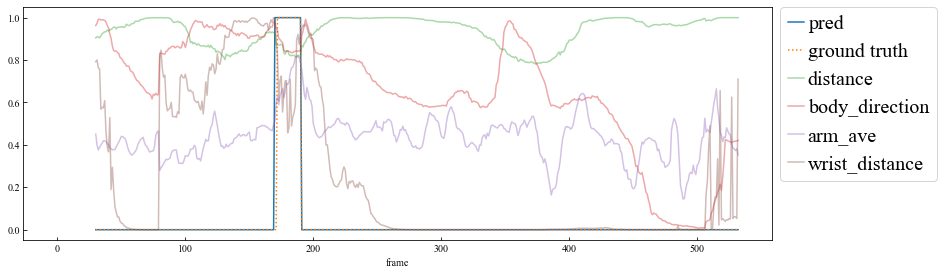

07_001_02_20_18


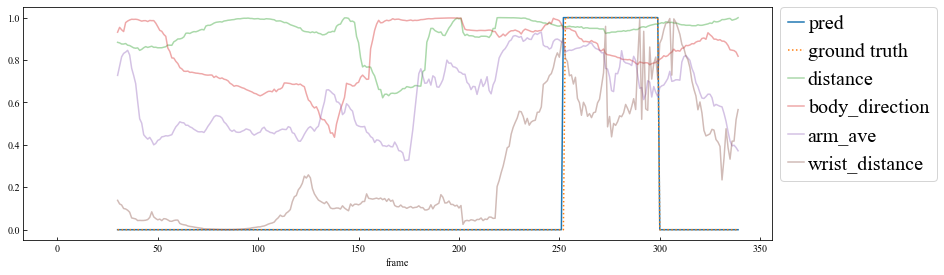

08_001_17_182_183


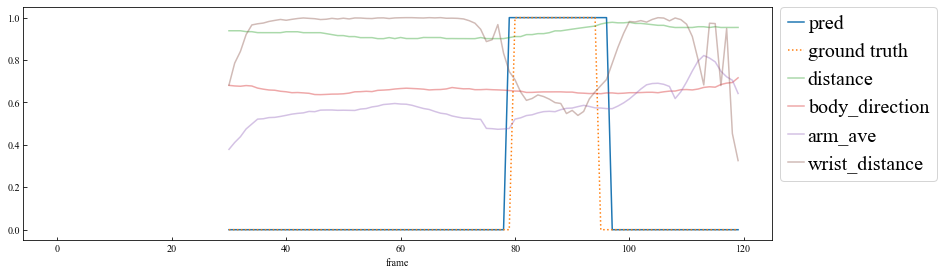

08_002_46_446_480


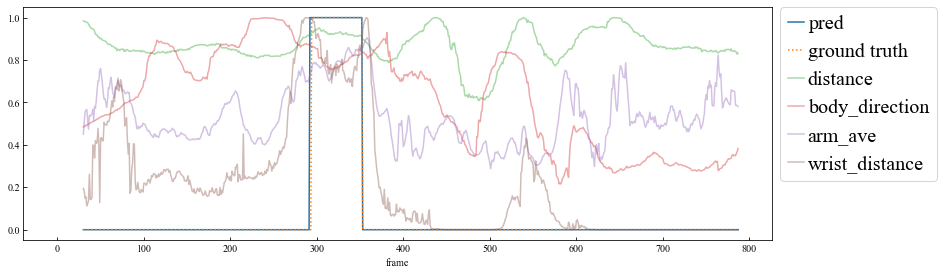

08_001_35_365_363


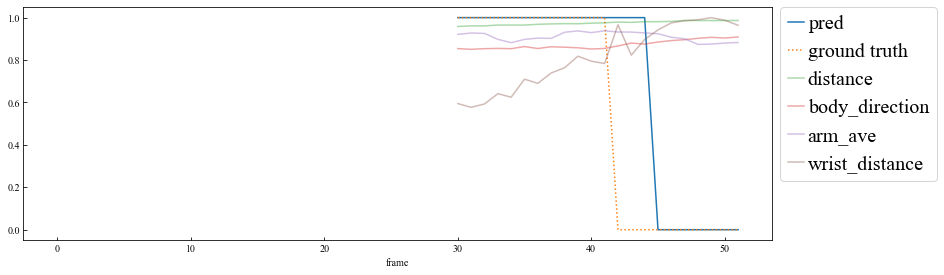

08_002_22_269_266


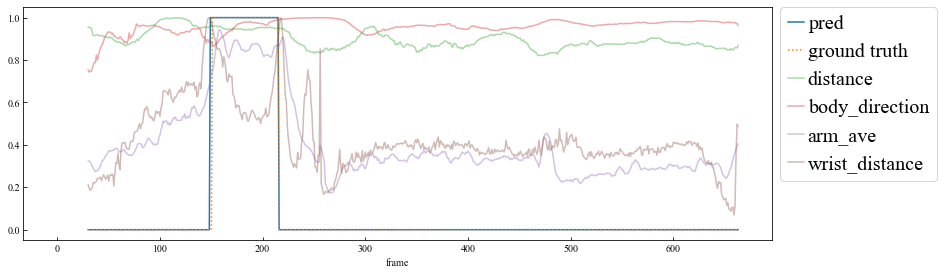

08_002_41_439_446


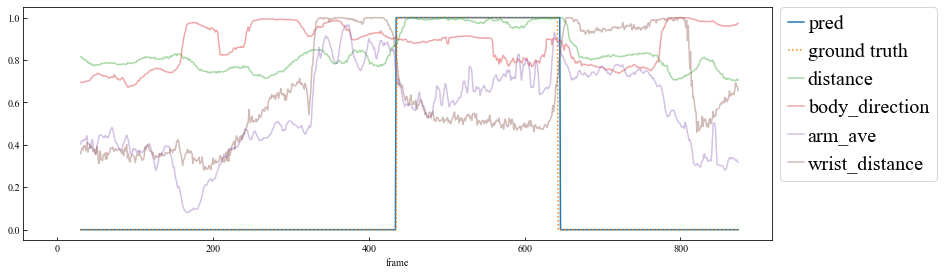

08_001_20_210_215


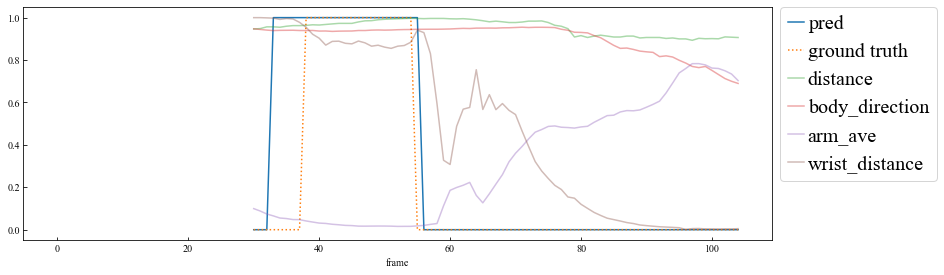

09_001_02_18_29


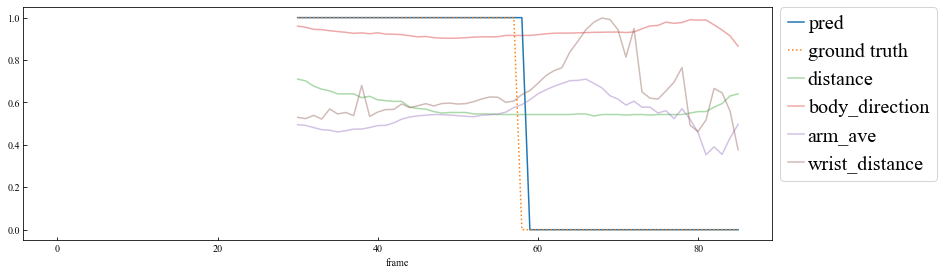

08_002_37_403_404


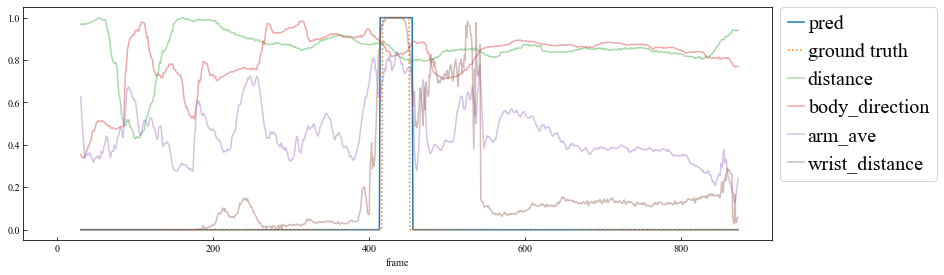

08_001_07_67_69


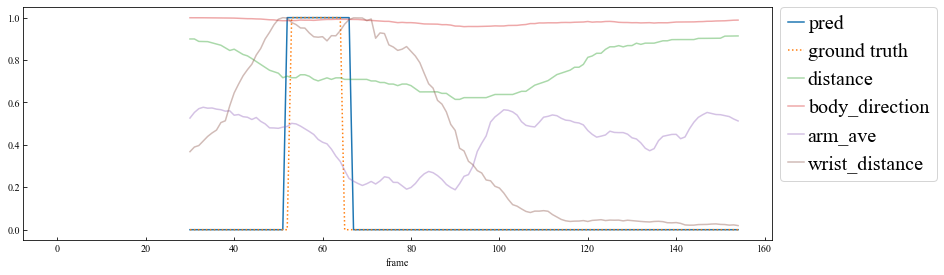

09_001_07_92_96


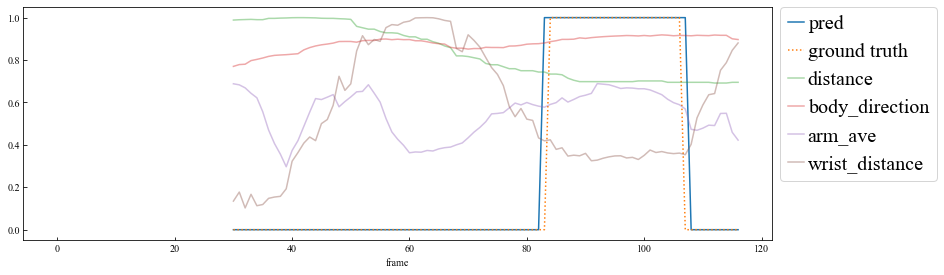

07_001_30_453_459


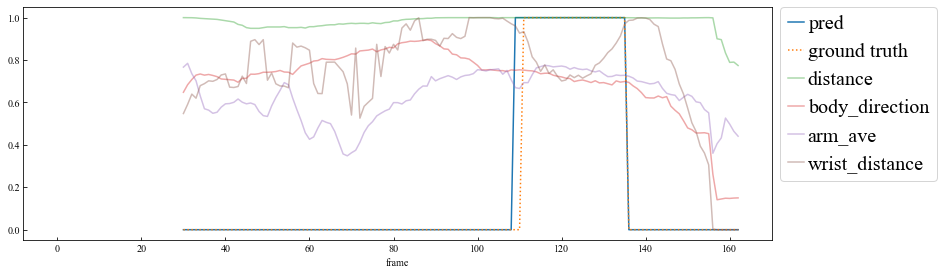

08_002_01_10_7


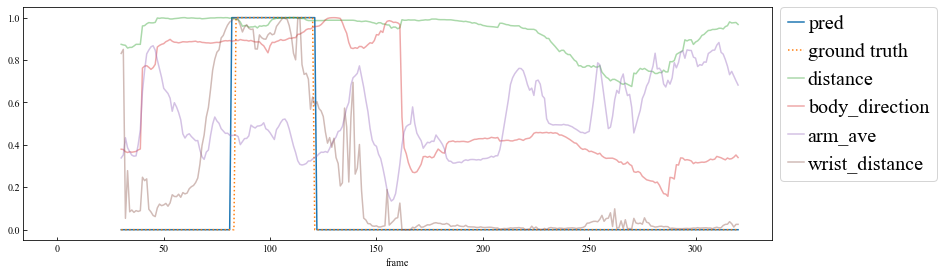

07_001_47_663_669


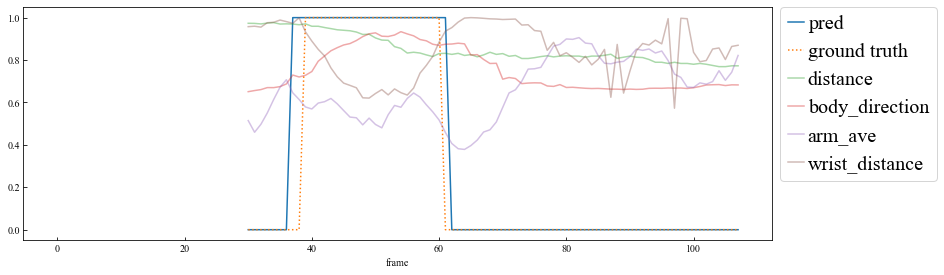

08_001_21_221_223


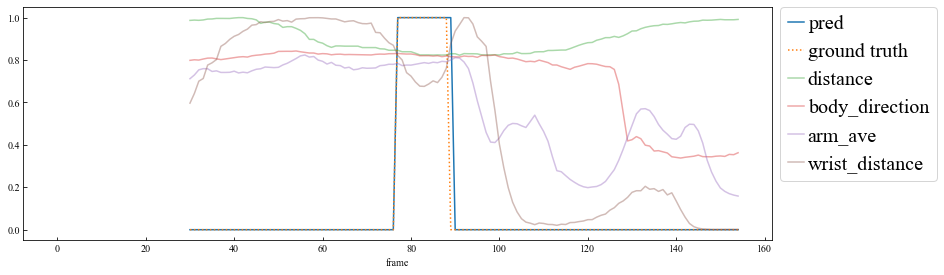

08_002_06_72_71


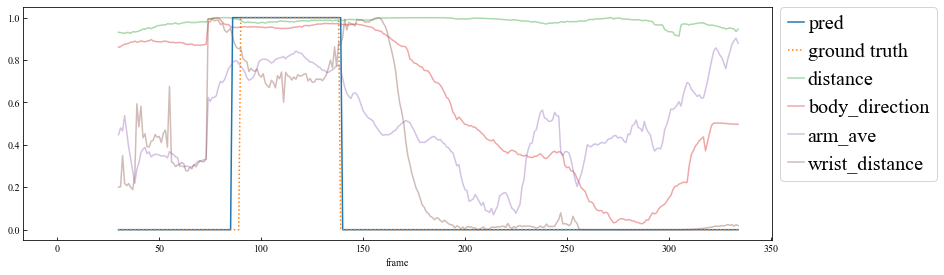

08_001_25_261_266


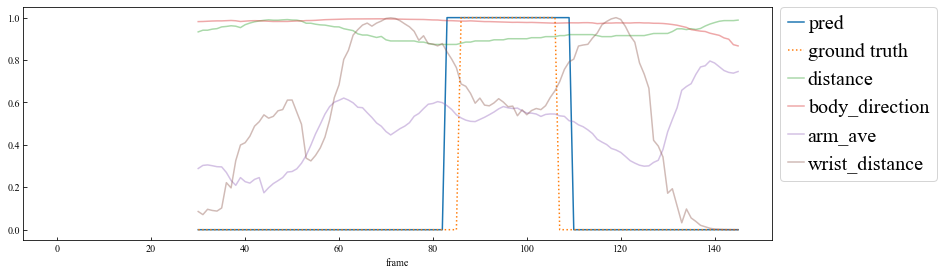

02_001_09_97_104


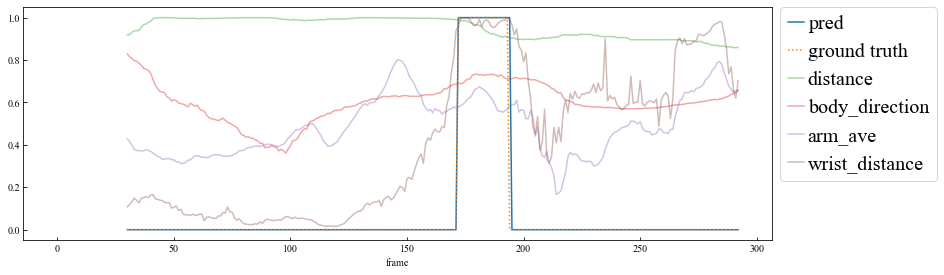

08_002_38_403_404


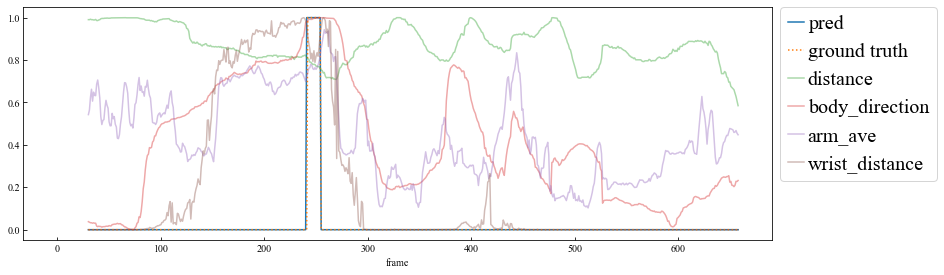

08_002_12_125_129


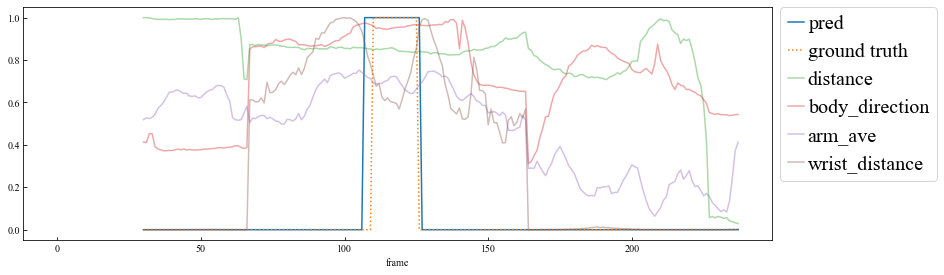

07_001_09_153_158


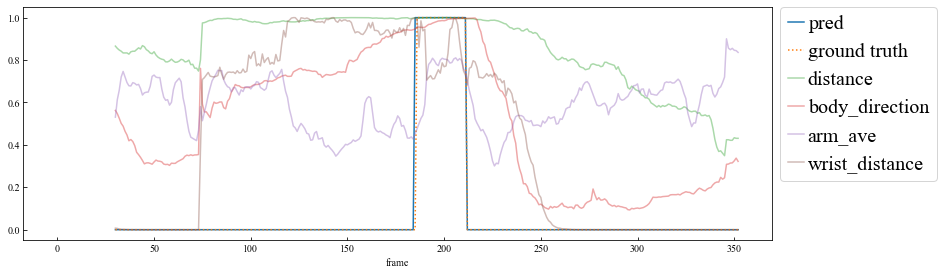

02_001_06_58_61


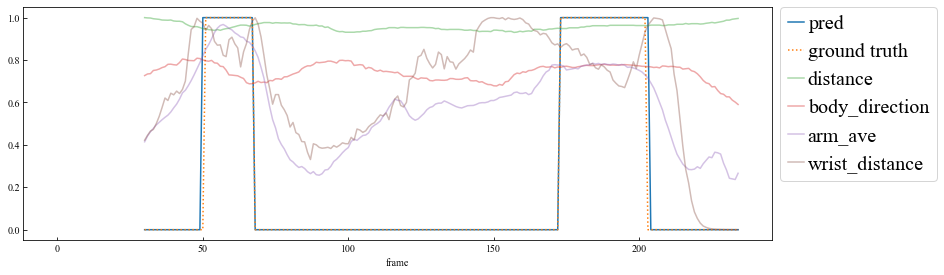

07_001_05_54_79


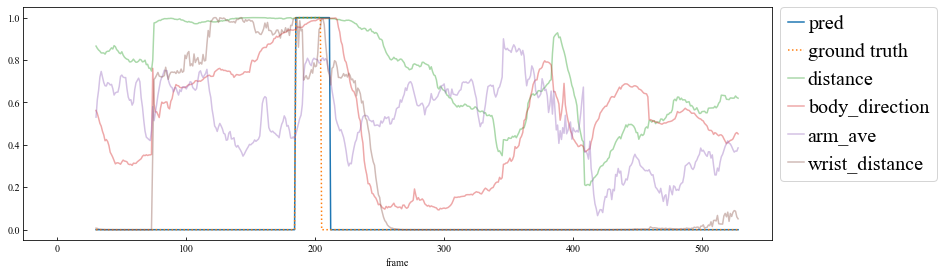

08_002_20_229_249


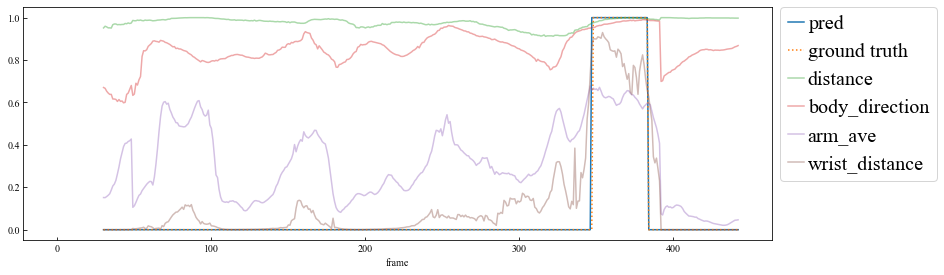

08_002_14_154_159


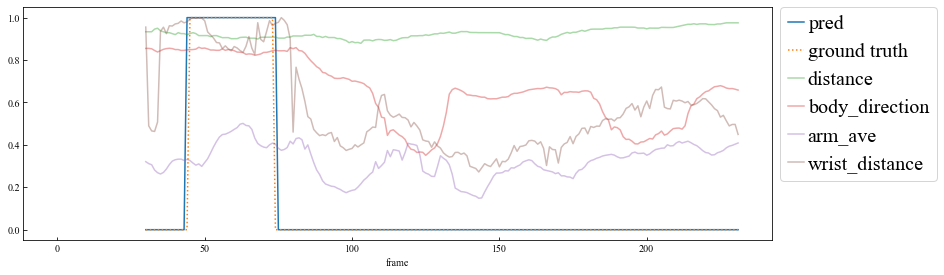

09_002_02_8_18


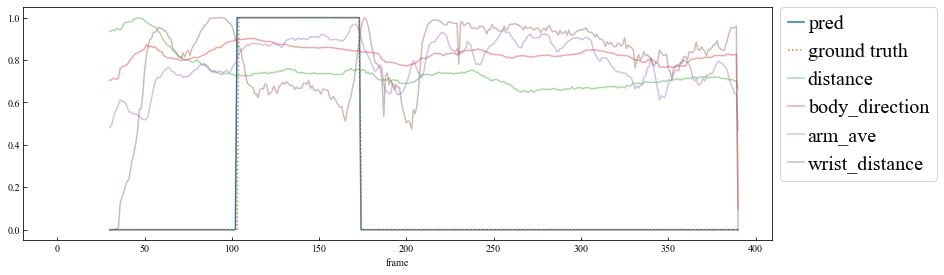

02_001_15_191_202


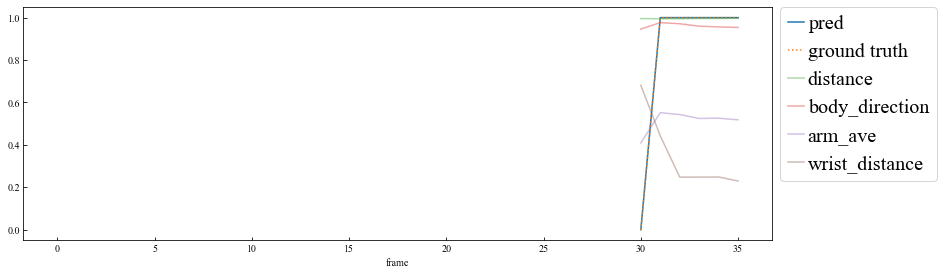

08_001_34_356_357


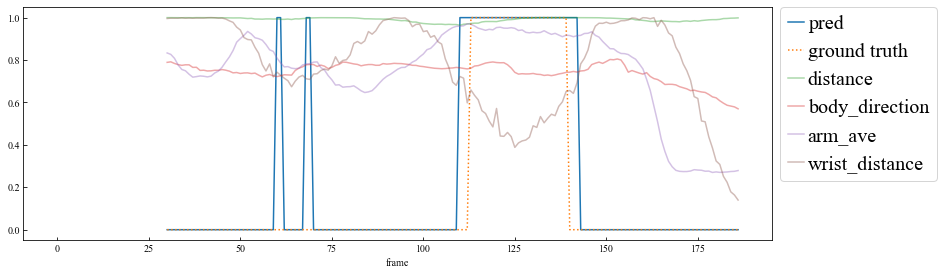

08_002_09_72_102


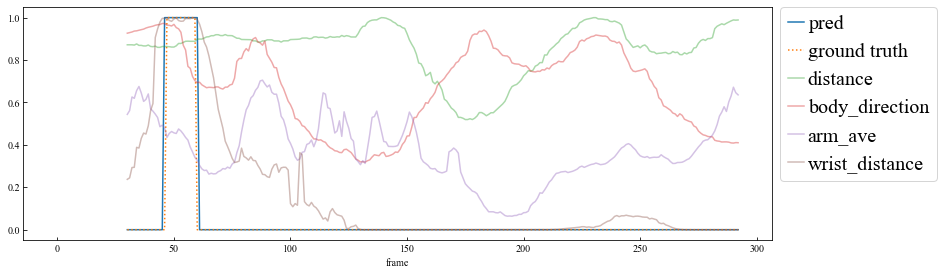

07_001_07_116_121


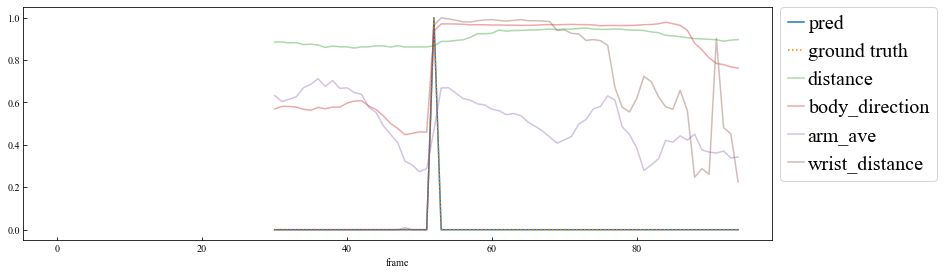

07_001_32_489_491


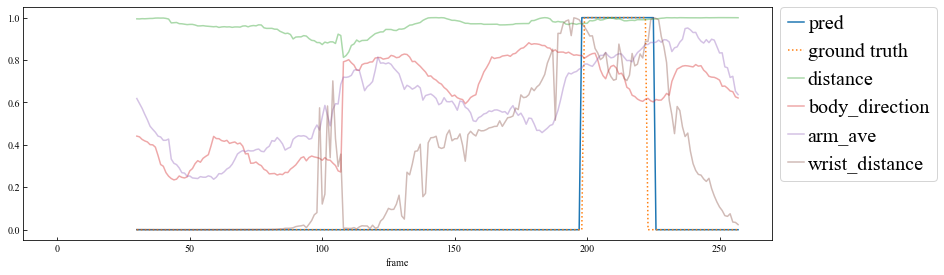

07_001_35_506_505


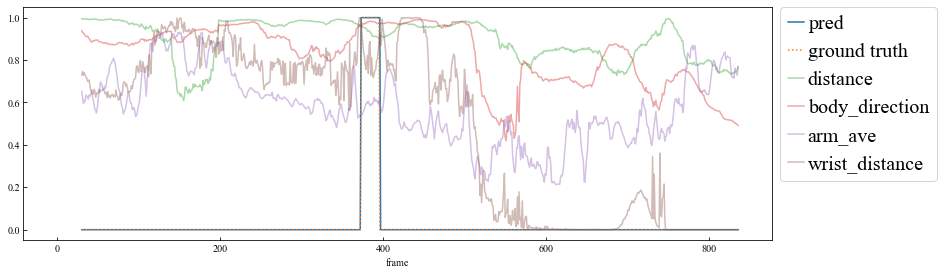

07_001_40_588_543


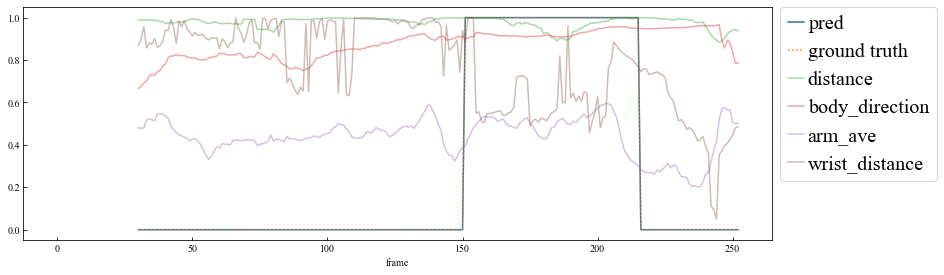

09_002_13_137_92


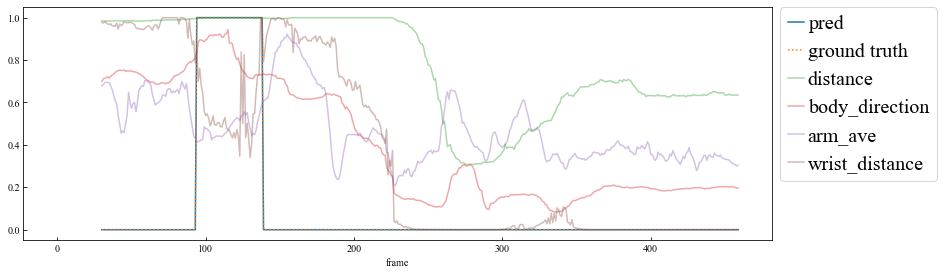

08_001_26_273_278


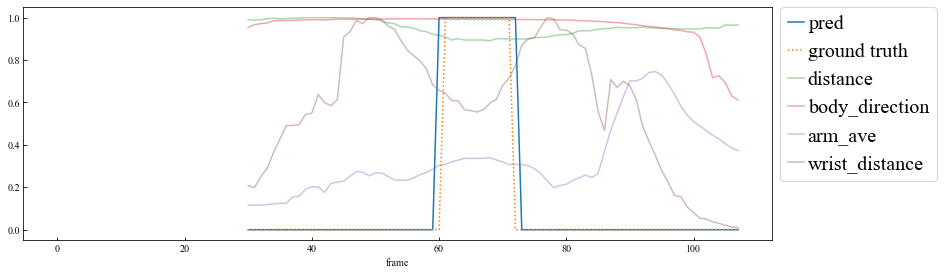

07_001_42_617_623


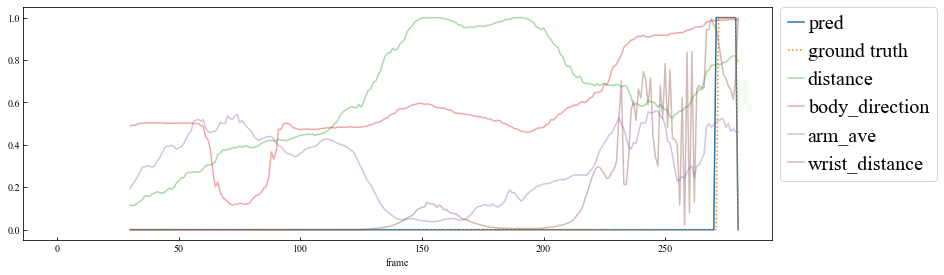

07_001_45_633_652


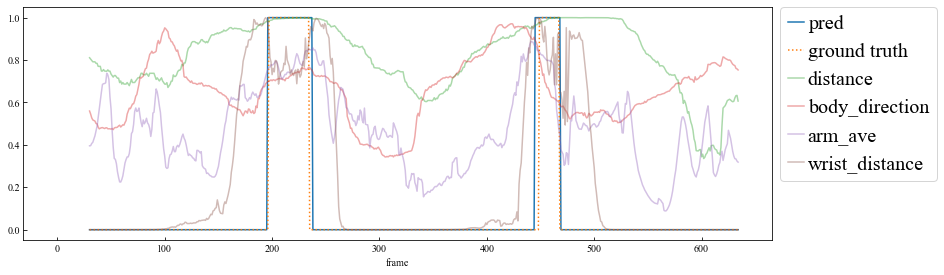

08_002_24_285_289


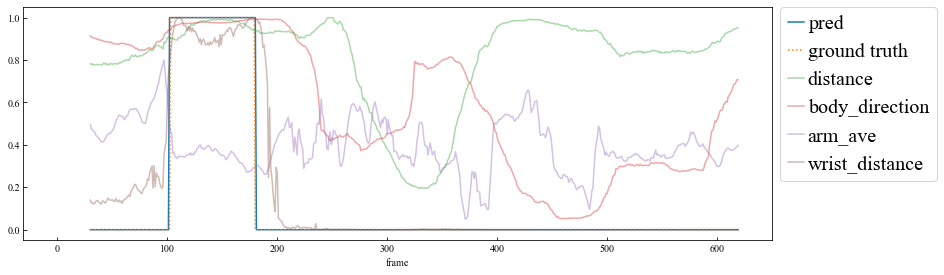

08_002_44_446_473


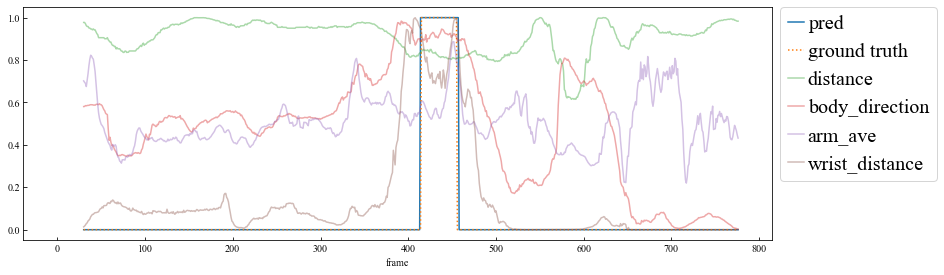

07_001_22_356_297


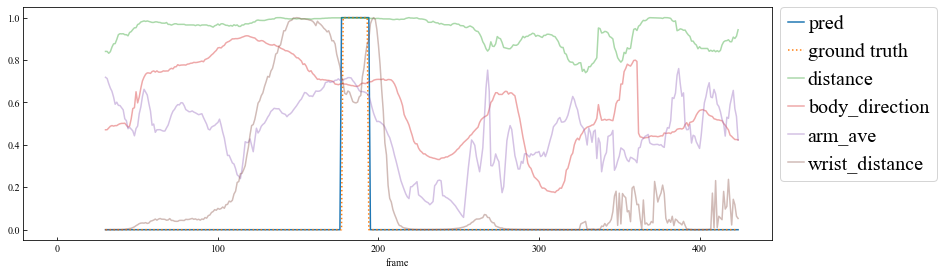

02_001_13_166_167


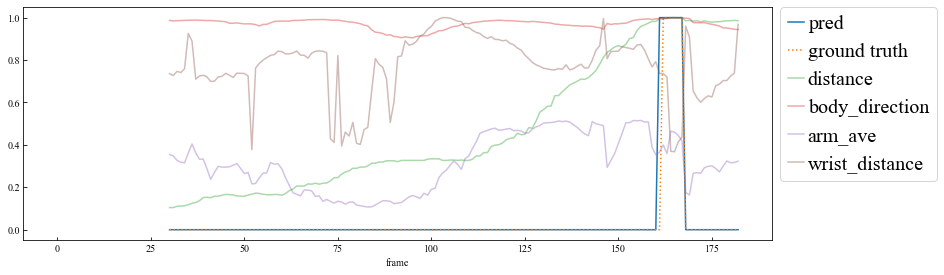

02_001_05_47_51


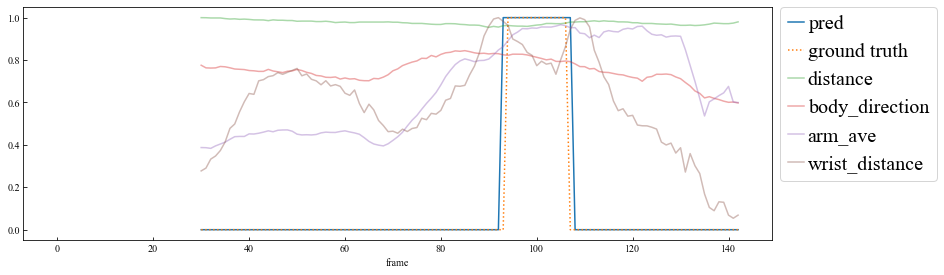

08_001_13_141_142


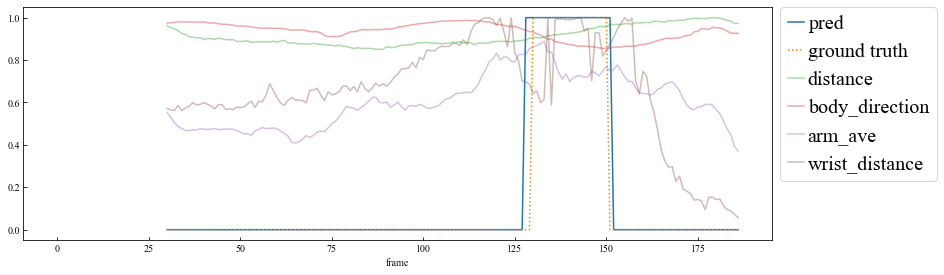

07_001_31_476_461


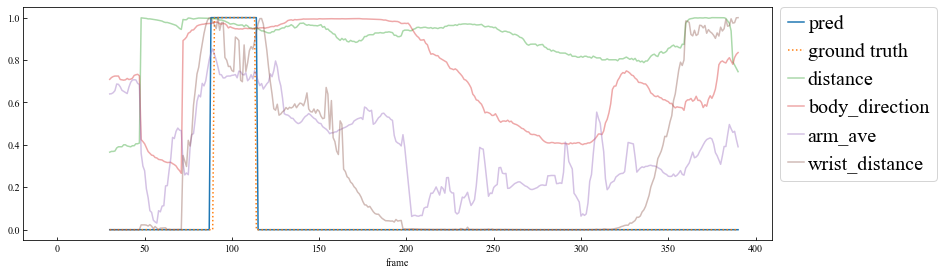

09_001_08_102_105


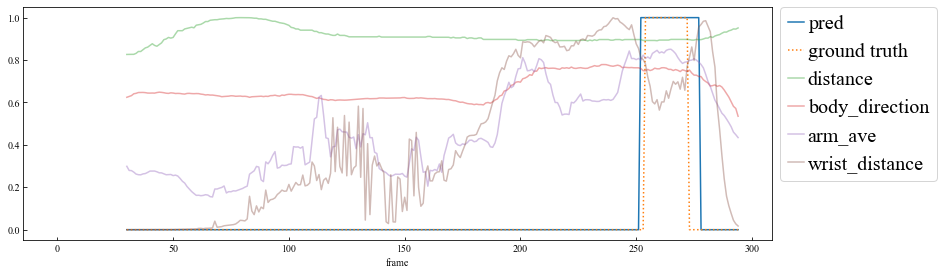

08_001_18_189_191


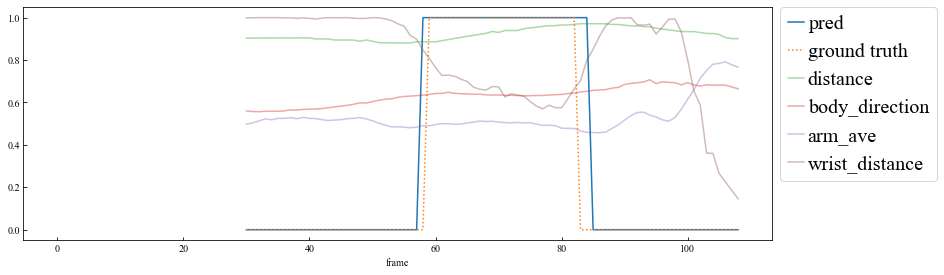

09_002_18_196_193


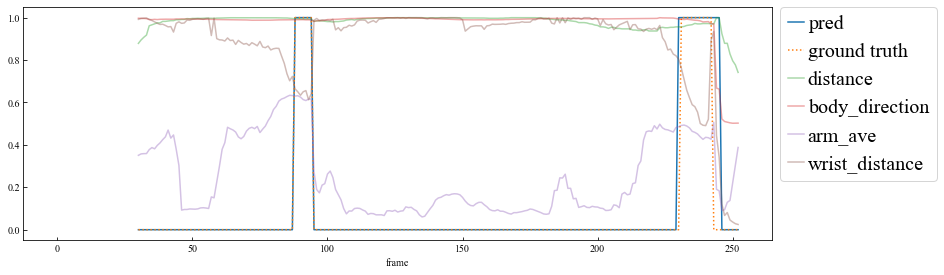

09_002_15_176_178


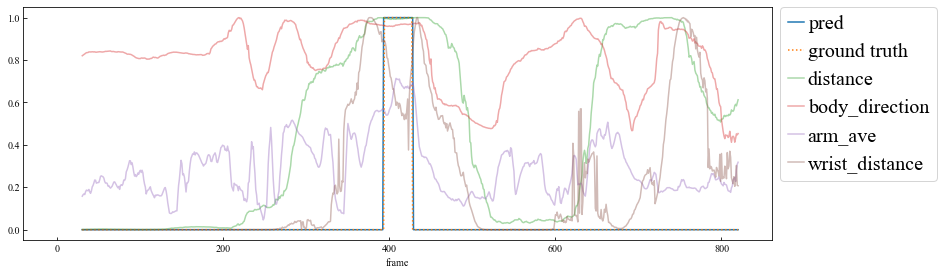

07_001_39_588_543


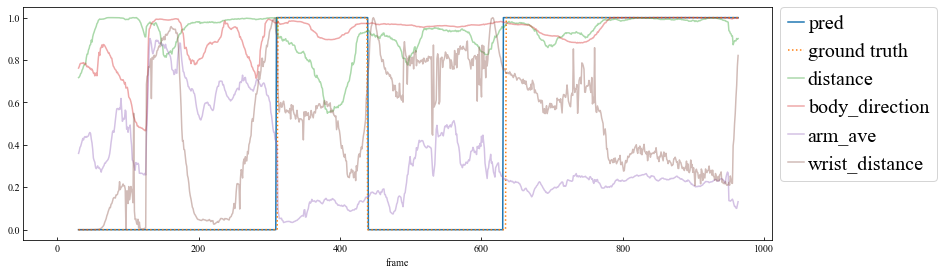

02_001_03_27_31


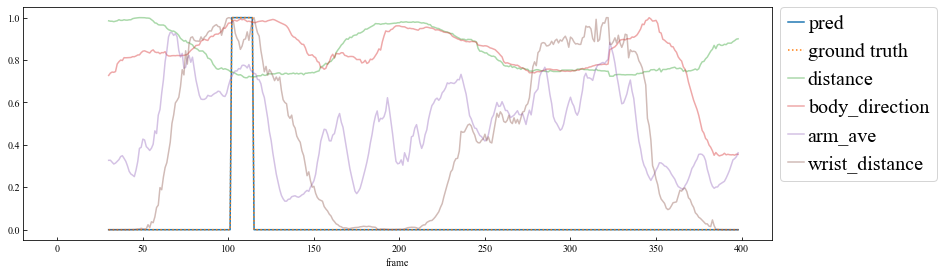

09_002_07_75_60


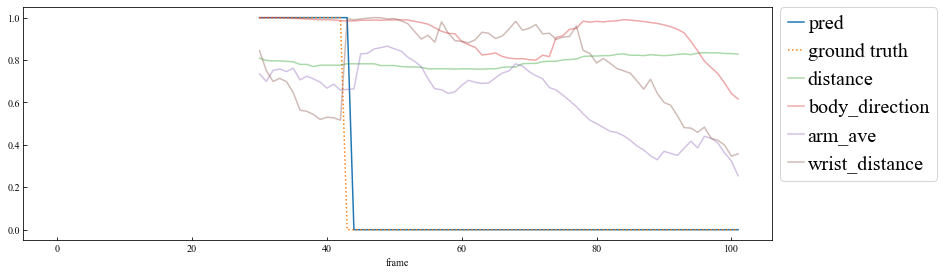

08_002_20_229_241


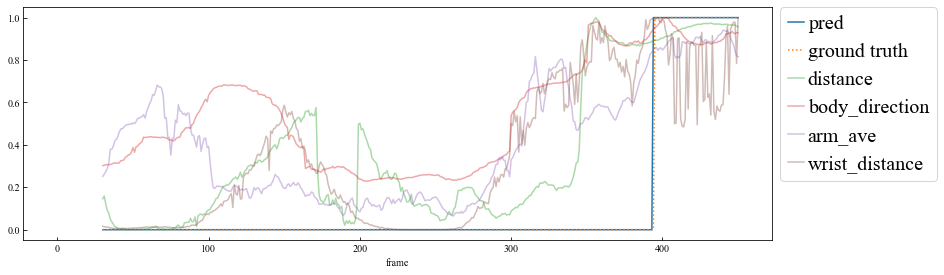

08_001_09_91_89


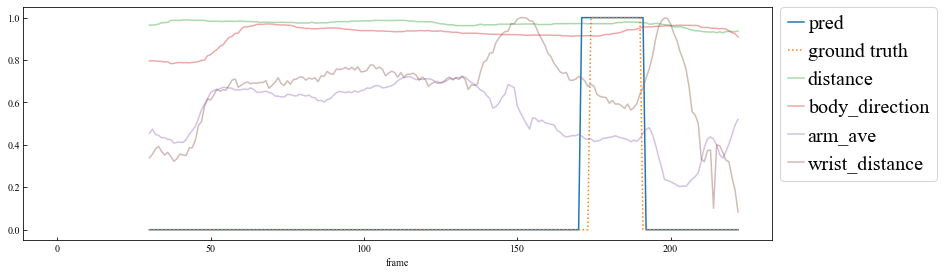

08_001_23_237_242


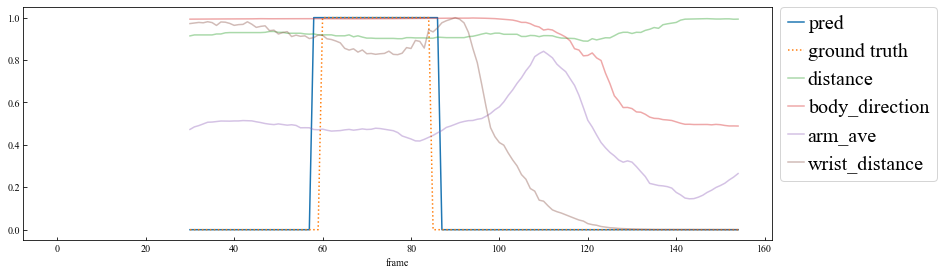

09_001_01_1_8


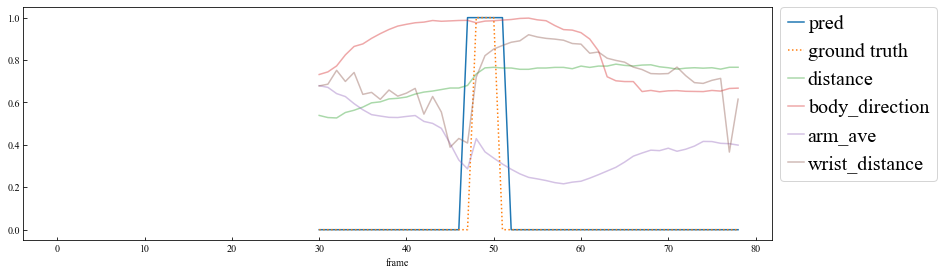

07_001_34_506_505


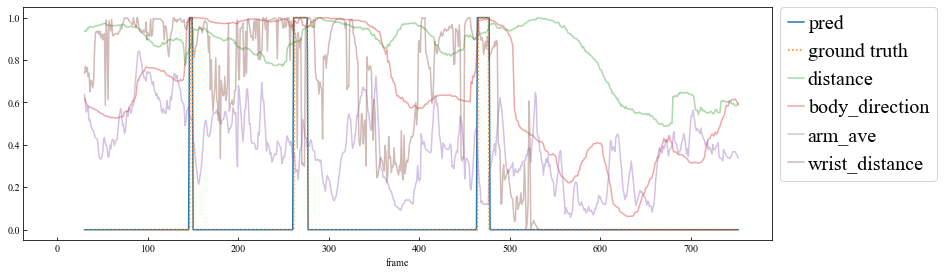

08_002_08_72_98


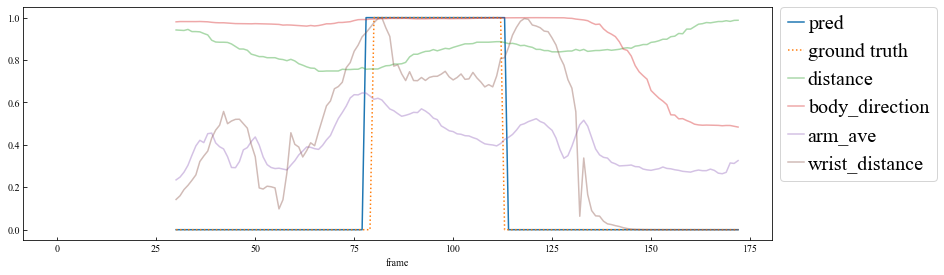

07_001_37_543_565


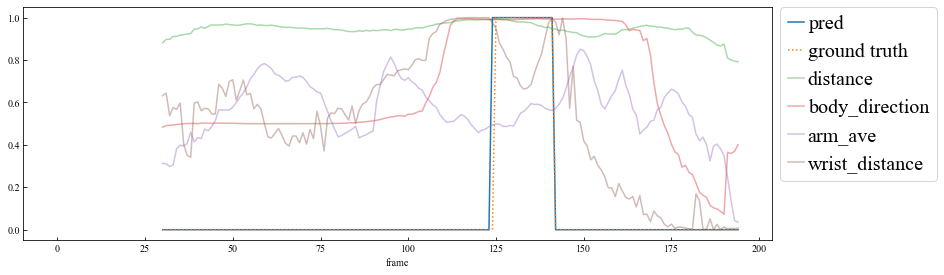

08_001_19_198_201


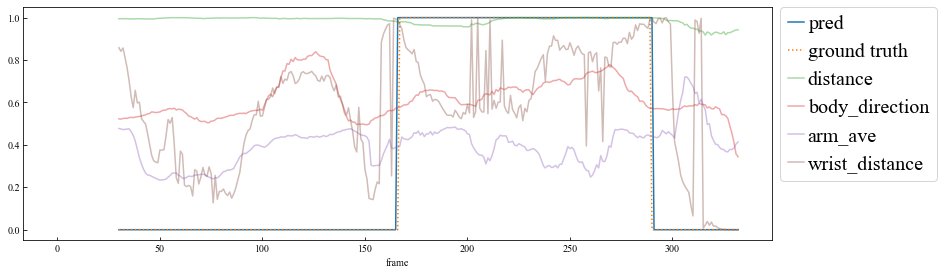

08_002_45_446_480


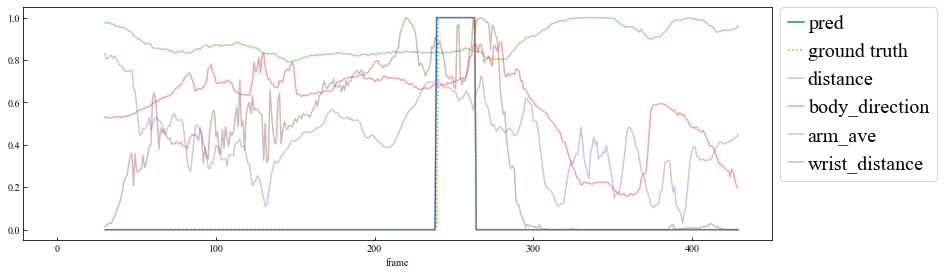

08_001_06_56_61


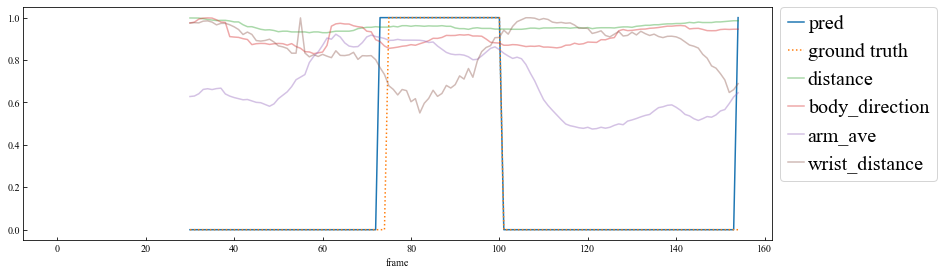

08_001_33_347_348


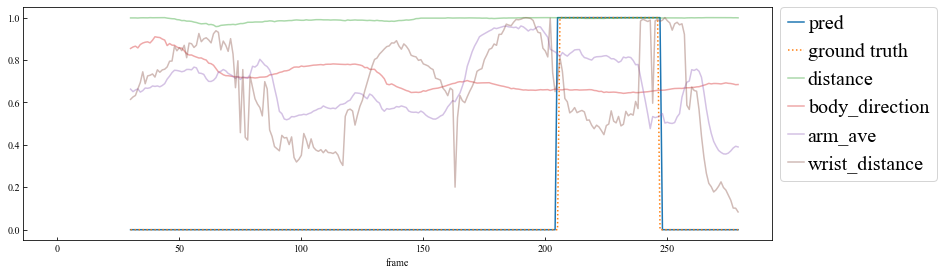

07_001_44_632_633


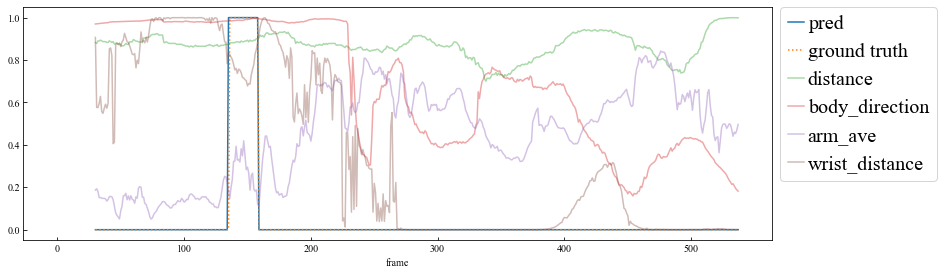

08_002_13_147_126


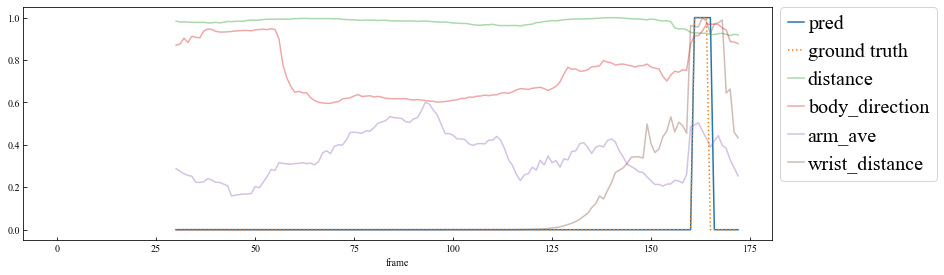

08_001_39_407_401


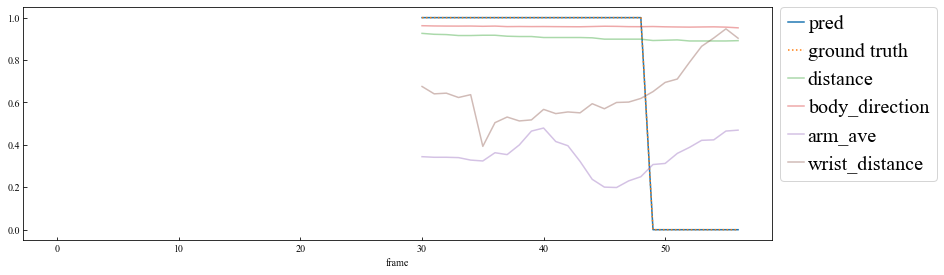

09_002_11_92_99


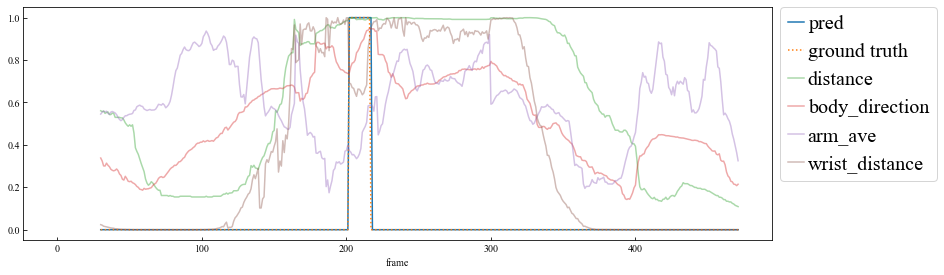

08_001_24_247_245


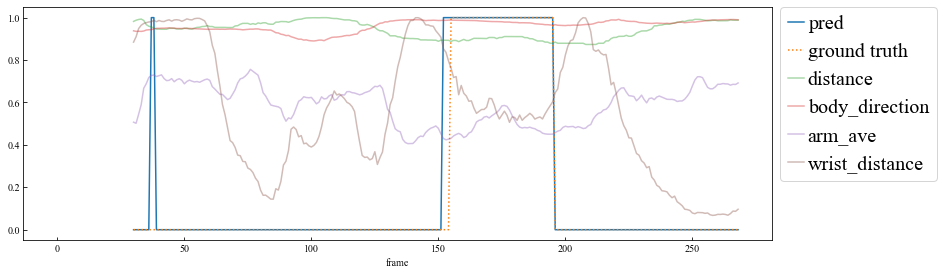

07_001_33_506_489


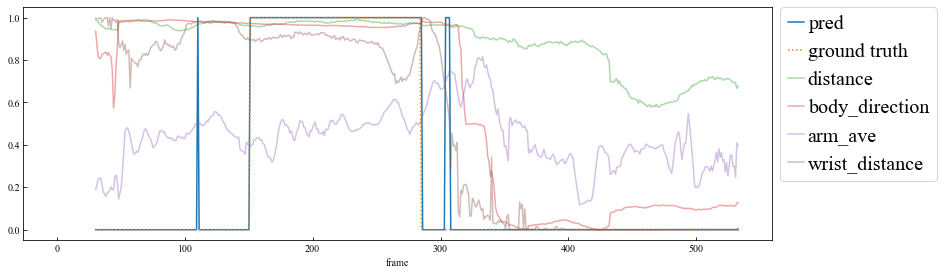

02_001_08_81_85


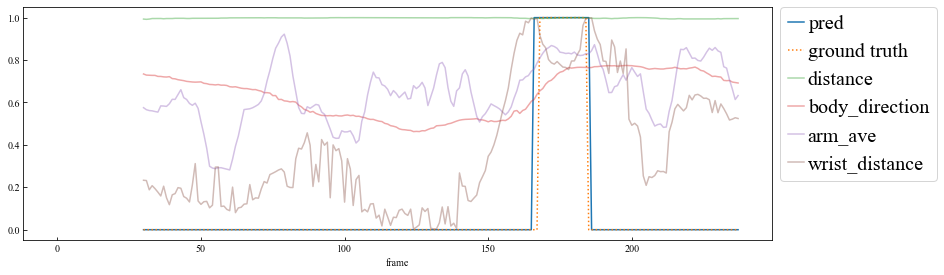

02_001_21_288_287


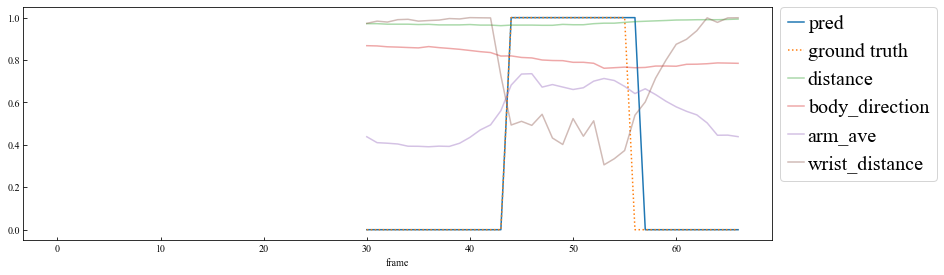

08_001_36_376_377


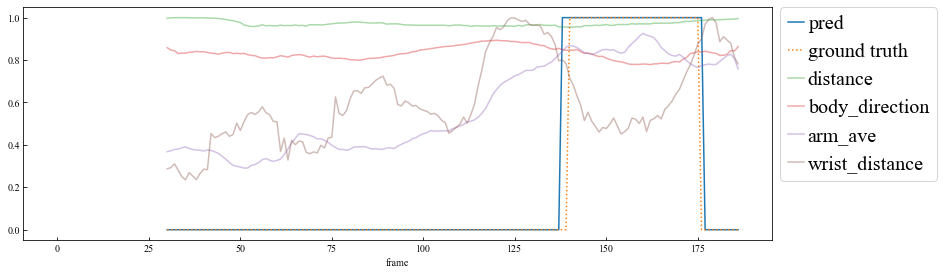

02_001_19_259_262


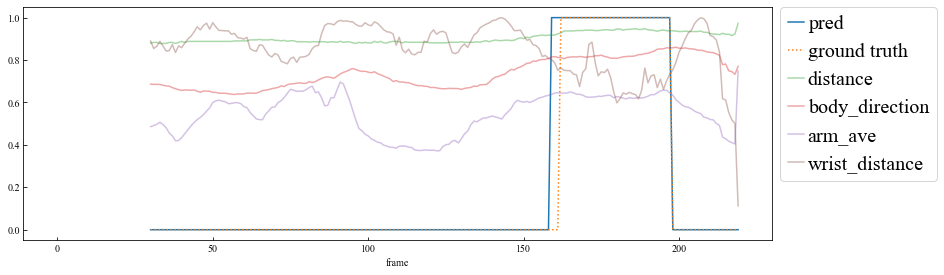

08_002_39_403_439


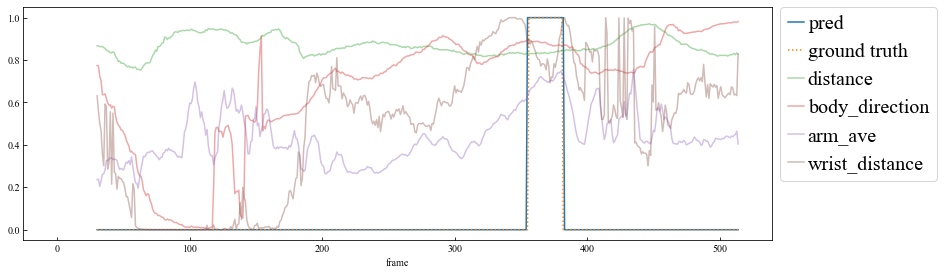

07_001_29_453_436


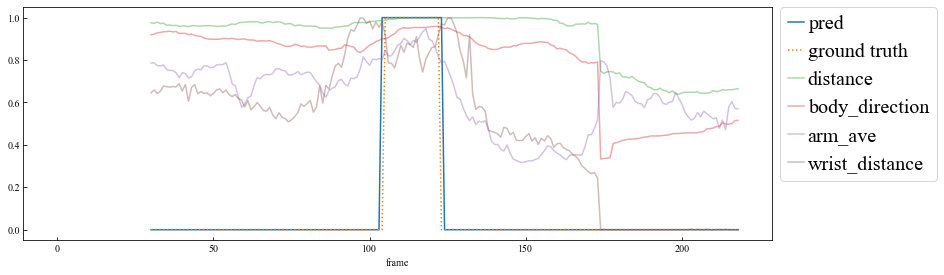

09_002_09_94_92


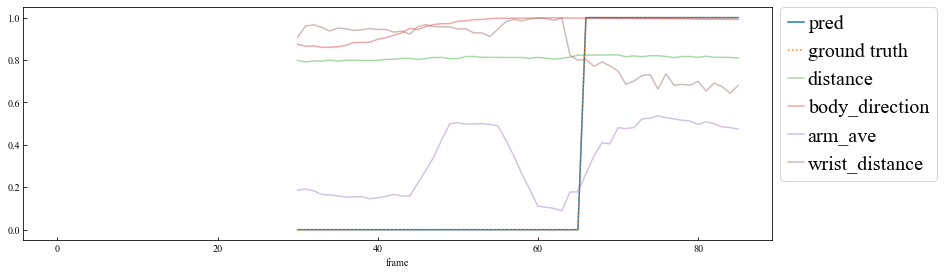

07_001_28_429_425


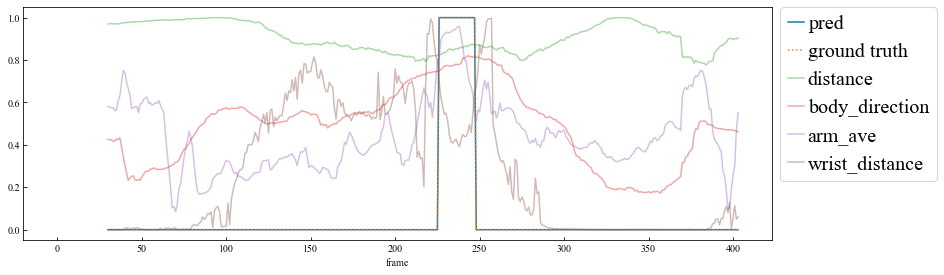

07_001_46_652_651


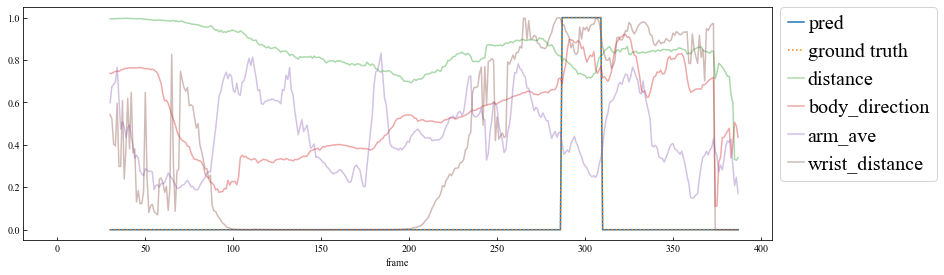

02_001_18_247_251


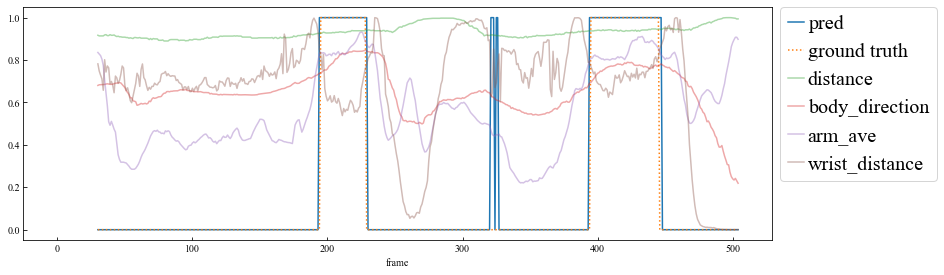

08_002_11_118_125


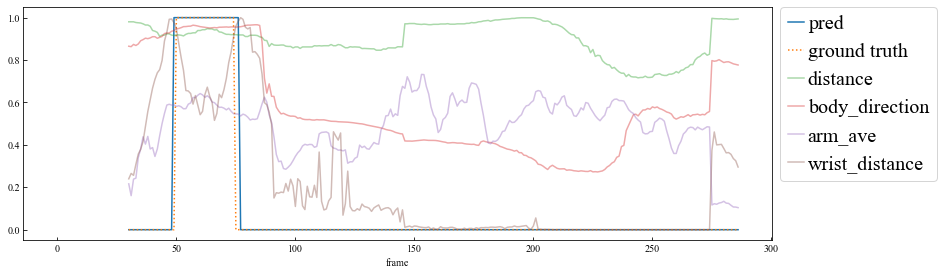

07_001_41_588_617


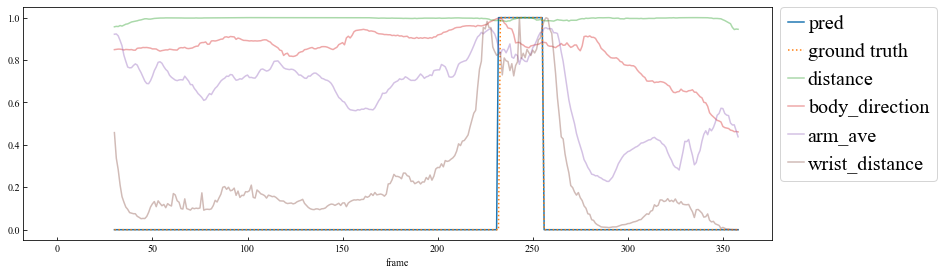

08_001_10_97_99


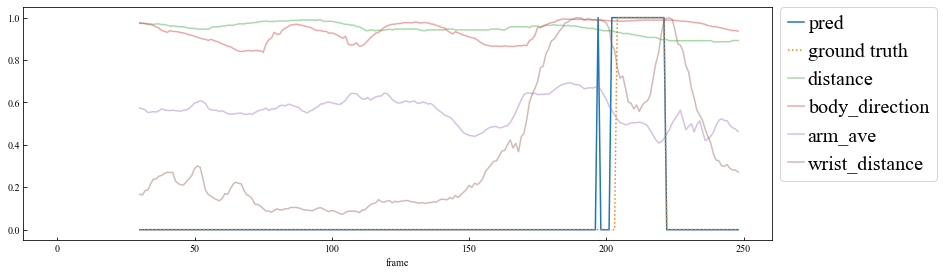

09_002_17_196_193


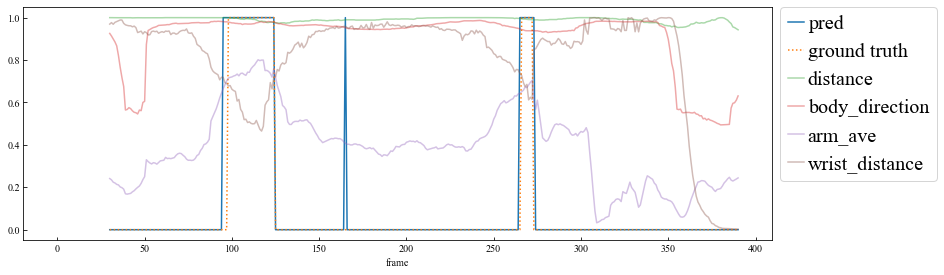

07_001_16_267_252


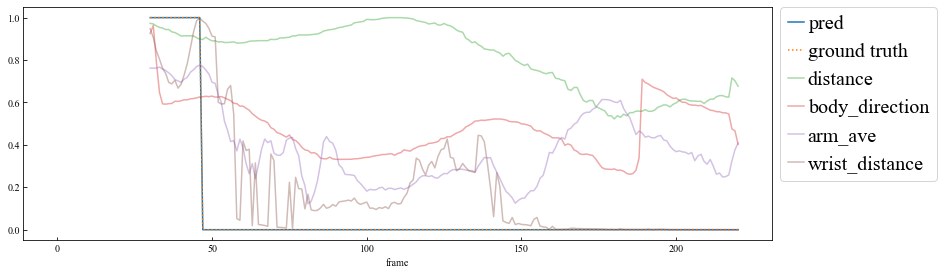

08_002_29_344_333


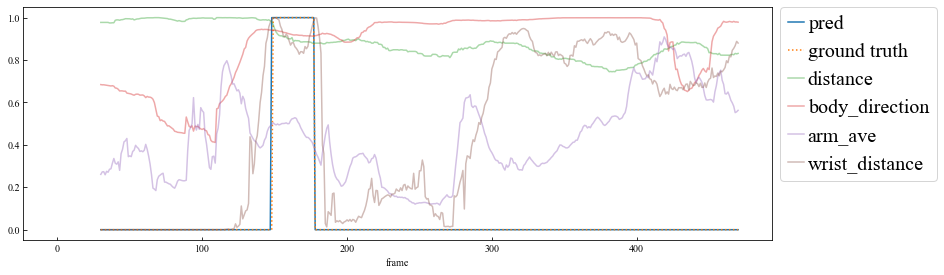

09_002_03_27_26


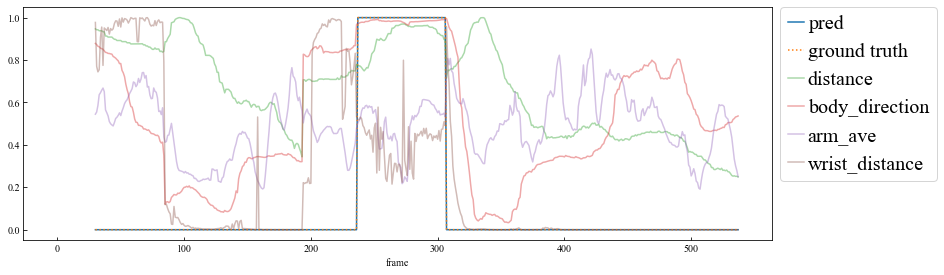

07_001_12_195_191


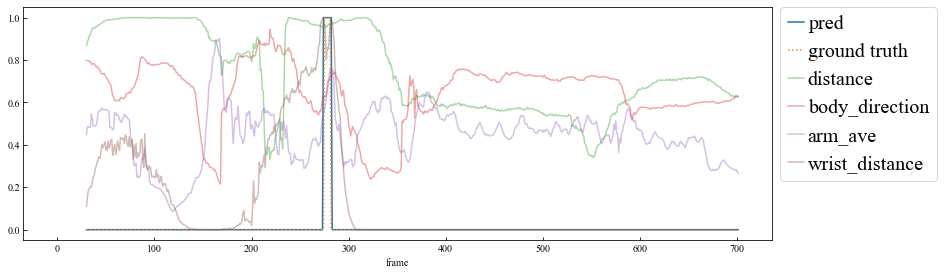

08_001_03_26_32


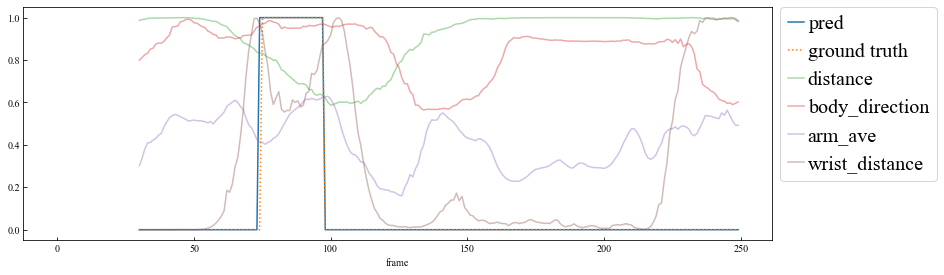

08_002_45_446_479


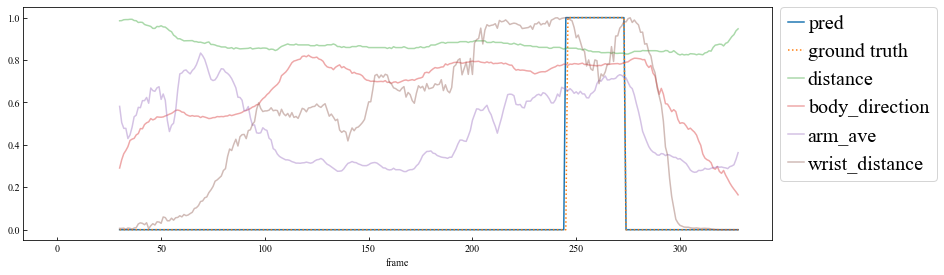

07_001_26_405_415


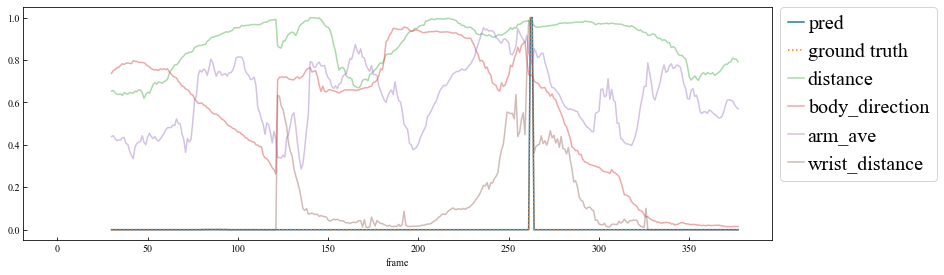

07_001_39_543_588


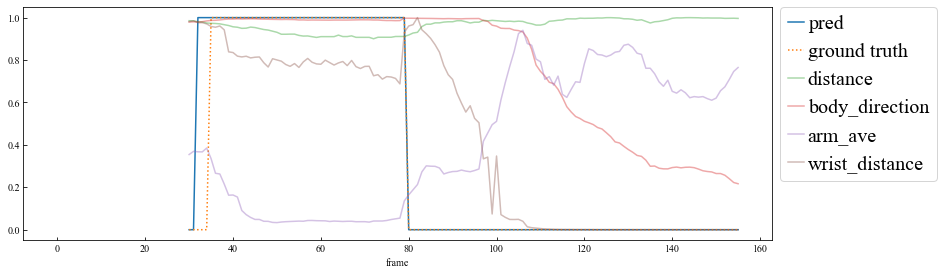

08_002_28_302_333


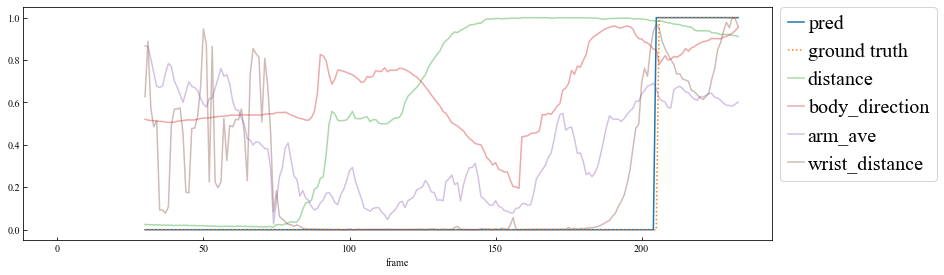

07_001_13_217_219


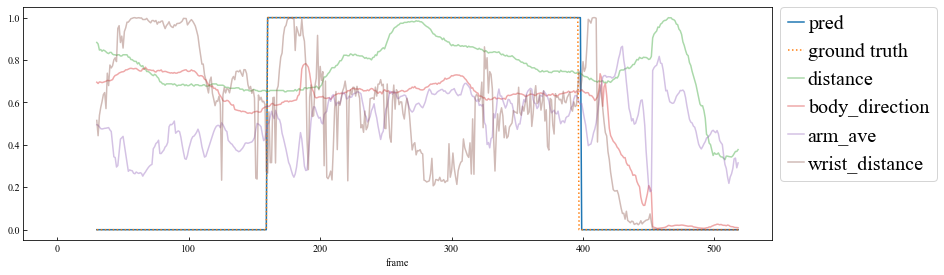

07_001_43_632_633


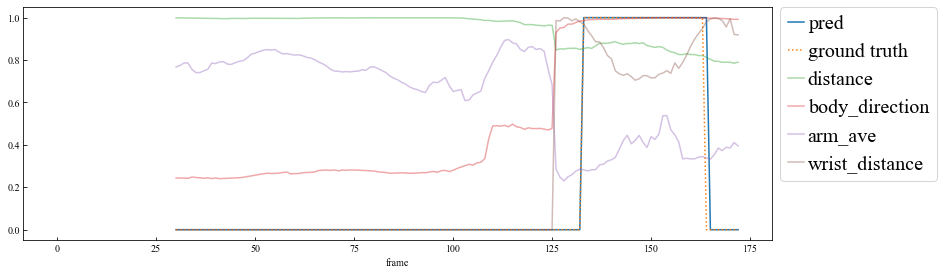

08_001_29_311_312


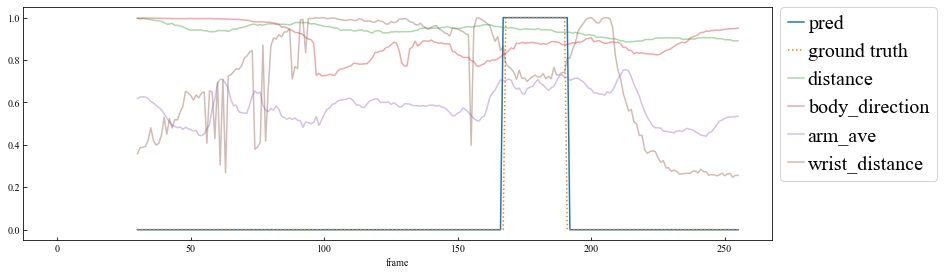

08_001_30_316_317


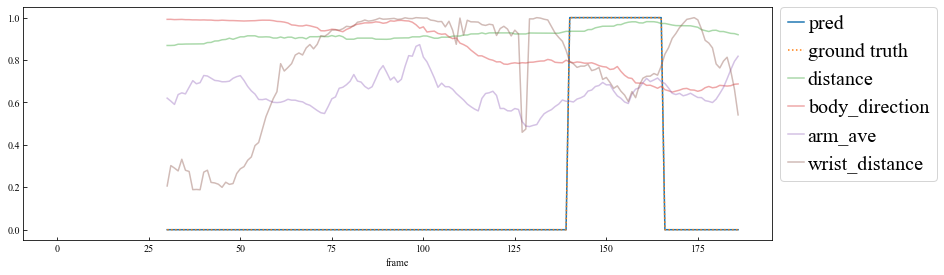

08_002_09_72_106


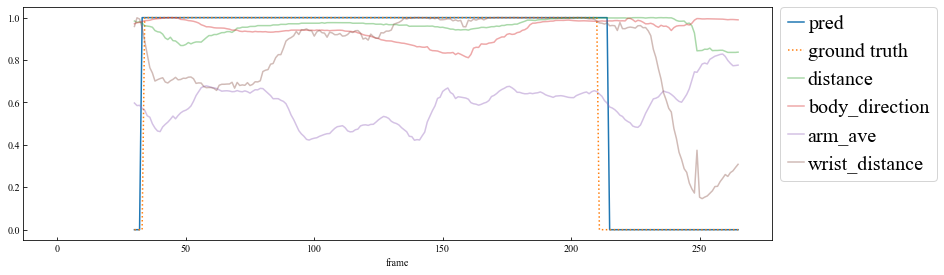

09_002_14_155_158


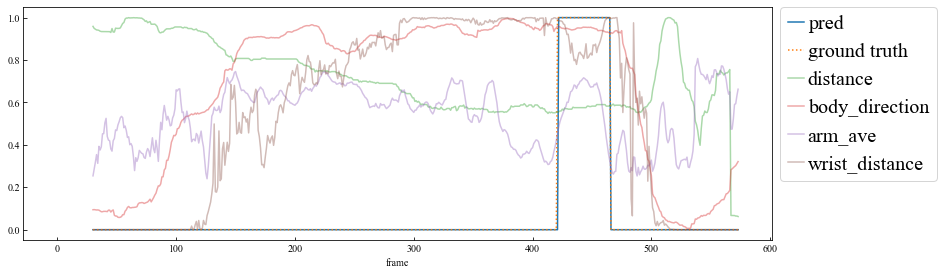

09_002_02_18_8


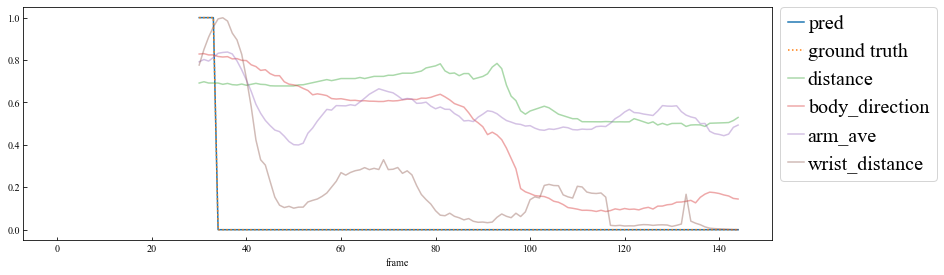

08_001_31_327_334


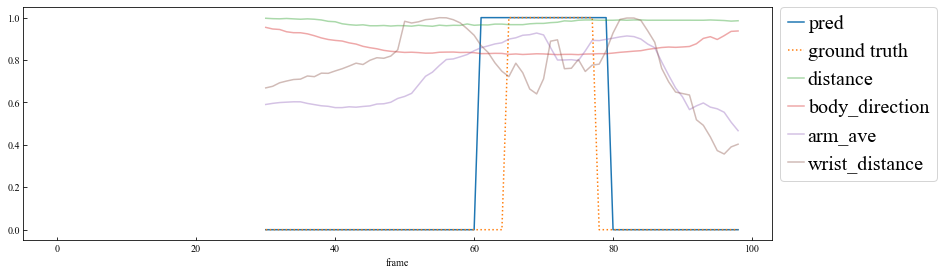

08_002_35_403_404


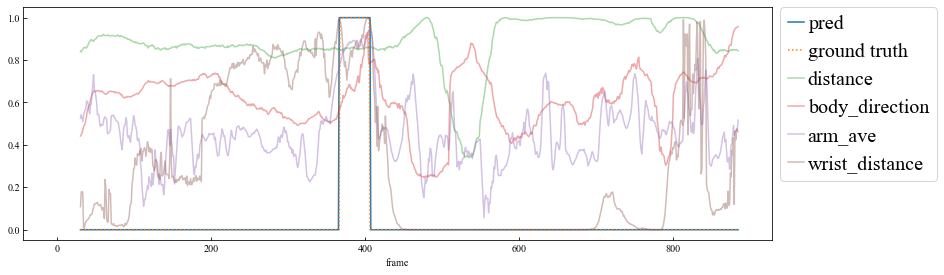

08_001_15_163_164


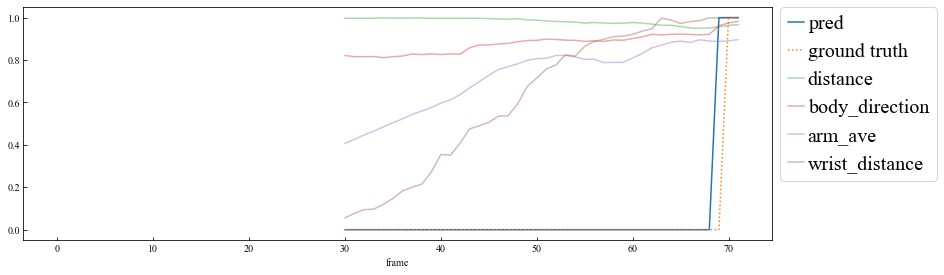

07_001_19_308_304


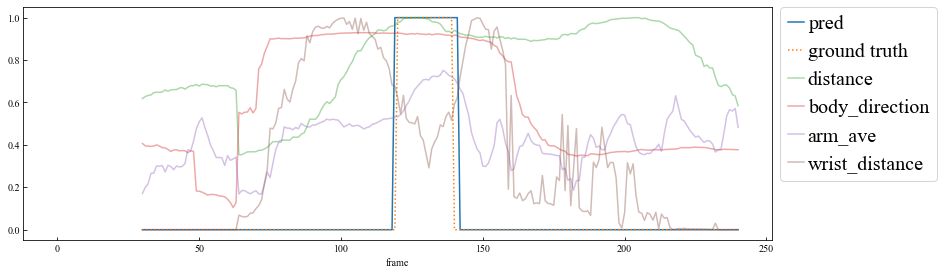

07_001_21_297_317


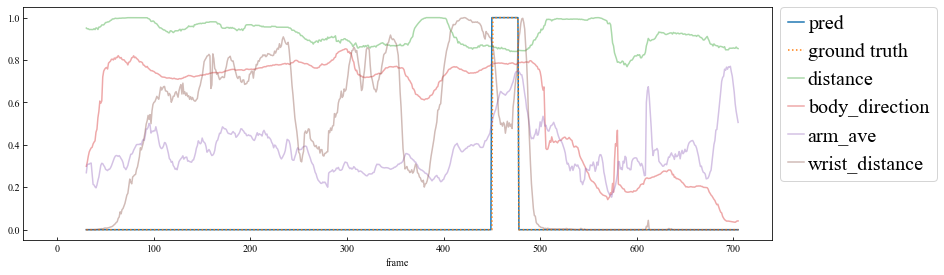

09_001_02_29_18


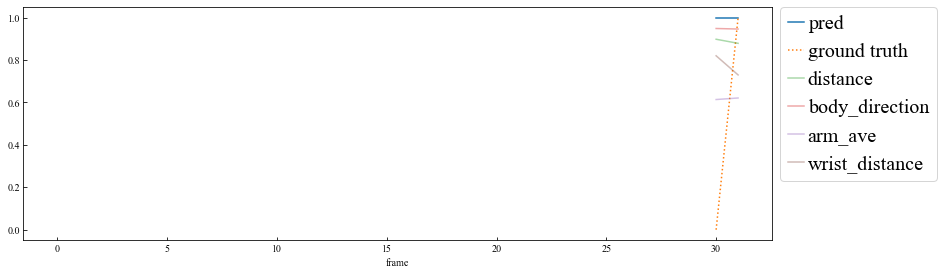

02_001_15_202_191


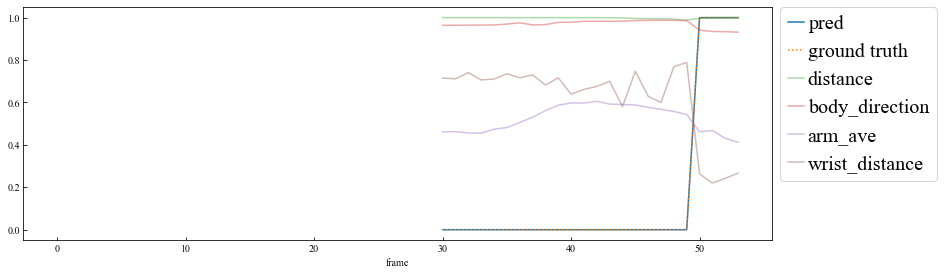

08_002_16_165_182


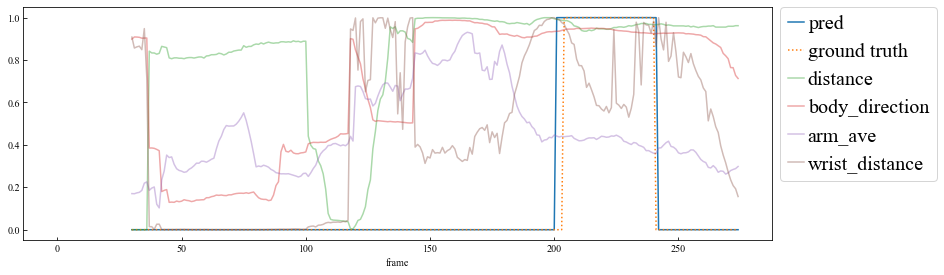

07_001_14_232_230


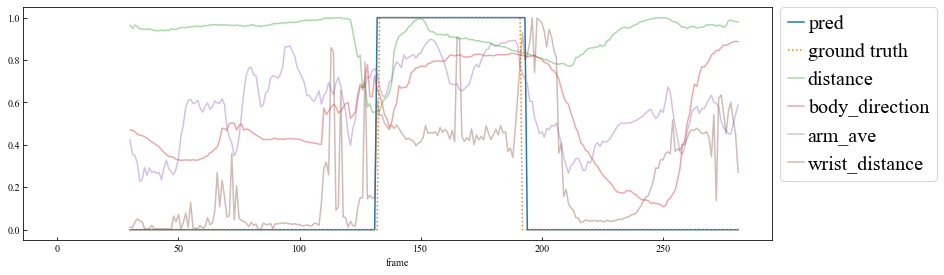

09_002_04_28_26


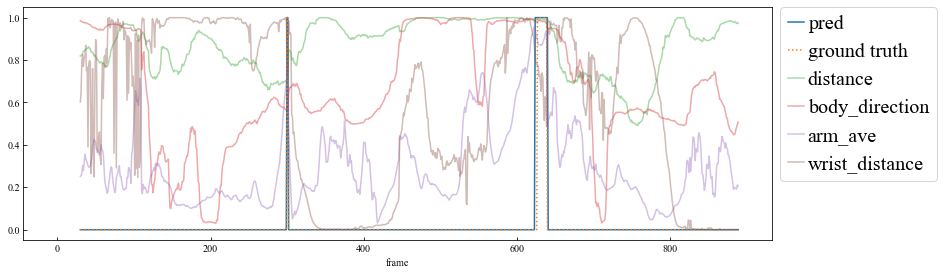

08_002_34_396_390


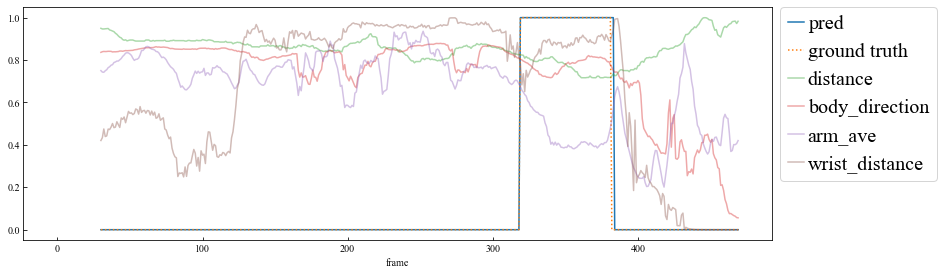

09_002_10_99_101


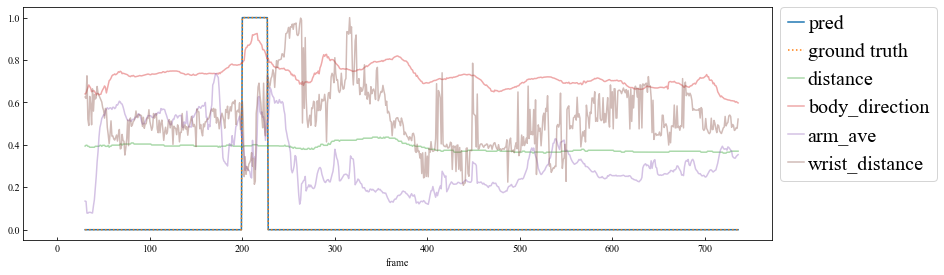

08_002_06_71_72


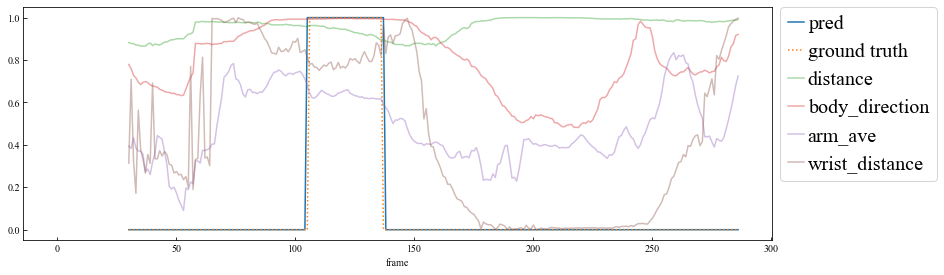

08_002_17_206_182


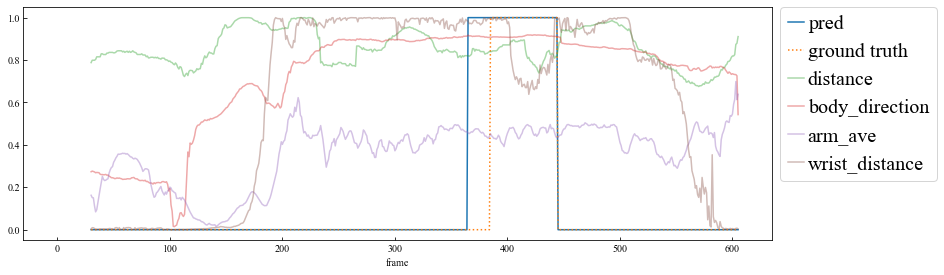

09_002_12_92_99


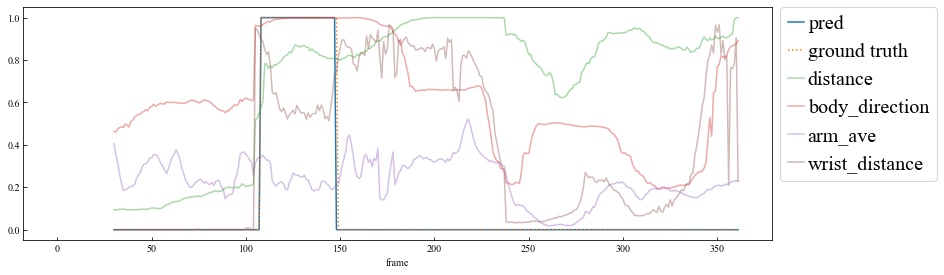

07_001_10_167_158


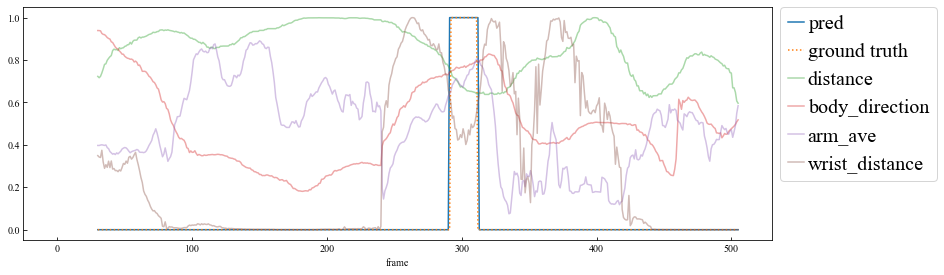

08_001_38_392_393


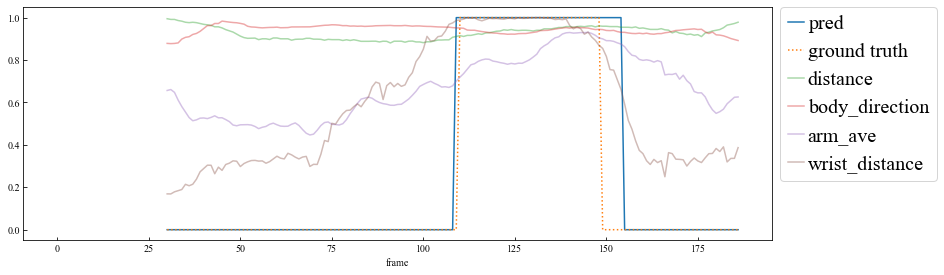

08_001_37_384_385


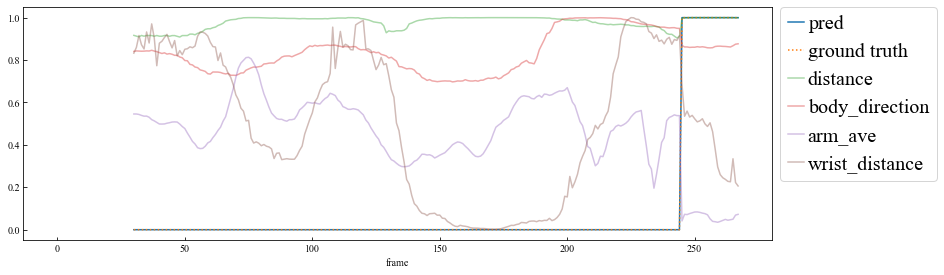

08_002_15_154_153


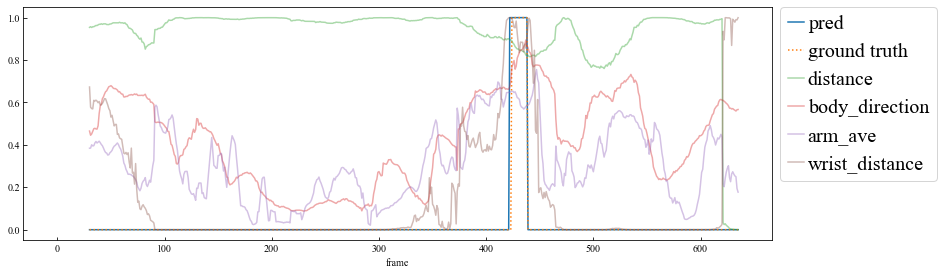

09_002_16_176_189


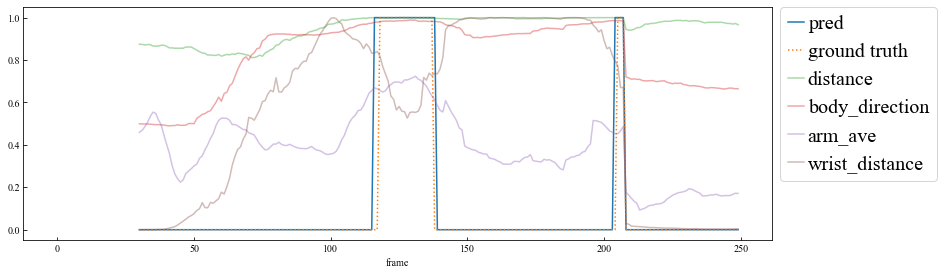

07_001_48_672_663


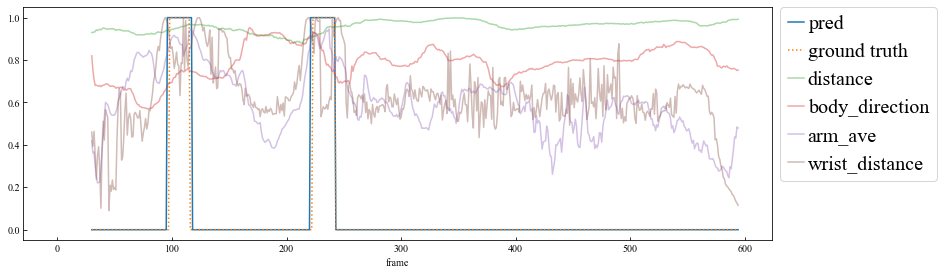

08_001_16_173_176


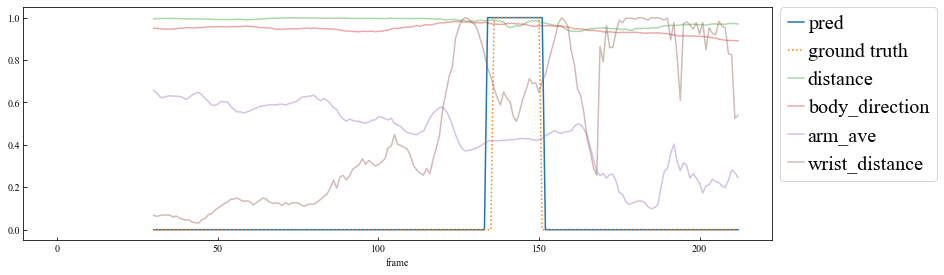

08_001_41_418_419


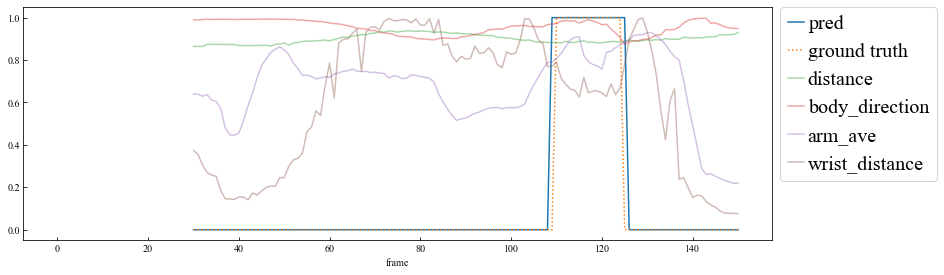

02_001_20_268_266


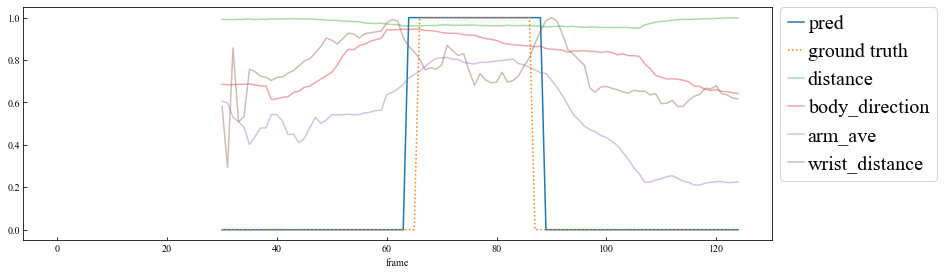

07_001_25_390_392


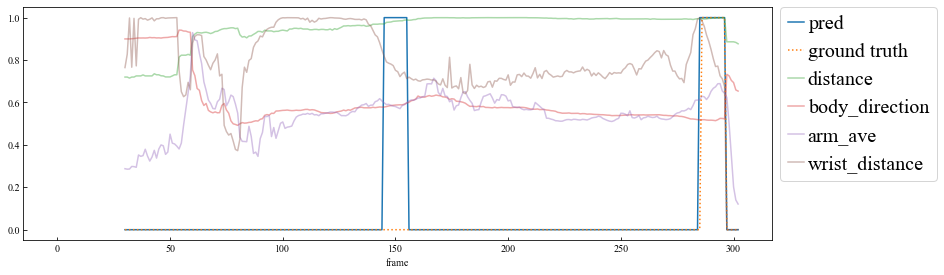

08_002_10_72_110


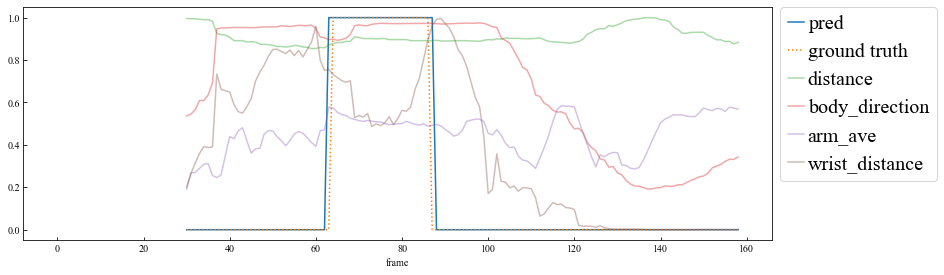

08_002_26_302_308


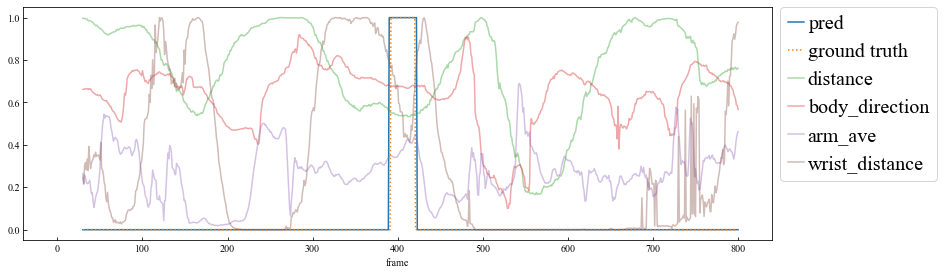

08_002_03_37_41


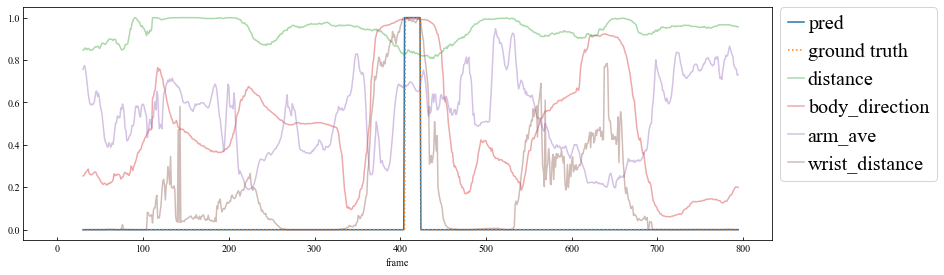

02_001_04_43_42


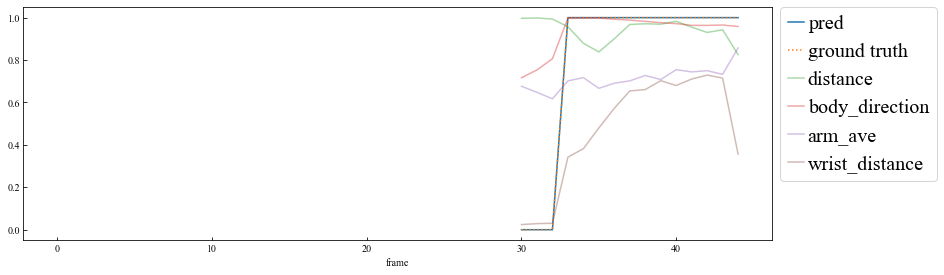

08_002_36_403_404


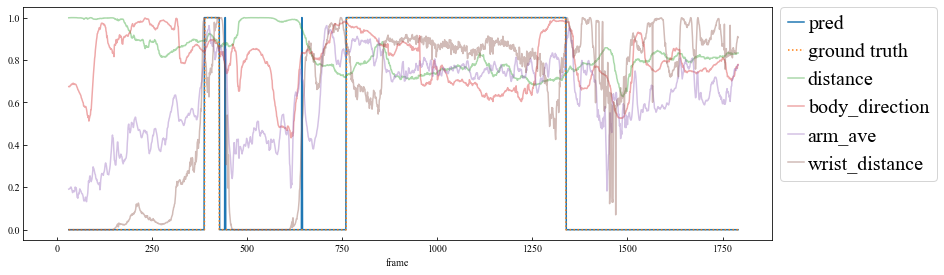

08_002_42_439_446


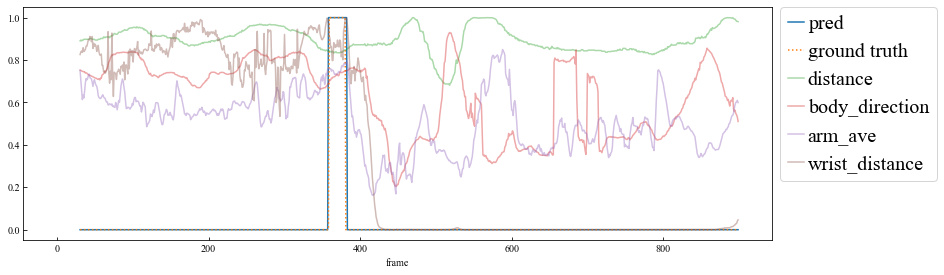

02_001_22_289_295


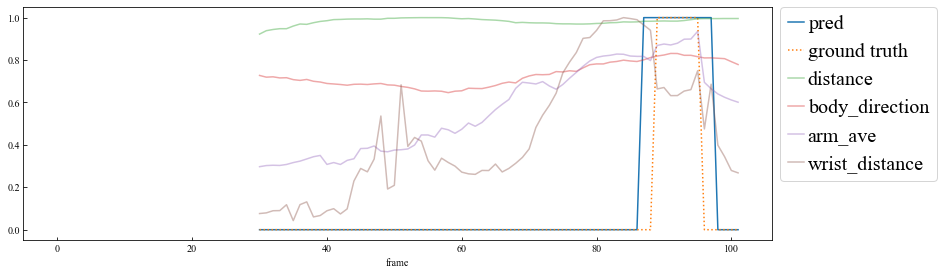

08_002_23_266_279


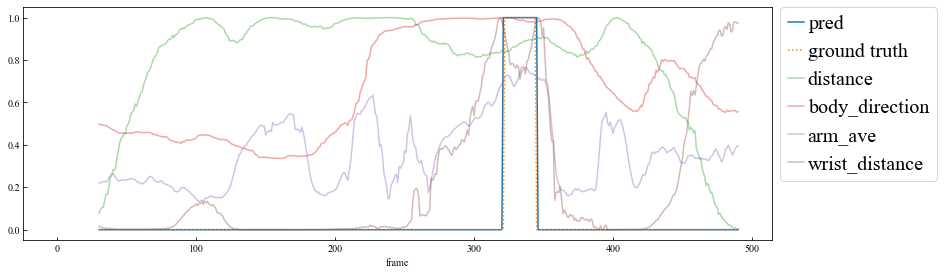

08_002_21_243_245


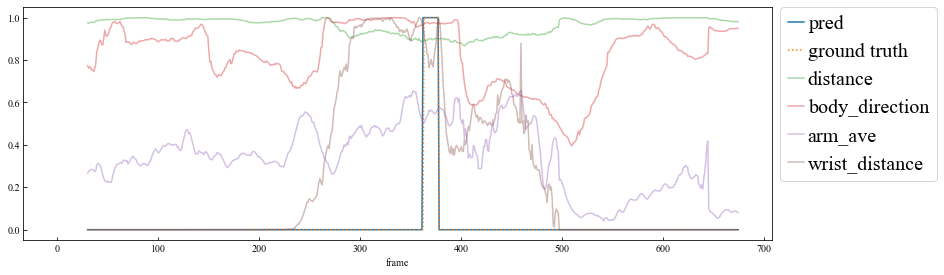

In [22]:
y_all_train = []
pred_all_train = []
y_eve_train = []
pred_eve_train = []

model.eval()
with torch.no_grad():
    for key in train_keys:
        x_lst = np.array(x_dict[key])
        y_lst = y_dict[key]
        
        x, _ = create_sequence(x_lst, y_lst, seq_len, size)
        x = torch.Tensor(np.array(x)).float().to(device)
        
        if len(x) == 0:
            continue

        pred = model(x)
        pred = pred.max(1)[1]
        pred = pred.cpu().numpy()

        x_lst = x_lst[seq_len - 1:]
        y_lst = y_lst[seq_len - 1:]
            
        y_all_train += y_lst
        pred_all_train += pred.tolist()
        y_eve_train.append(1 in y_lst)
        pred_eve_train.append(1 in pred.tolist())
        
        if 1 not in y_lst:
            continue
            
        print(key)
        path = None
        if key in save_keys:
            path = os.path.join("data", "passing", "image", f"rnn_test_{key}.pdf")
        plot(x_lst, y_lst, pred, seq_len, path=path)

In [23]:
print('accuracy: {:.3f}'.format(accuracy_score(y_all_train, pred_all_train)))
print('precision: {:.3f}'.format(precision_score(y_all_train, pred_all_train)))
print('recall: {:.3f}'.format(recall_score(y_all_train, pred_all_train)))
print('f1_score: {:.3f}'.format(f1_score(y_all_train, pred_all_train)))

accuracy: 1.000
precision: 0.921
recall: 1.000
f1_score: 0.959


In [24]:
# per event
print('accuracy: {:.3f}'.format(accuracy_score(y_eve_train, pred_eve_train)))
print('precision: {:.3f}'.format(precision_score(y_eve_train, pred_eve_train)))
print('recall: {:.3f}'.format(recall_score(y_eve_train, pred_eve_train)))
print('f1_score: {:.3f}'.format(f1_score(y_eve_train, pred_eve_train)))

accuracy: 0.994
precision: 0.806
recall: 1.000
f1_score: 0.892


## テストデータ

In [25]:
save_keys = [
    '08_03_2_5',
]

08_002_40_439_446


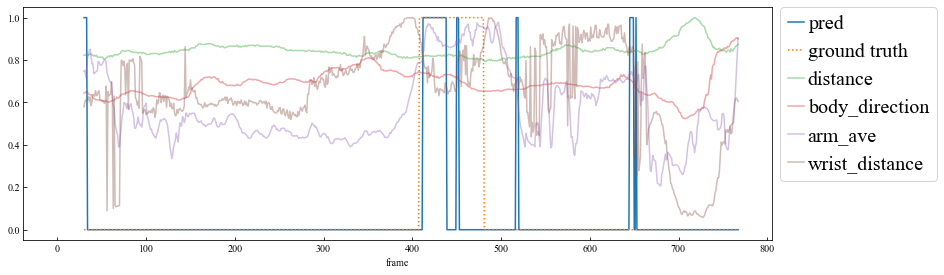

09_001_03_40_45


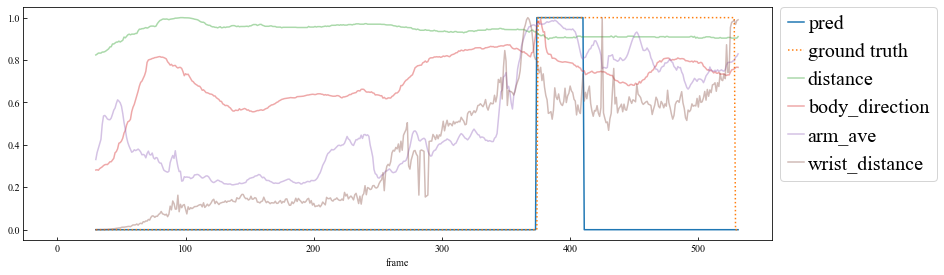

07_001_26_404_405


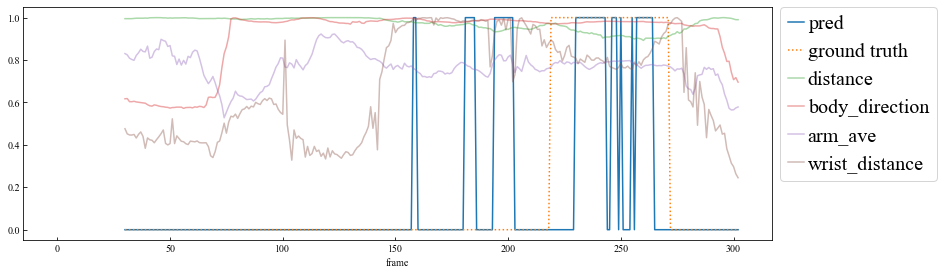

07_001_04_58_50


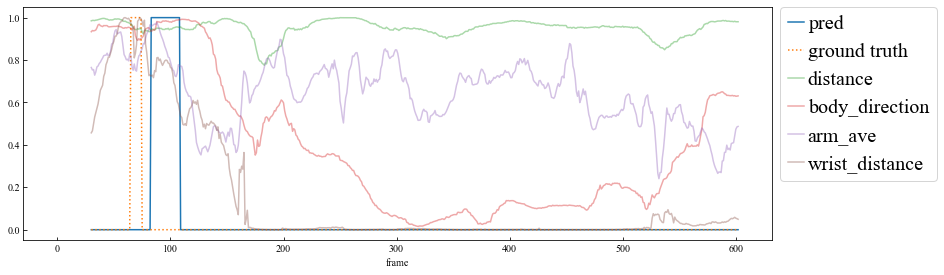

08_002_31_362_344


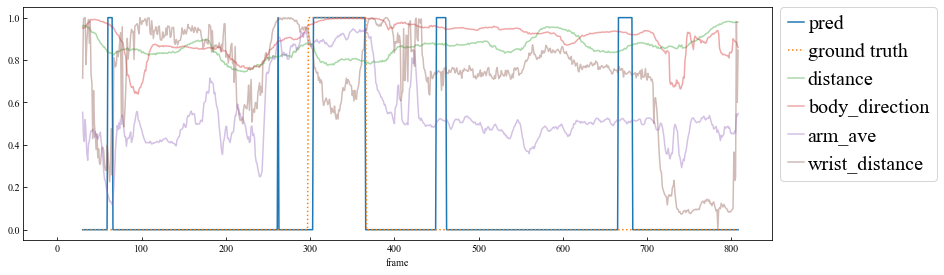

07_001_36_505_543


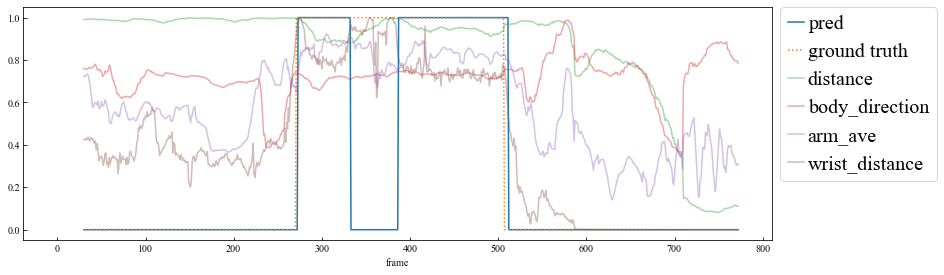

07_001_20_304_333


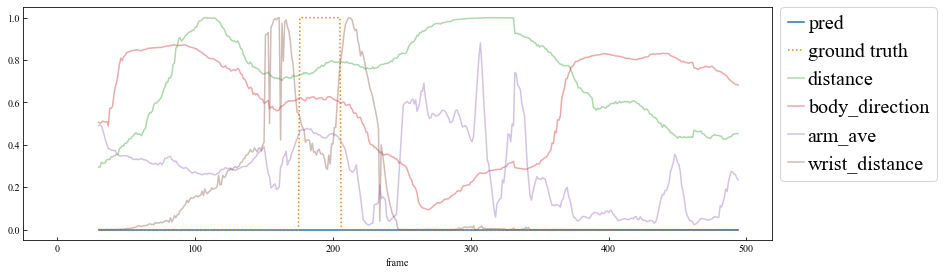

08_002_30_351_353


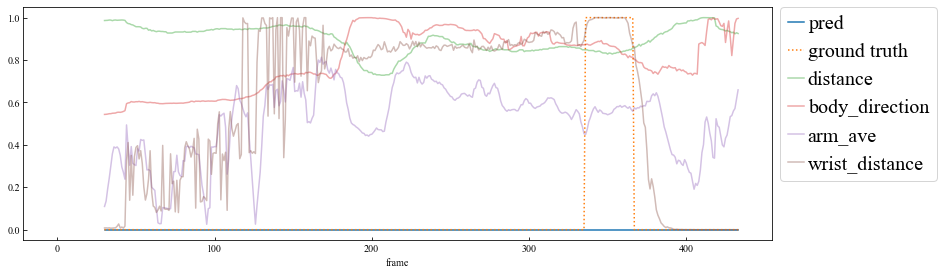

07_001_17_265_285


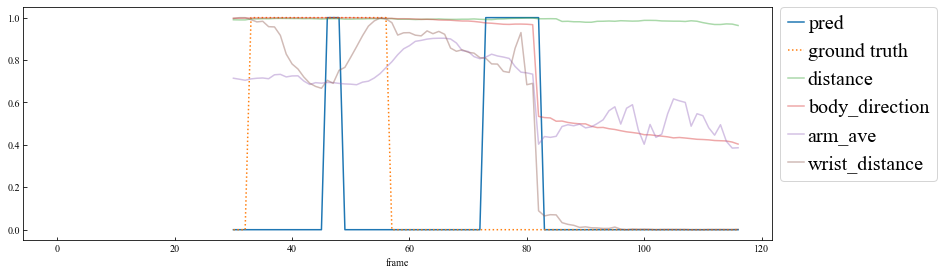

07_001_49_663_672


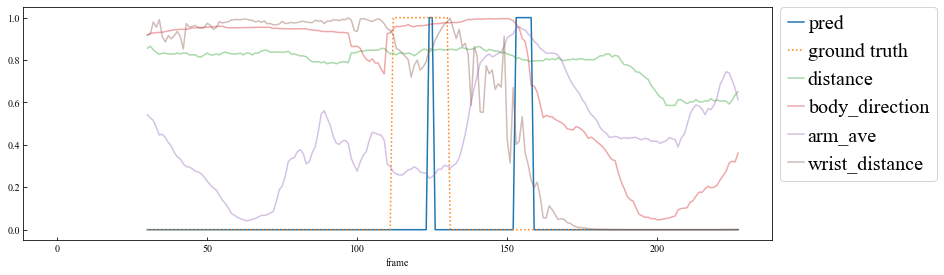

08_002_33_362_344


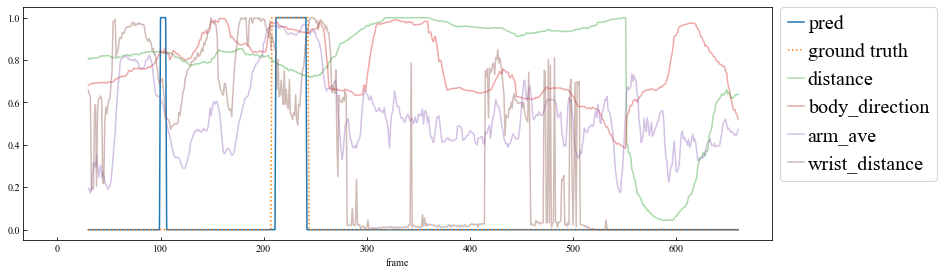

07_001_50_684_672


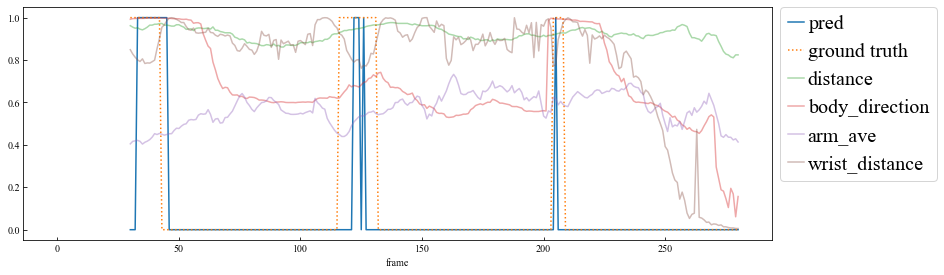

08_001_32_338_337


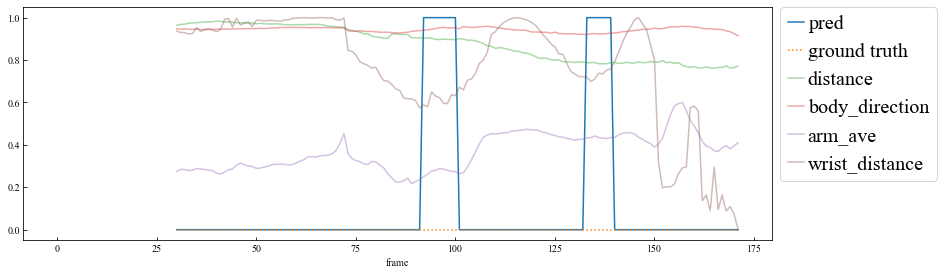

02_001_23_304_309


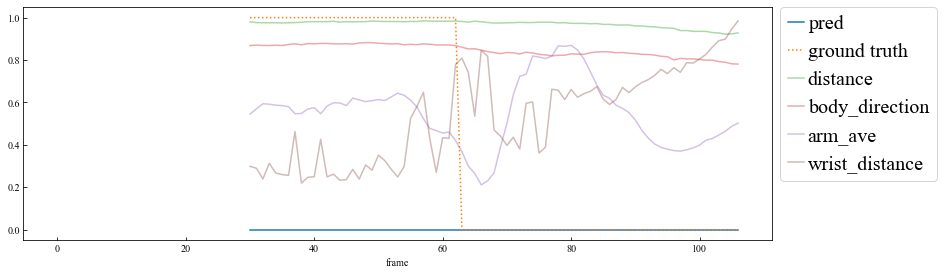

08_001_08_73_74


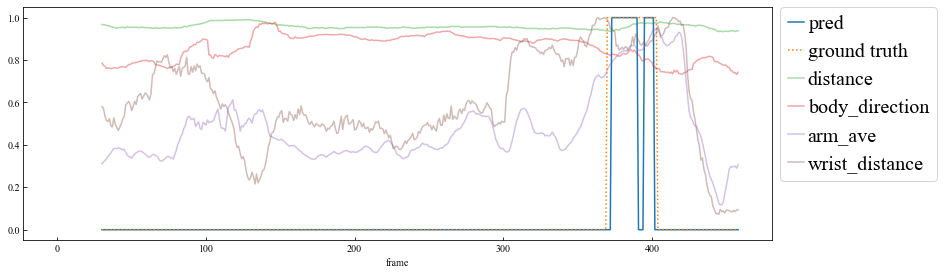

08_002_18_217_221


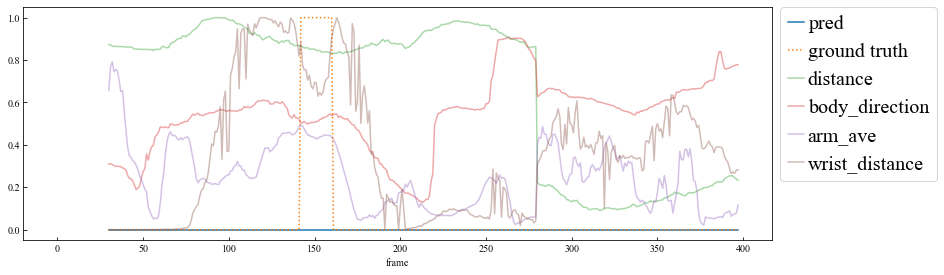

07_001_11_167_158


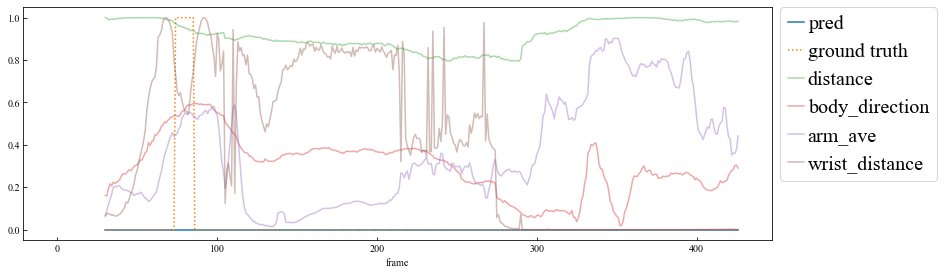

08_002_27_302_328


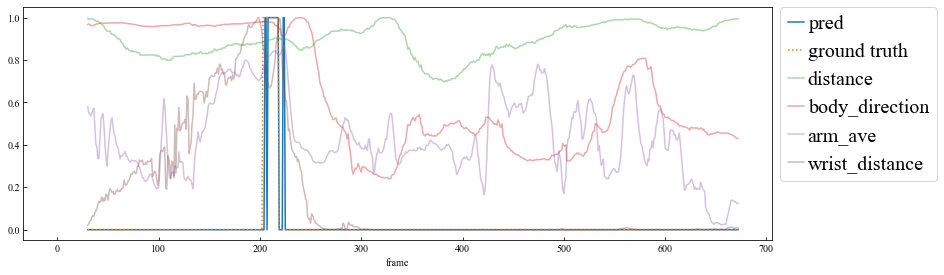

08_001_27_292_285


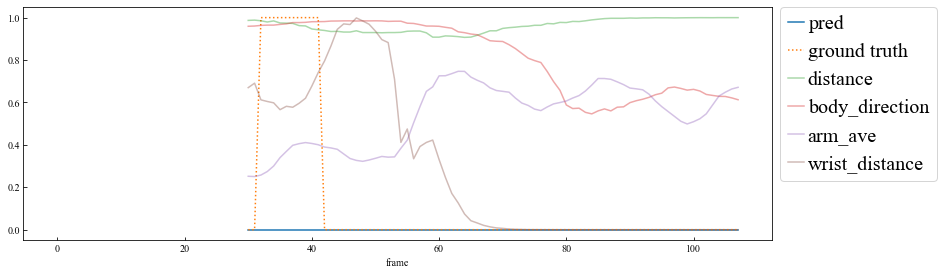

09_001_04_60_59


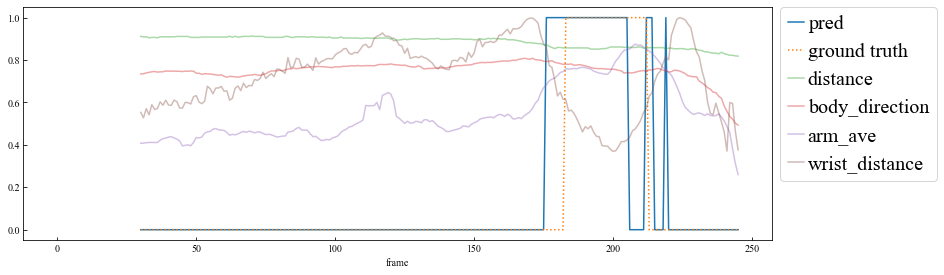

02_001_02_10_13


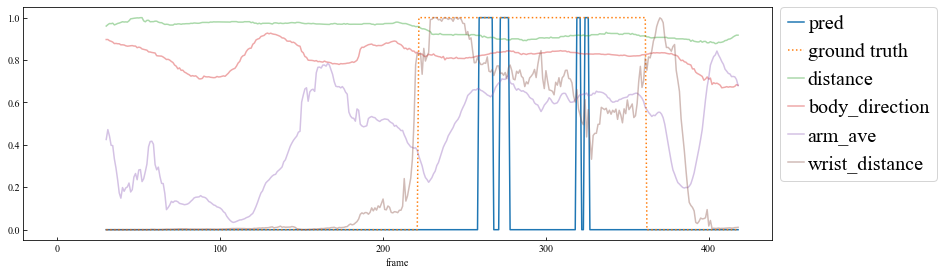

07_001_03_33_28


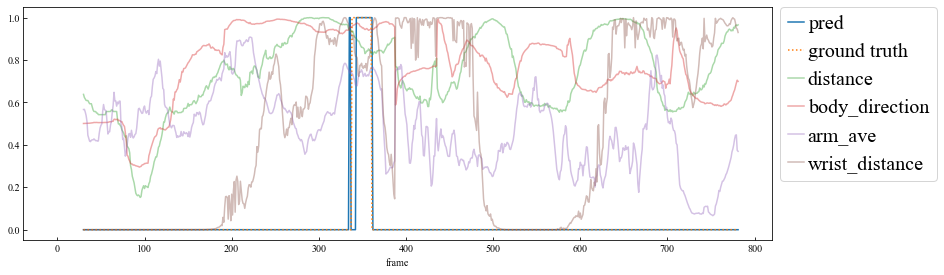

07_001_07_121_116


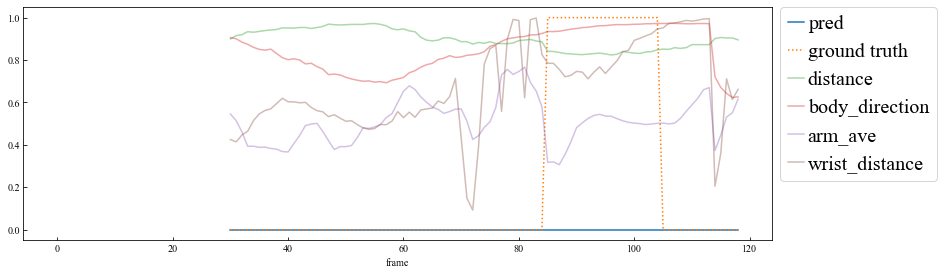

09_001_06_82_85


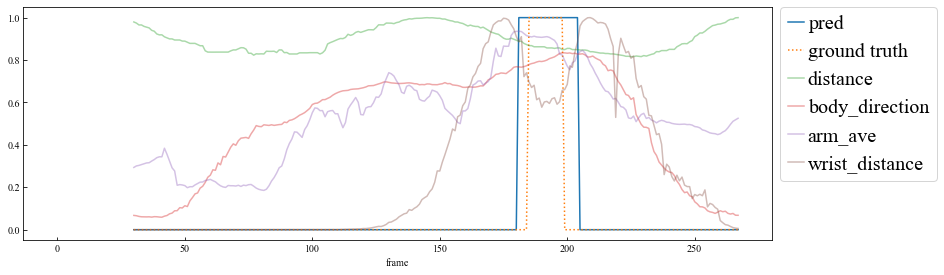

02_001_02_10_11


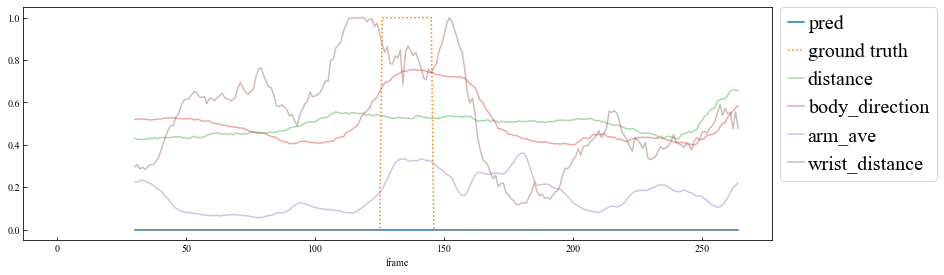

02_001_10_125_119


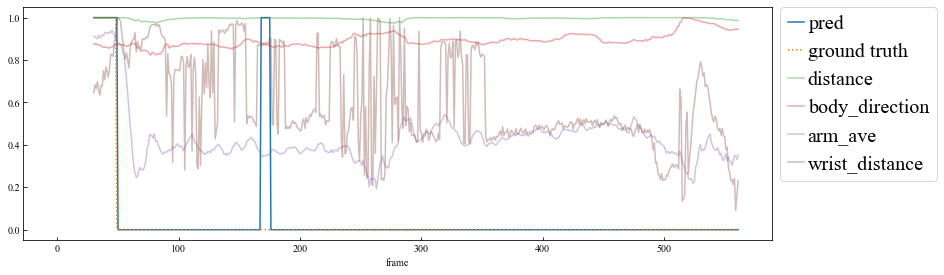

07_001_23_356_367


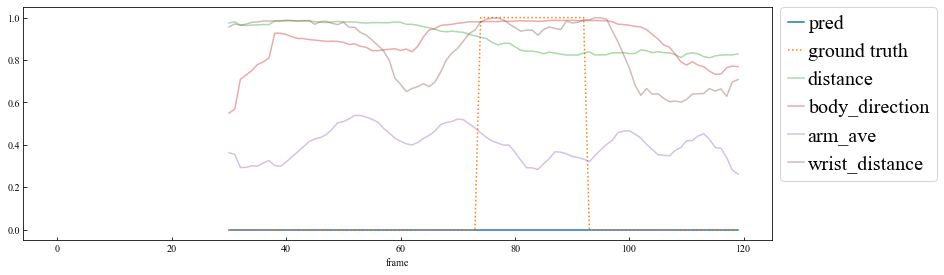

09_001_09_114_116


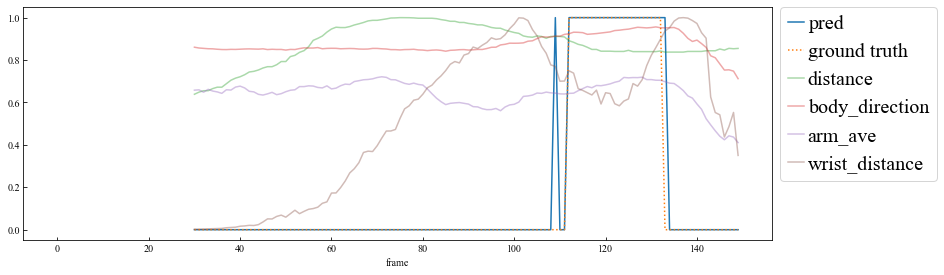

09_002_06_63_50


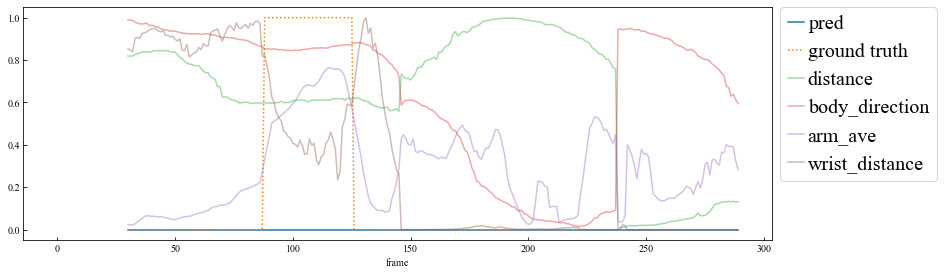

09_002_01_4_6


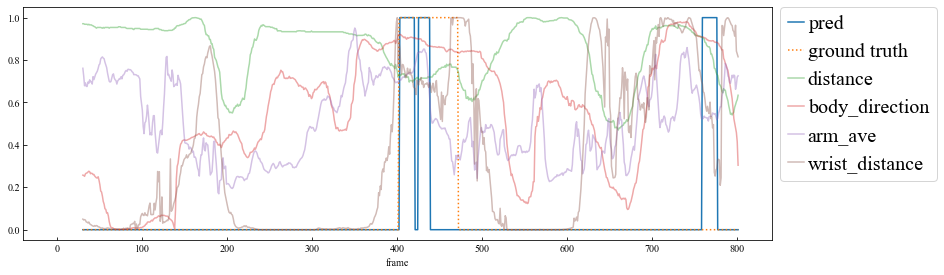

02_001_20_268_270


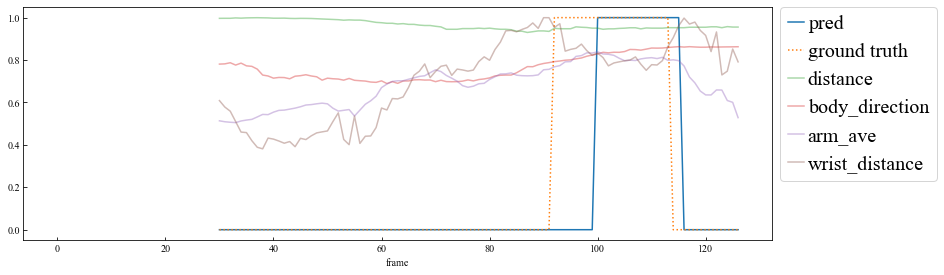

08_001_40_414_409


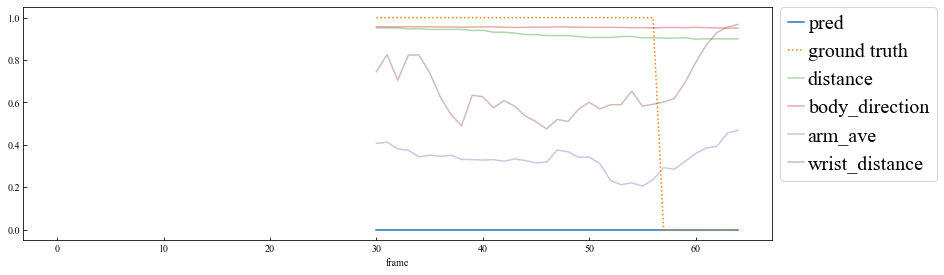

08_002_32_362_344


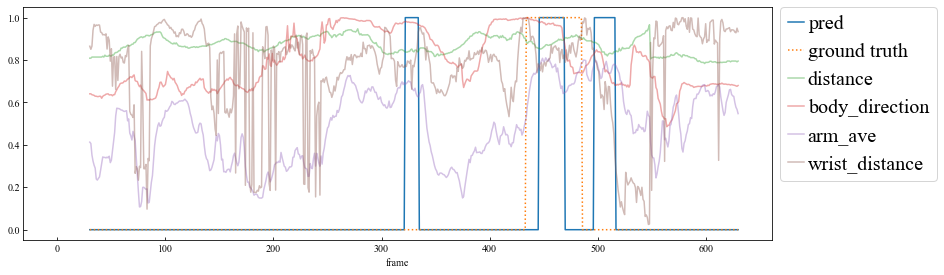

07_001_15_232_247


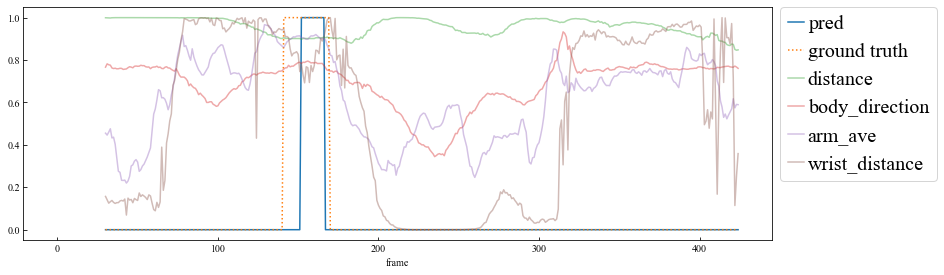

02_001_11_134_140


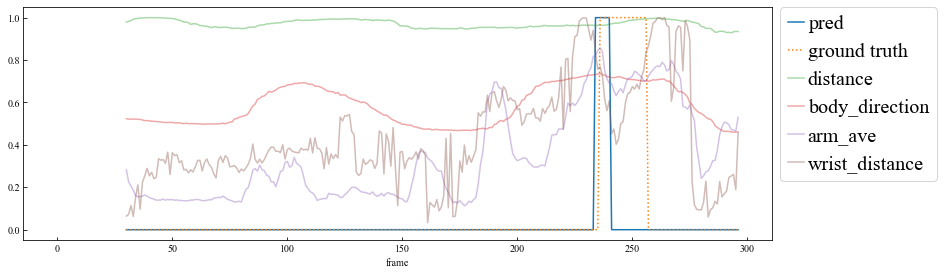

08_002_05_52_61


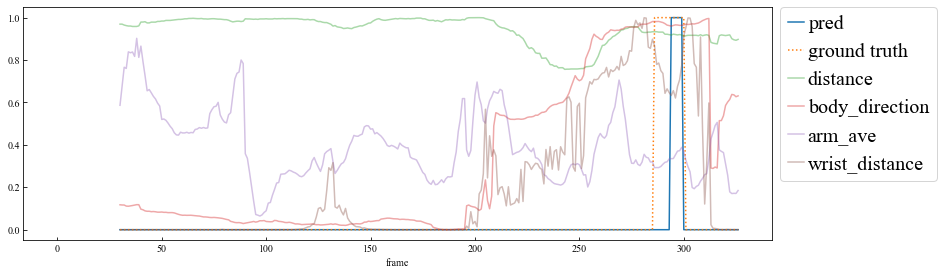

08_001_11_111_112


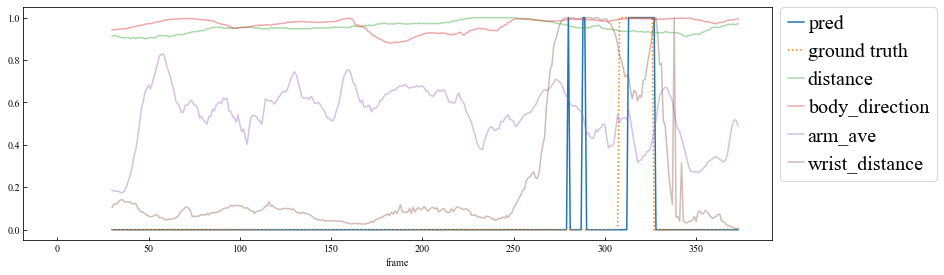

08_001_12_132_134


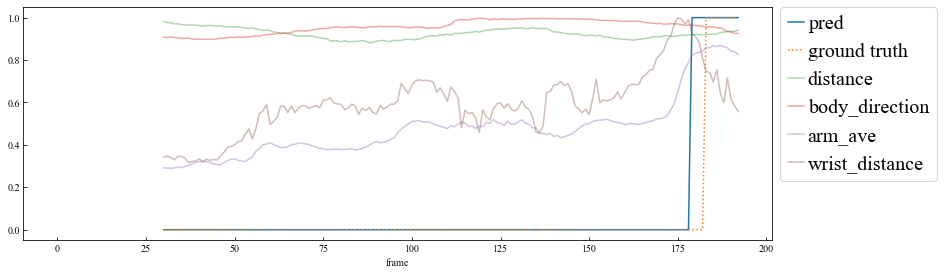

08_002_06_49_71


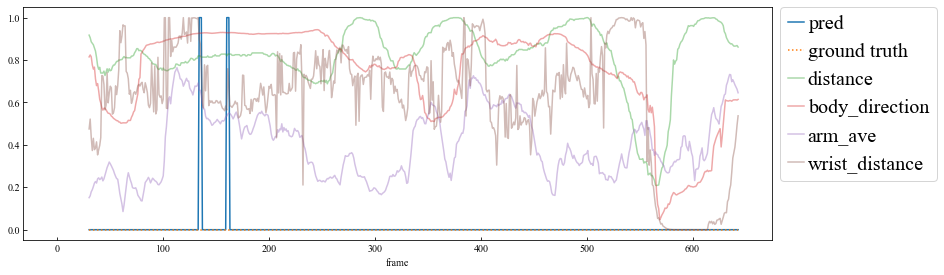

02_001_10_115_118


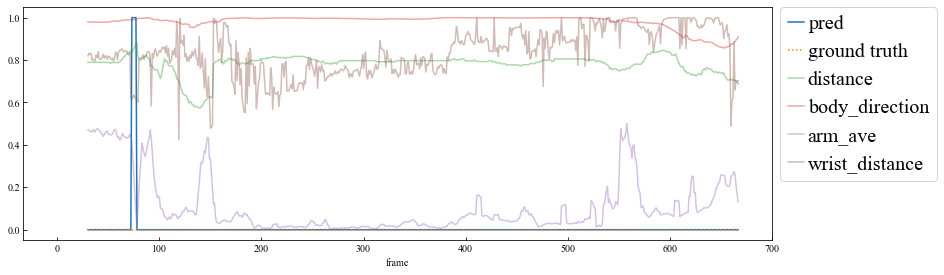

08_002_36_411_404


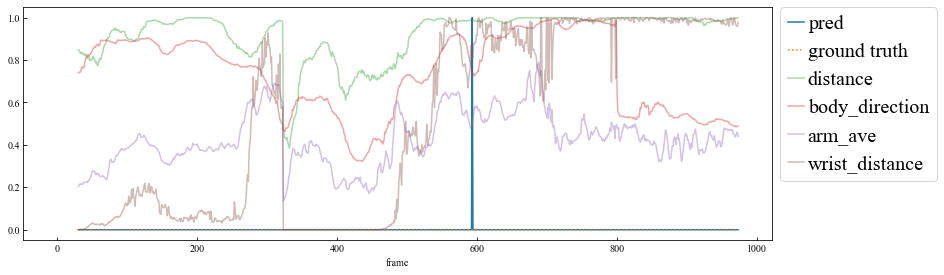

08_001_08_74_84


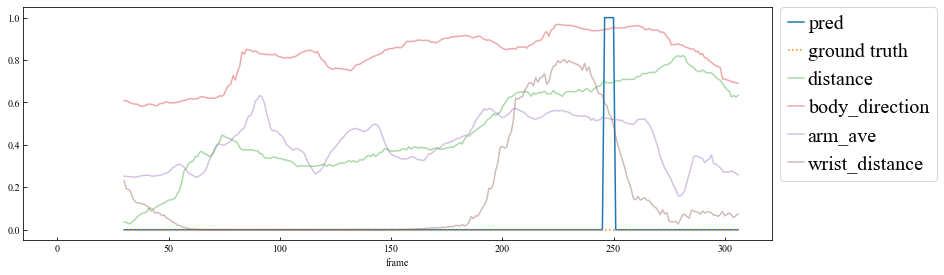

08_002_36_403_411


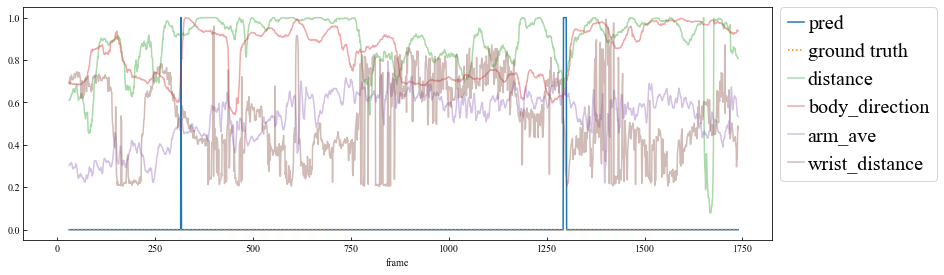

09_002_07_61_80


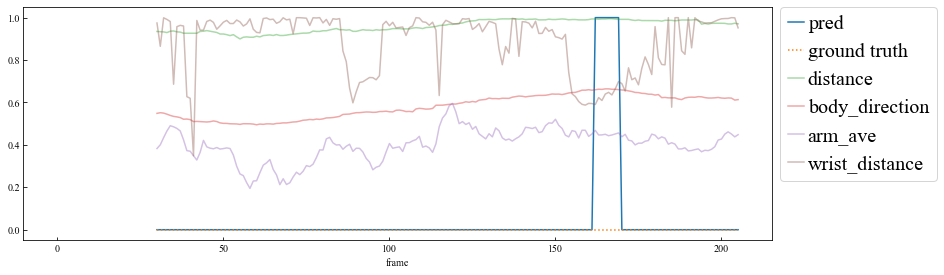

09_002_13_116_130


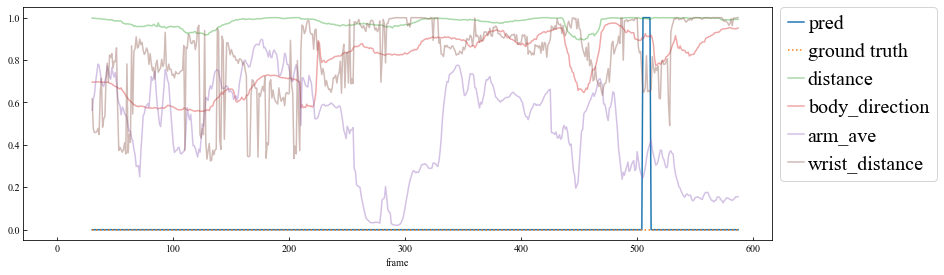

09_001_03_35_45


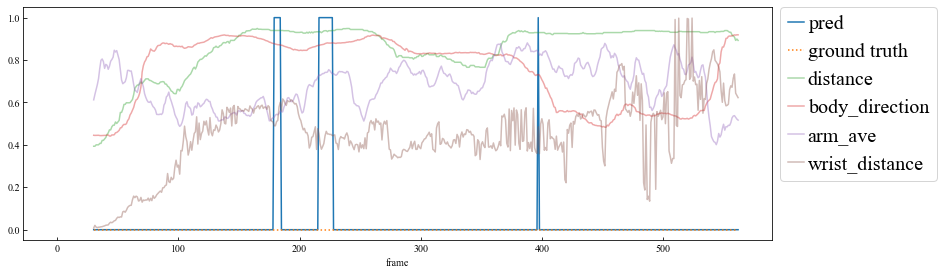

09_002_03_11_26


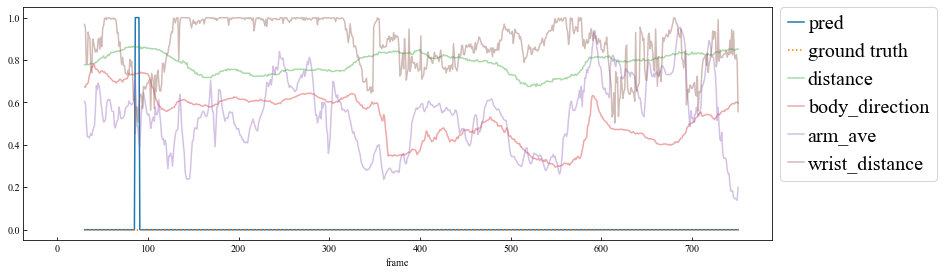

08_001_24_246_250


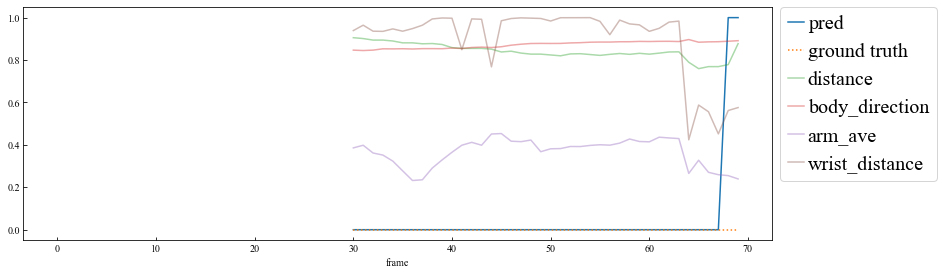

08_002_37_403_412


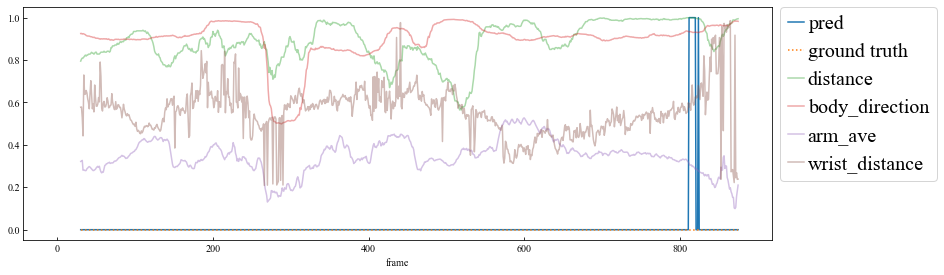

09_002_03_26_30


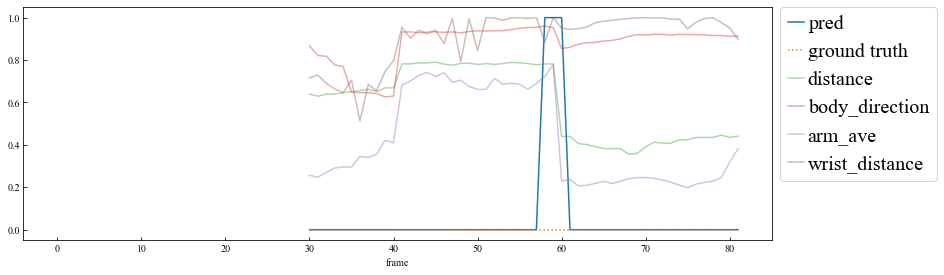

08_001_14_151_156


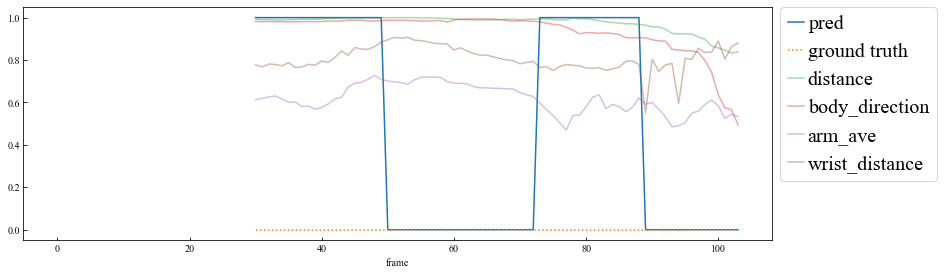

07_001_02_2_20


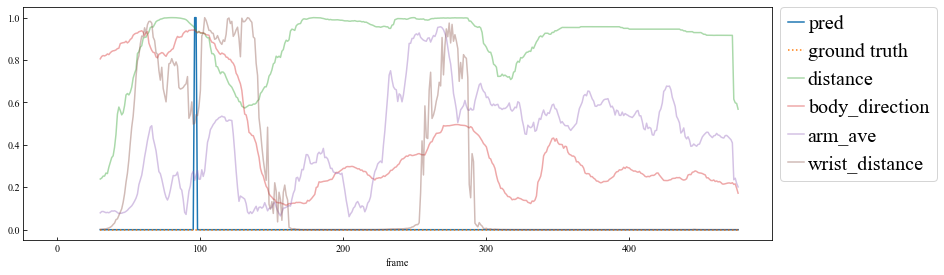

08_002_02_10_29


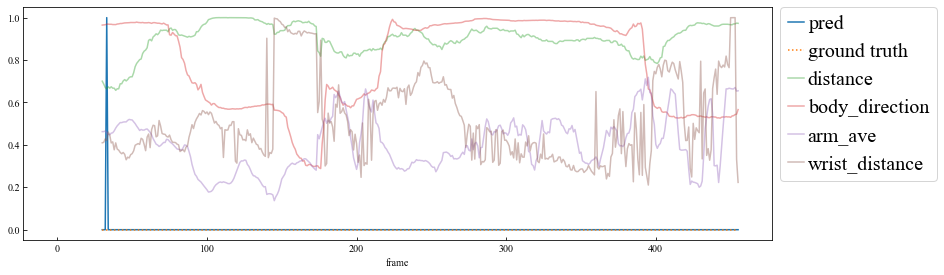

08_002_33_362_385


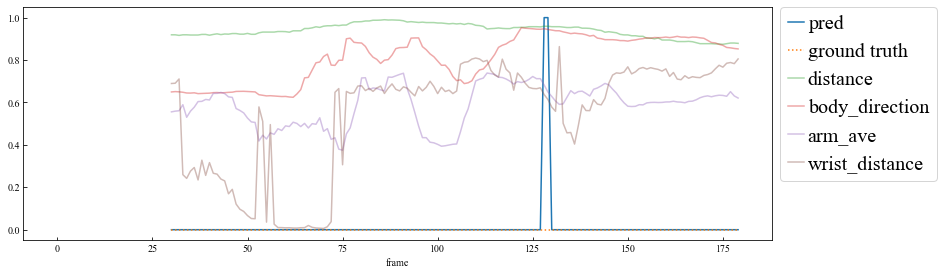

02_001_05_54_50


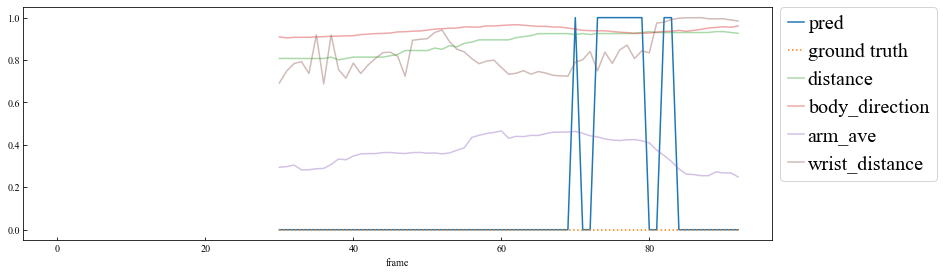

07_001_34_506_531


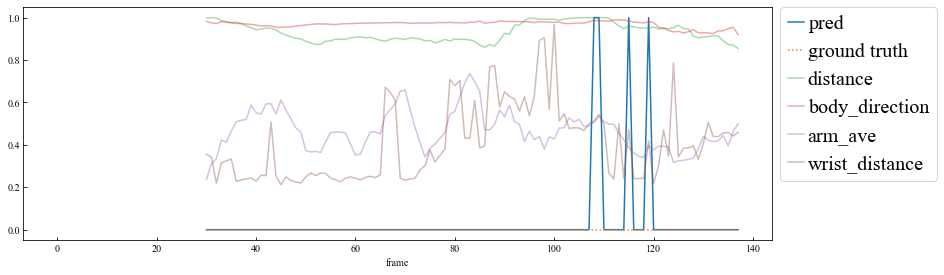

08_002_25_297_302


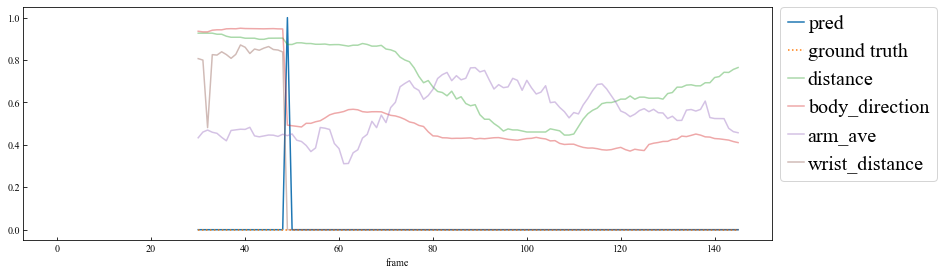

09_001_04_56_62


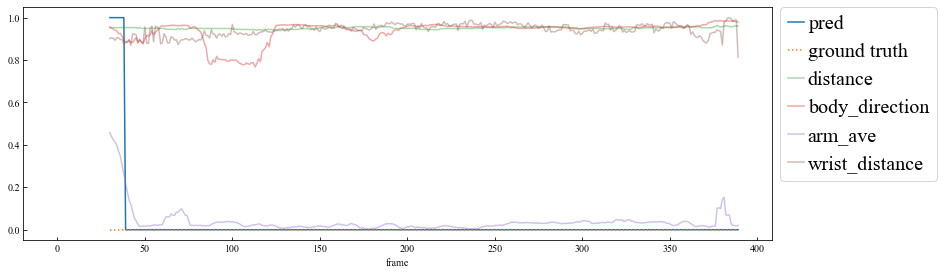

08_001_38_393_398


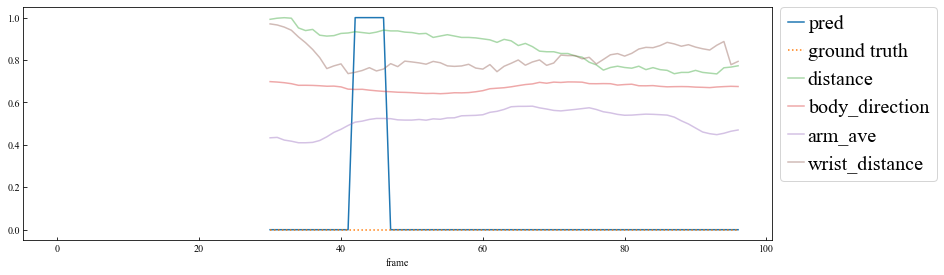

08_002_26_298_303


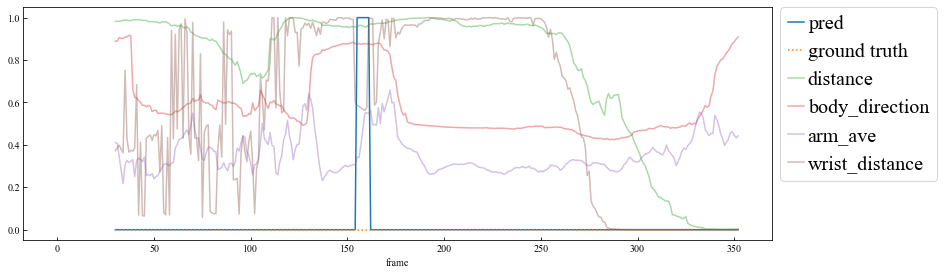

09_001_04_60_58


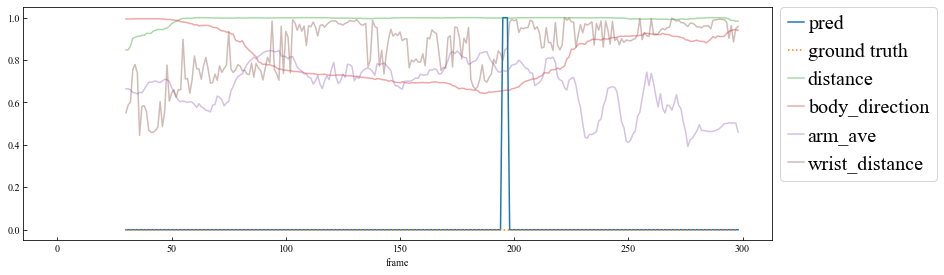

09_002_10_85_101


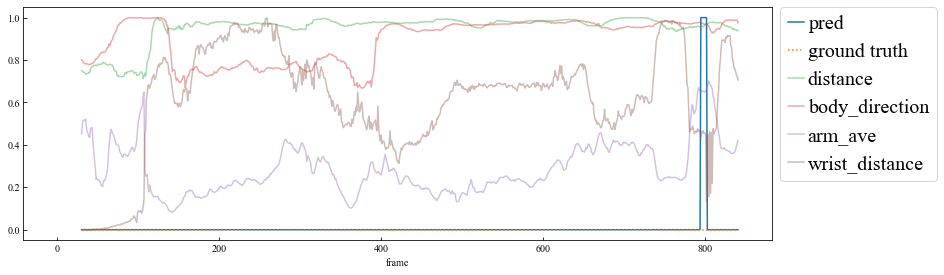

08_002_08_91_72


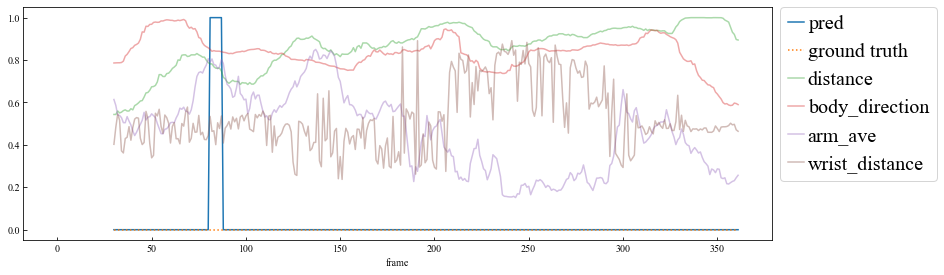

08_002_13_129_126


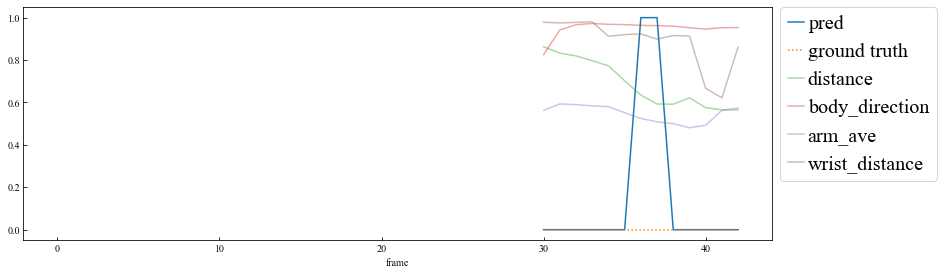

09_002_14_165_158


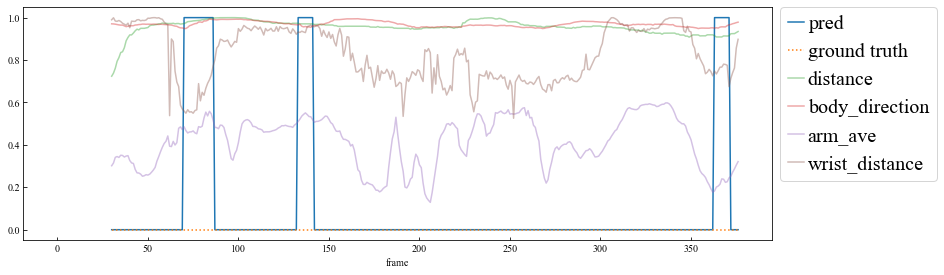

08_002_45_446_470


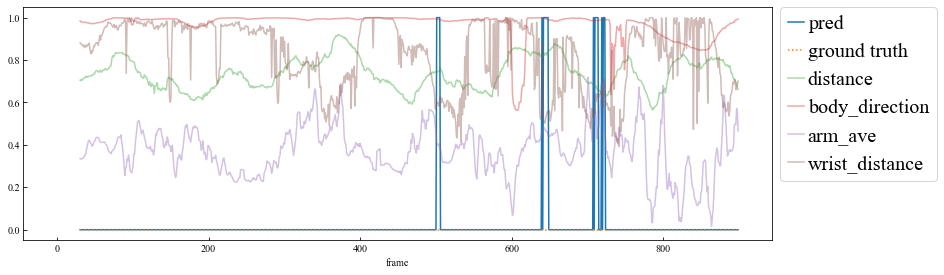

09_002_09_85_99


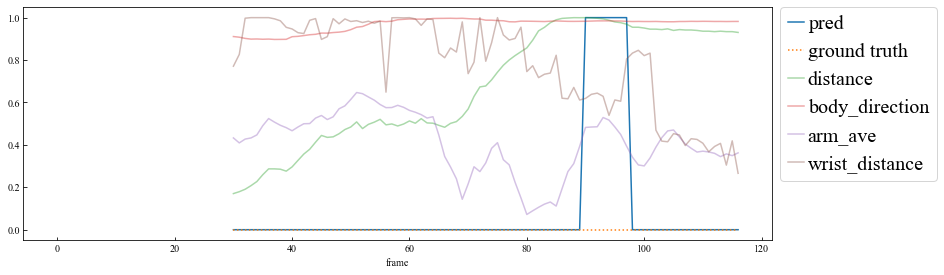

09_002_13_134_146


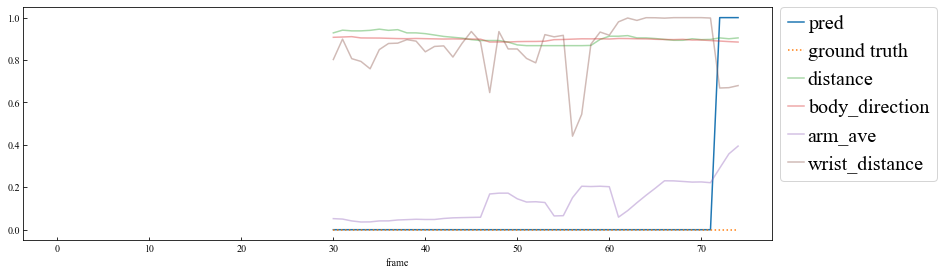

08_001_10_99_102


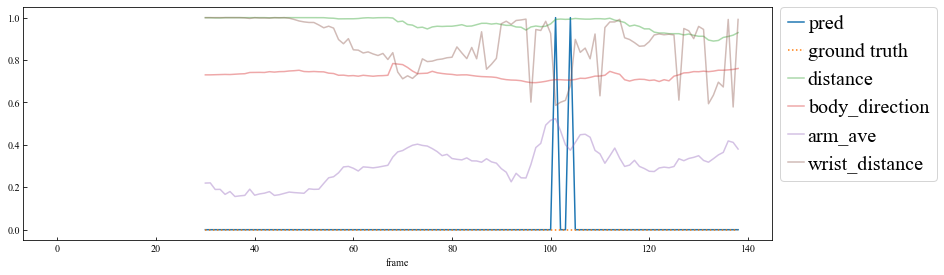

09_002_01_6_8


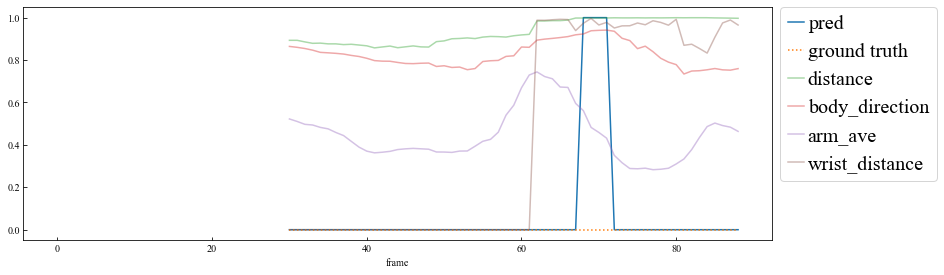

08_002_20_239_250


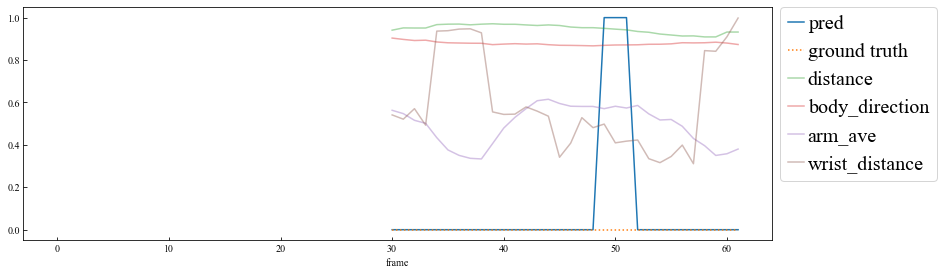

09_001_03_37_45


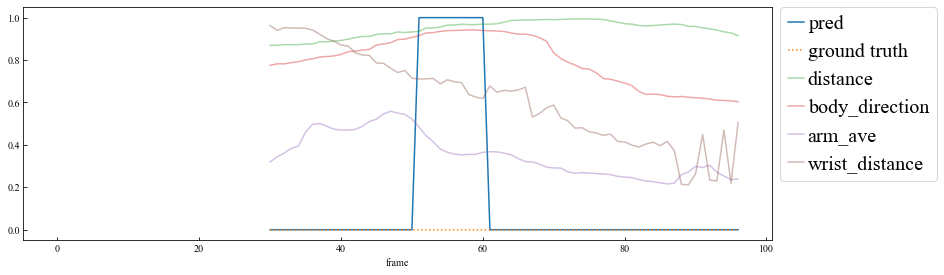

07_001_18_298_293


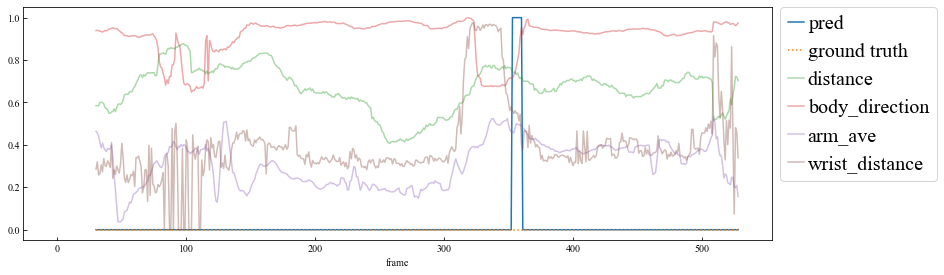

08_002_02_30_10


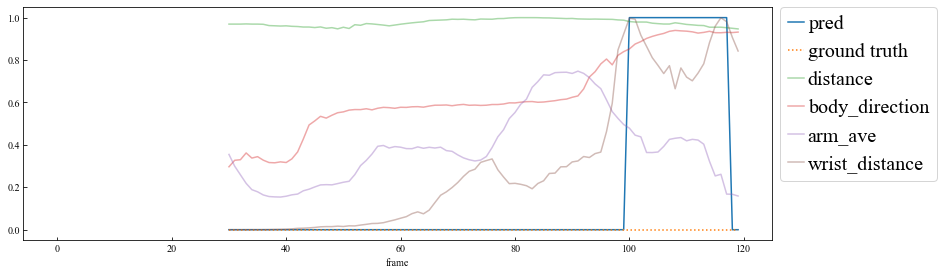

07_001_26_408_413


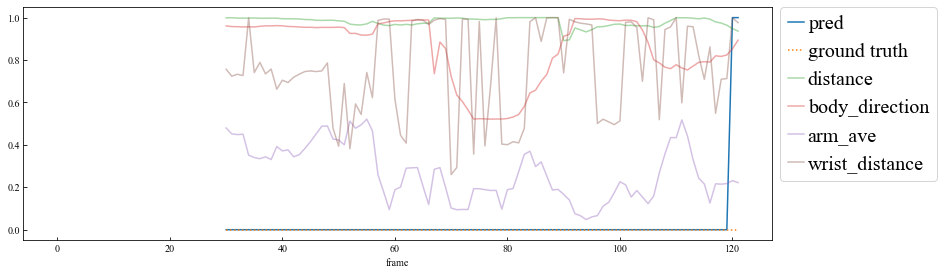

09_002_06_64_62


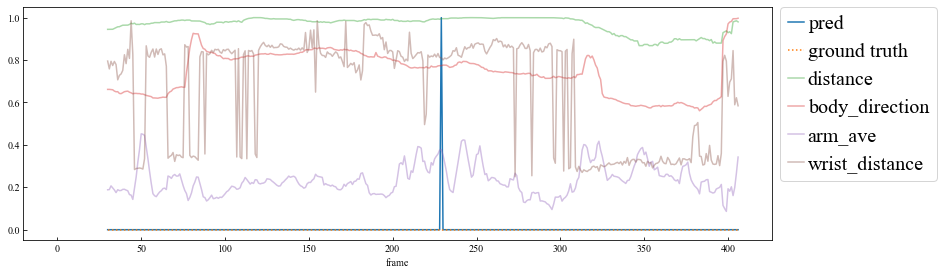

07_001_10_79_164


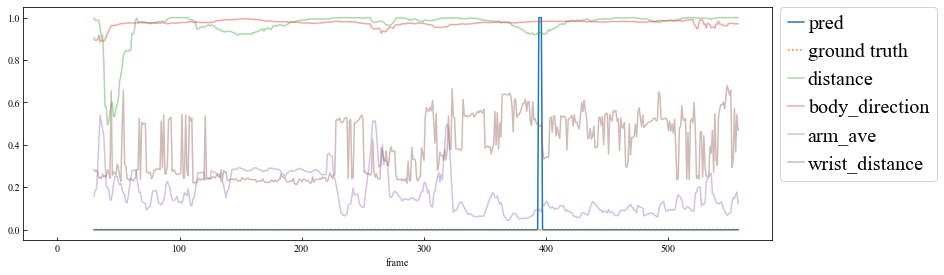

07_001_46_651_657


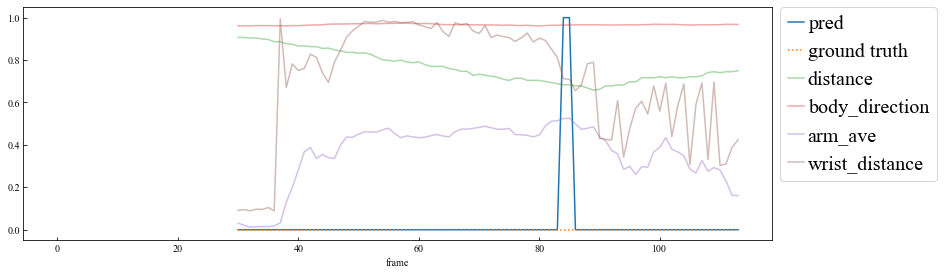

07_001_16_265_282


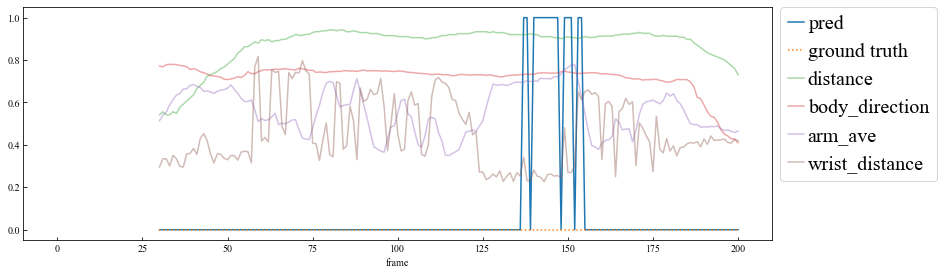

02_001_09_104_105


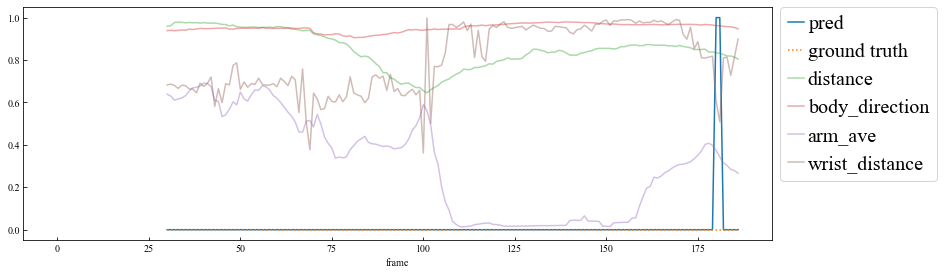

09_002_06_58_64


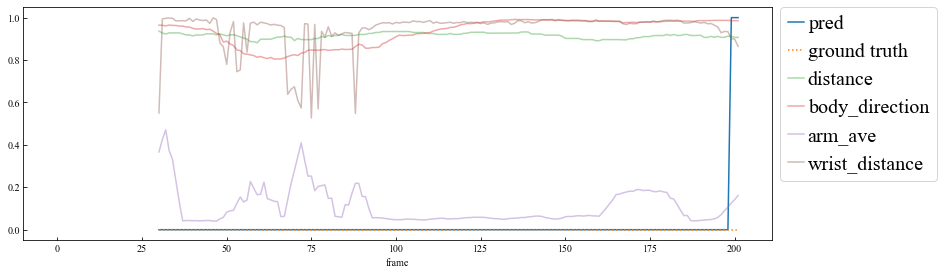

08_001_08_74_76


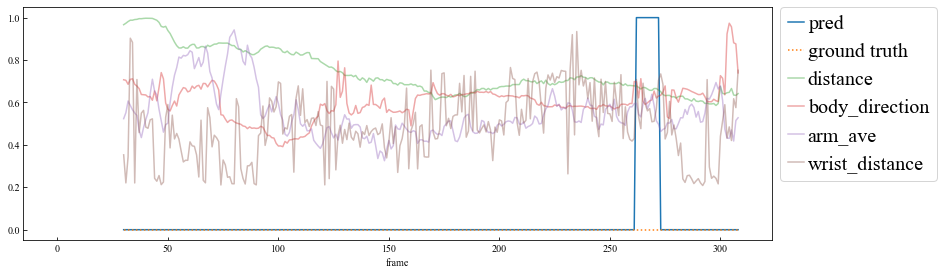

08_001_06_60_61


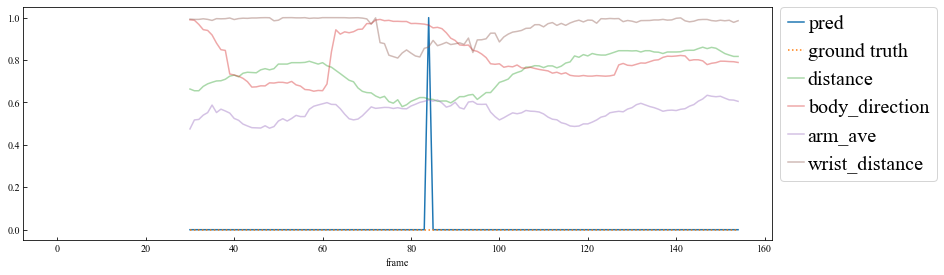

07_001_33_506_508


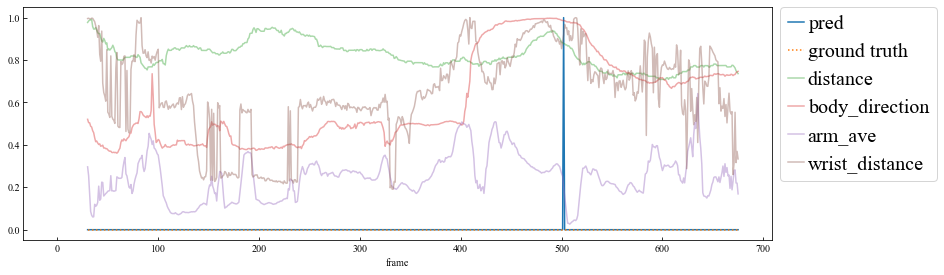

08_002_07_72_88


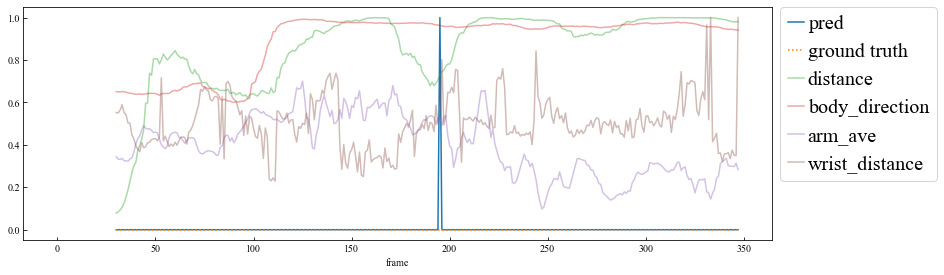

In [26]:
y_all_test = []
pred_all_test = []
y_eve_test = []
pred_eve_test = []
tn, fn = 0, 0

model.eval()
with torch.no_grad():
    for key in test_keys:
        x_lst = np.array(x_dict[key])
        y_lst = y_dict[key]

        x, _ = create_sequence(x_lst, y_lst, seq_len, size)
        x = torch.Tensor(x).float().to(device)

        if len(x) == 0:
            tn += 1
            continue
            
        pred = model(x)
        pred = pred.max(1)[1]
        pred = pred.cpu().numpy()

        x_lst = x_lst[seq_len - 1:]
        y_lst = y_lst[seq_len - 1:]
        
        y_all_test += y_lst
        pred_all_test += pred.tolist()
        y_eve_test.append(1 in y_lst)
        pred_eve_test.append(1 in pred.tolist())
        if 1 not in y_lst:
            if 1 not in pred:
                tn += 1
            else:
                fn += 1
        
        if 1 not in pred and 1 not in y_lst:
            continue
            
        print(key)
        path = None
        if key in save_keys:
            path = os.path.join("data", "passing", "image", f"rnn_test_{key}.pdf")
        plot(x_lst, y_lst, pred, seq_len, path=path)

accuracy: 0.995
precision: 0.537
recall: 0.439
f1_score: 0.483


<AxesSubplot:>

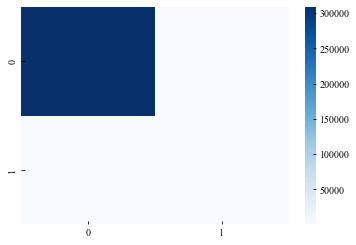

In [27]:
print('accuracy: {:.3f}'.format(accuracy_score(y_all_test, pred_all_test)))
print('precision: {:.3f}'.format(precision_score(y_all_test, pred_all_test)))
print('recall: {:.3f}'.format(recall_score(y_all_test, pred_all_test)))
print('f1_score: {:.3f}'.format(f1_score(y_all_test, pred_all_test)))

cm = confusion_matrix(y_all_test, pred_all_test)
sns.heatmap(cm, cmap='Blues')

accuracy: 0.962
precision: 0.351
recall: 0.703
f1_score: 0.468
true negative: 3149
false negative: 48


<AxesSubplot:>

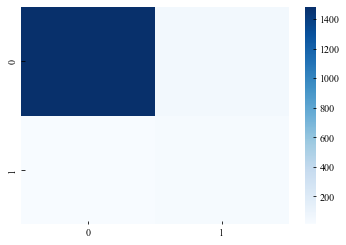

In [28]:
# per event
print('accuracy: {:.3f}'.format(accuracy_score(y_eve_test, pred_eve_test)))
print('precision: {:.3f}'.format(precision_score(y_eve_test, pred_eve_test)))
print('recall: {:.3f}'.format(recall_score(y_eve_test, pred_eve_test)))
print('f1_score: {:.3f}'.format(f1_score(y_eve_test, pred_eve_test)))

print('true negative:', tn)
print('false negative:', fn)

cm = confusion_matrix(y_eve_test, pred_eve_test)
sns.heatmap(cm, cmap='Blues')